# Electricity Data Analysis of Tulkarm Municipality

In [18]:
import matplotlib.pyplot as plt
import pandas as pd
from pandas import DataFrame
%matplotlib inline
import numpy as np
from sklearn import datasets, linear_model
import seaborn as sns
import matplotlib.patches as mpatches

In [19]:
def plot_value_labels(axis):
    rects = axis.patches

    # For each bar: Place a label
    for rect in rects:
        # Get X and Y placement of label from rect.
        y_value = rect.get_height()
        x_value = rect.get_x() + rect.get_width() / 2

        label = '{:.2f}'.format(y_value)

        # Vertical alignment for positive values
        va = 'bottom'

        # If value of bar is negative: Place label below bar
        if y_value < 0:
            # Invert space to place label below
            space *= -1
            # Vertically align label at top
            va = 'top'

        # Create annotation
        axis.annotate(label, (x_value, y_value), 
                      xytext=(0, 2), 
                      textcoords="offset points", 
                      ha='center', 
                      rotation=45, 
                      va=va)
#-------------------------------------------------------
def func(pct, allvals):
    absolute = int(pct/100.*np.sum(allvals))
    return "{:.1f}%\n({:d} )".format(pct, absolute)
#---------------------------------------------------------------
def get_season(a):
    if a in [6,7,8]:
        return 1
    if a in [9,10,11]:
        return 2
    else:
        return 3
#-----------------------------------------
def get_period(a):
    if a in [6,7,8,9,10]:
        return 'Morning'
    if a in [11,12,13,14,15,16,17]:
        return 'Noon'
    if a in [18,19,20]:
        return 'Evening'
    else:
          return 'Night'
#--------------------------------------------
def get_peak(a):
    if a in [6,7,8,9,10,17,18,19,20]:
        return 1 # Peak
    else: 
        return 2 # offpeak
#---------------- 
def get_weekend(a):
    if a in [3,5]:
        return 1 # weekend
    else: 
        return 0 # week day
#--------------------------

# Definitions

# Clients Categories and Categories Prices (Tariff ) 

In [20]:
def read_data(filename='C:\\Users\\AbuBaker\\Desktop\\elect_data\\Tarif.xlsx'):
    xlsx = pd.ExcelFile(filename)
    electdata = pd.read_excel(xlsx, 'Sheet1')
    return electdata
df1 = read_data()
tarifno_list=df1['TarifNo']
tarifname_list = df1['Category']
df1.head(len(df1))

,TarifNo,Category,Price
0,1,Muncipality Employee,0.470
1,2,Agricultural,0.540
2,3,Houshold,0.583
3,4,Manufactural,0.595
4,5,Governmental,0.697
5,6,Commercial,0.698
6,7,Multiple Temporary,0.925
7,8,Current Adapter 200 Amp Agr.,21.600
8,9,Current Adapter 400 Amp Agr.,43.210
9,10,Current Adapter 600 Amp Agr.,64.800


# Areas

In [21]:
def read_data(filename='C:\\Users\\AbuBaker\\Desktop\\elect_data\\Clients.xlsx'):
    xlsx = pd.ExcelFile(filename)
    electdata = pd.read_excel(xlsx, 'Sheet1')
    return electdata
df1 = read_data()
df1.fillna('==',inplace=True)
areaname_list=df1['AreaName'].unique()
areano_list=df1['AreaNo'].unique()
areaname_list=['South','West','City Center','South West','East','East North','North','Al-Sowaneh','Ezbet Nasser',
                  'Ezbet Al-Jarad','Ezbet Shofeh','Kafa','Muheet Shweka','East Shweka','West Shweka','Ertah','New Ertah',
                  'Ertah Town Center','North Thenabeh','Thenabeh','AL-Salam Neighborhood','Tulkarm Camp','Banks','Ezbet Al-Taiah',
                  'Thahret Al-Shurfa','Thahret Ekbariah','Shweka','Tulkarm','Al-Rasheed','Noor Shams','Jabal Al-Sayed']
for i in range(0,len(areano_list)):
    print( areano_list[i], areaname_list[i])

1 South
4 West
5 City Center
6 South West
8 East
9 East North
10 North
11 Al-Sowaneh
12 Ezbet Nasser
13 Ezbet Al-Jarad
14 Ezbet Shofeh
15 Kafa
18 Muheet Shweka
19 East Shweka
21 West Shweka
24 Ertah
25 New Ertah
26 Ertah Town Center
27 North Thenabeh
29 Thenabeh
31 AL-Salam Neighborhood
32 Tulkarm Camp
39 Banks
43 Ezbet Al-Taiah
44 Thahret Al-Shurfa
45 Thahret Ekbariah
46 Shweka
47 Tulkarm
48 Al-Rasheed
49 Noor Shams
50 Jabal Al-Sayed


In [22]:
len(areano_list)

31

In [23]:
def read_data(filename='C:\\Users\\AbuBaker\\Desktop\\elect_data\\elect_data_final.csv'):
    df = pd.read_csv(filename)
    return df
df_main = read_data()
df_main['Month_Period'] = df_main.apply(lambda row: get_season(row['Month']), axis=1)
df_main.head()

,BillNo,BillDate,ClientNo,Quantity,Total,Price,Hour,DayofWeek,Month,Day,AreaNo,TarifNo,Month_Period
0,138474,12/1/2018,Y00003798-001,142.367,83.0,0.583,10,5,12,1,18,3.0,3
1,617032,12/1/2018,Y00008137-001,113.208,66.0,0.583,10,5,12,1,18,3.0,3
2,138477,12/1/2018,Y00015731-001,142.367,83.0,0.583,10,5,12,1,24,3.0,3
3,6074,12/1/2018,Y00009576-001,90.909,53.0,0.583,10,5,12,1,10,3.0,3
4,138479,12/1/2018,Y00002741-001,82.333,48.0,0.583,10,5,12,1,43,3.0,3


In [24]:
df_main['Period'] = df_main.apply(lambda row: get_period(row['Hour']), axis=1)
df_main.head()

,BillNo,BillDate,ClientNo,Quantity,Total,Price,Hour,DayofWeek,Month,Day,AreaNo,TarifNo,Month_Period,Period
0,138474,12/1/2018,Y00003798-001,142.367,83.0,0.583,10,5,12,1,18,3.0,3,Morning
1,617032,12/1/2018,Y00008137-001,113.208,66.0,0.583,10,5,12,1,18,3.0,3,Morning
2,138477,12/1/2018,Y00015731-001,142.367,83.0,0.583,10,5,12,1,24,3.0,3,Morning
3,6074,12/1/2018,Y00009576-001,90.909,53.0,0.583,10,5,12,1,10,3.0,3,Morning
4,138479,12/1/2018,Y00002741-001,82.333,48.0,0.583,10,5,12,1,43,3.0,3,Morning


In [25]:
df_main['Peak'] = df_main.apply(lambda row: get_peak(row['Hour']), axis=1)
df_main.head()

,BillNo,BillDate,ClientNo,Quantity,Total,Price,Hour,DayofWeek,Month,Day,AreaNo,TarifNo,Month_Period,Period,Peak
0,138474,12/1/2018,Y00003798-001,142.367,83.0,0.583,10,5,12,1,18,3.0,3,Morning,1
1,617032,12/1/2018,Y00008137-001,113.208,66.0,0.583,10,5,12,1,18,3.0,3,Morning,1
2,138477,12/1/2018,Y00015731-001,142.367,83.0,0.583,10,5,12,1,24,3.0,3,Morning,1
3,6074,12/1/2018,Y00009576-001,90.909,53.0,0.583,10,5,12,1,10,3.0,3,Morning,1
4,138479,12/1/2018,Y00002741-001,82.333,48.0,0.583,10,5,12,1,43,3.0,3,Morning,1


In [26]:
df_main['WeekEnd'] = df_main.apply(lambda row: get_weekend(row['DayofWeek']), axis=1)
df_main.head()

,BillNo,BillDate,ClientNo,Quantity,Total,Price,Hour,DayofWeek,Month,Day,AreaNo,TarifNo,Month_Period,Period,Peak,WeekEnd
0,138474,12/1/2018,Y00003798-001,142.367,83.0,0.583,10,5,12,1,18,3.0,3,Morning,1,1
1,617032,12/1/2018,Y00008137-001,113.208,66.0,0.583,10,5,12,1,18,3.0,3,Morning,1,1
2,138477,12/1/2018,Y00015731-001,142.367,83.0,0.583,10,5,12,1,24,3.0,3,Morning,1,1
3,6074,12/1/2018,Y00009576-001,90.909,53.0,0.583,10,5,12,1,10,3.0,3,Morning,1,1
4,138479,12/1/2018,Y00002741-001,82.333,48.0,0.583,10,5,12,1,43,3.0,3,Morning,1,1


In [27]:
day_list=df_main['Day'].unique()
weekday_list=df_main['DayofWeek'].unique()
hour_list=df_main['Hour'].unique()

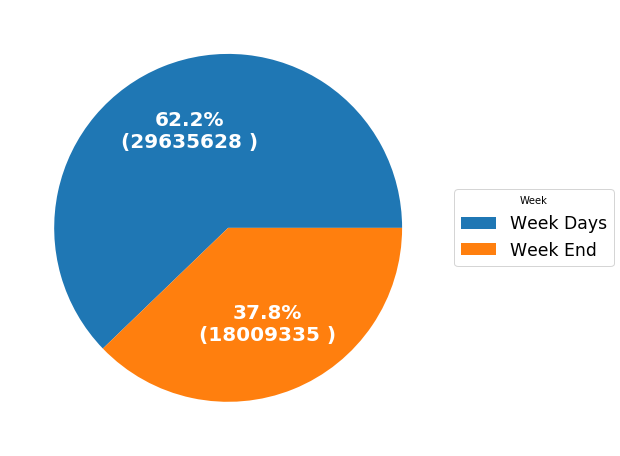

In [16]:
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(aspect="equal"))
season = ["Week Days","Week End"]
data = df_main.groupby(['WeekEnd']).Quantity.sum()
wedges, texts, autotexts = ax.pie(data, autopct=lambda pct: func(pct, data),
                                  textprops=dict(color="w"))
ax.legend(wedges, season,title="Week",loc="center left",bbox_to_anchor=(1, 0, 0.5, 1),fontsize='xx-large')
plt.setp(autotexts, size=20, weight="bold")
#ax.set_title("Percentage of Total Quantity Charged Per Week")
plt.show()

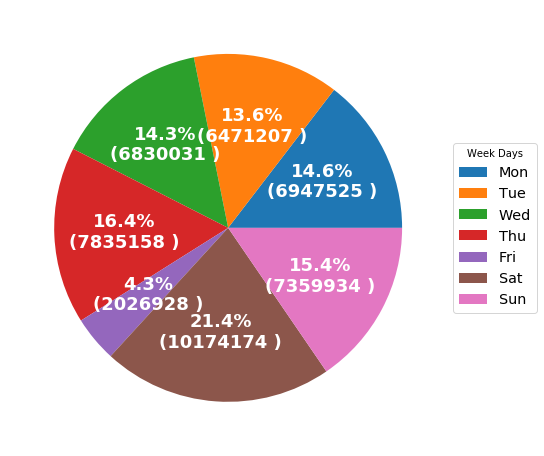

In [14]:
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(aspect="equal"))
season = ["Mon","Tue","Wed","Thu","Fri","Sat","Sun"]
data = df_main.groupby(['DayofWeek']).Quantity.sum()
wedges, texts, autotexts = ax.pie(data, autopct=lambda pct: func(pct, data),
                                  textprops=dict(color="w"))
ax.legend(wedges, season,title="Week Days",loc="center left",bbox_to_anchor=(1, 0, 0.5, 1),fontsize='x-large')
plt.setp(autotexts, size=18, weight="bold")
#ax.set_title("Percentage of Total Quantity Charged Per Week Day")
plt.show()

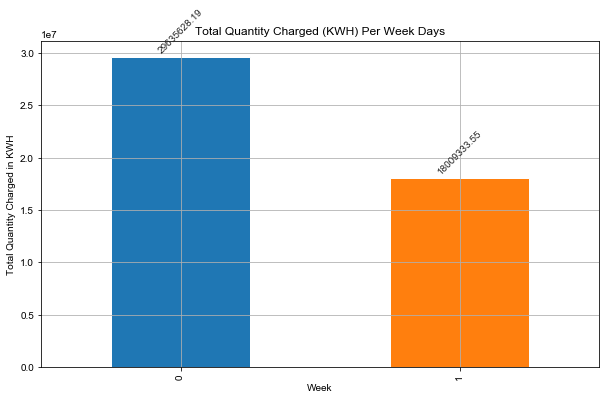

In [15]:
fig = plt.figure(figsize=(10,6))
ax = fig.gca()
sns.set_style("whitegrid")
counts= df_main.groupby('WeekEnd').Quantity.sum()
counts.plot.bar(ax=ax)
ax.set_title('Total Quantity Charged (KWH) Per Week Days')
ax.set_xlabel('Week')
ax.set_ylabel('Total Quantity Charged in KWH')
plot_value_labels(fig.gca())

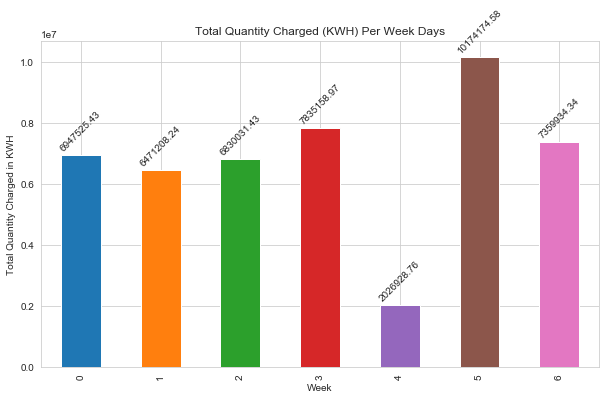

In [16]:
fig = plt.figure(figsize=(10,6))
ax = fig.gca()
sns.set_style("whitegrid")
counts= df_main.groupby('DayofWeek').Quantity.sum()
counts.plot.bar(ax=ax)
ax.set_title('Total Quantity Charged (KWH) Per Week Days')
ax.set_xlabel('Week')
ax.set_ylabel('Total Quantity Charged in KWH')
plot_value_labels(fig.gca())

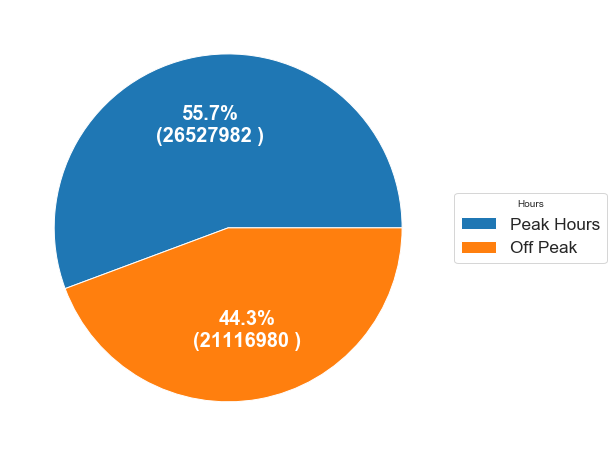

In [27]:
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(aspect="equal"))
season = ["Peak Hours","Off Peak"]
data = df_main.groupby(['Peak']).Quantity.sum()
wedges, texts, autotexts = ax.pie(data, autopct=lambda pct: func(pct, data),
                                  textprops=dict(color="w"))
ax.legend(wedges, season,title="Hours",loc="center left",bbox_to_anchor=(1, 0, 0.5, 1),fontsize='xx-large')
plt.setp(autotexts, size=20, weight="bold")
#ax.set_title("Percentage of Total Quantity Charged Per Peak Hours & Off Peak")
plt.show()

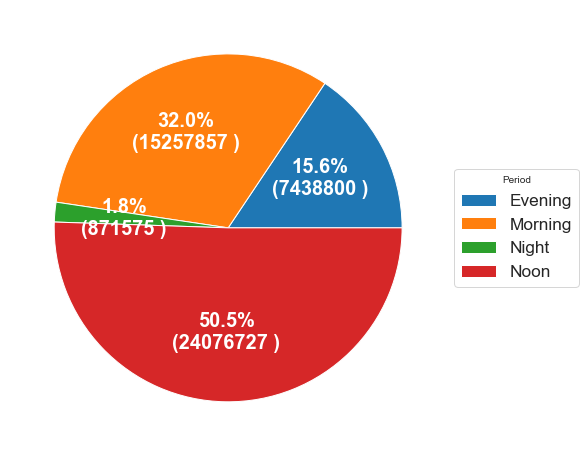

In [26]:
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(aspect="equal"))
season = ["Evening","Morning","Night","Noon"]
data = df_main.groupby(['Period']).Quantity.sum()
wedges, texts, autotexts = ax.pie(data, autopct=lambda pct: func(pct, data),
                                  textprops=dict(color="w"))
ax.legend(wedges, season,title="Period",loc="center left",bbox_to_anchor=(1, 0, 0.5, 1),fontsize='xx-large')
plt.setp(autotexts, size=20, weight="bold")
#ax.set_title("Percentage of Total Quantity Charged Per Period")
plt.show()

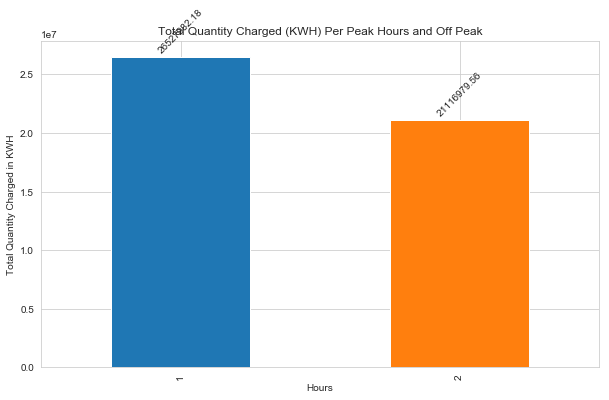

In [206]:
fig = plt.figure(figsize=(10,6))
ax = fig.gca()
sns.set_style("whitegrid")
counts= df_main.groupby('Peak').Quantity.sum()
counts.plot.bar(ax=ax)
ax.set_title('Total Quantity Charged (KWH) Per Peak Hours and Off Peak')
ax.set_xlabel('Hours')
ax.set_ylabel('Total Quantity Charged in KWH')
plot_value_labels(fig.gca())

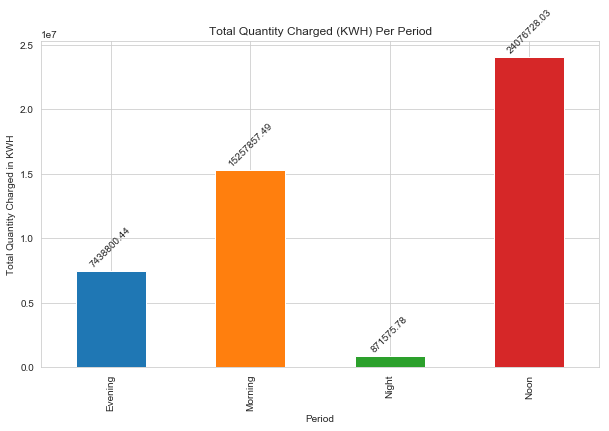

In [204]:
fig = plt.figure(figsize=(10,6))
ax = fig.gca()
sns.set_style("whitegrid")
counts= df_main.groupby('Period').Quantity.sum()
counts.plot.bar(ax=ax)
ax.set_title('Total Quantity Charged (KWH) Per Period')
ax.set_xlabel('Period')
ax.set_ylabel('Total Quantity Charged in KWH')
plot_value_labels(fig.gca())

## Histogram for Number of Bills Per ( Month, Area and Tariff )

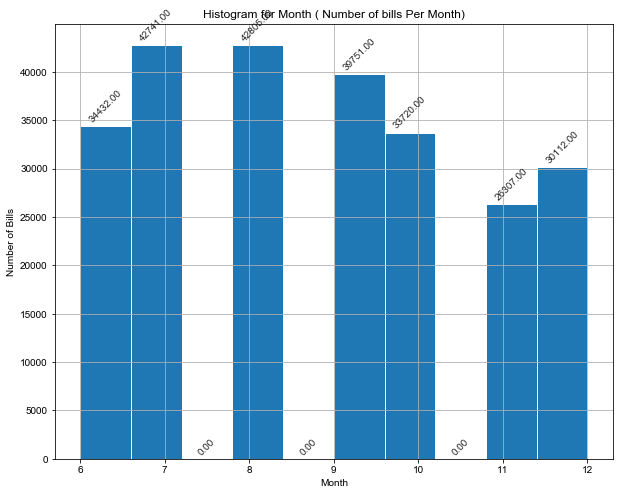

In [7]:
fig = plt.figure(figsize=(10,8))
ax = fig.gca()
sns.set_style("whitegrid")
df_main['Month'].plot.hist(ax = ax) #, alpha=0.8)
ax.set_title('Histogram for Month ( Number of bills Per Month)')
ax.set_xlabel('Month')
ax.set_ylabel('Number of Bills')
plot_value_labels(fig.gca())

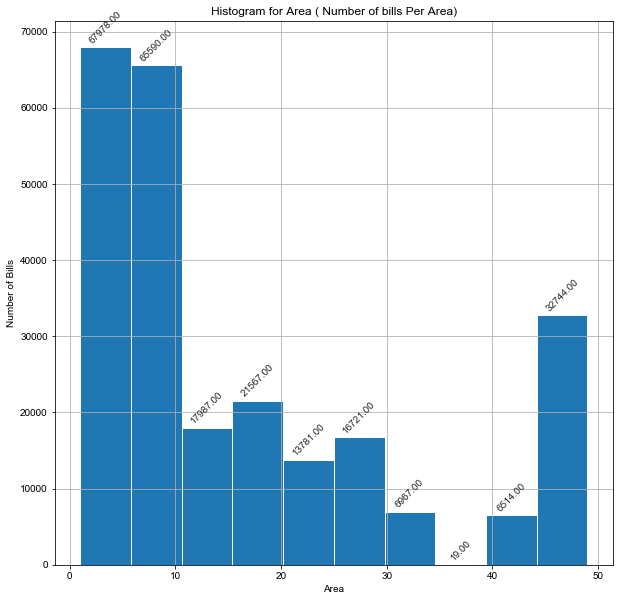

In [14]:
fig = plt.figure(figsize=(10,10))
ax = fig.gca()
sns.set_style("whitegrid")
df_main['AreaNo'].plot.hist(ax = ax)
ax.set_title('Histogram for Area ( Number of bills Per Area)')
ax.set_xlabel('Area')
ax.set_ylabel('Number of Bills')
plot_value_labels(fig.gca())

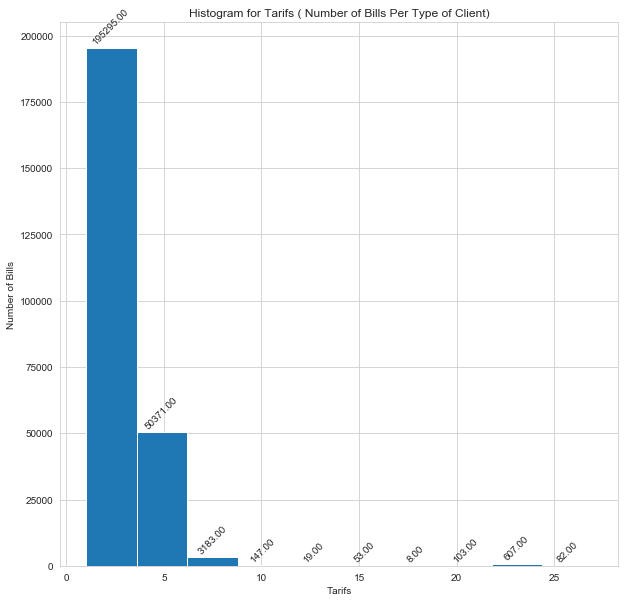

In [15]:
fig = plt.figure(figsize=(10,10))
ax = fig.gca()
sns.set_style("whitegrid")
df_main['TarifNo'].plot.hist(ax = ax)
ax.set_title('Histogram for Tarifs ( Number of Bills Per Type of Client)')
ax.set_xlabel('Tarifs')
ax.set_ylabel('Number of Bills')
plot_value_labels(fig.gca())

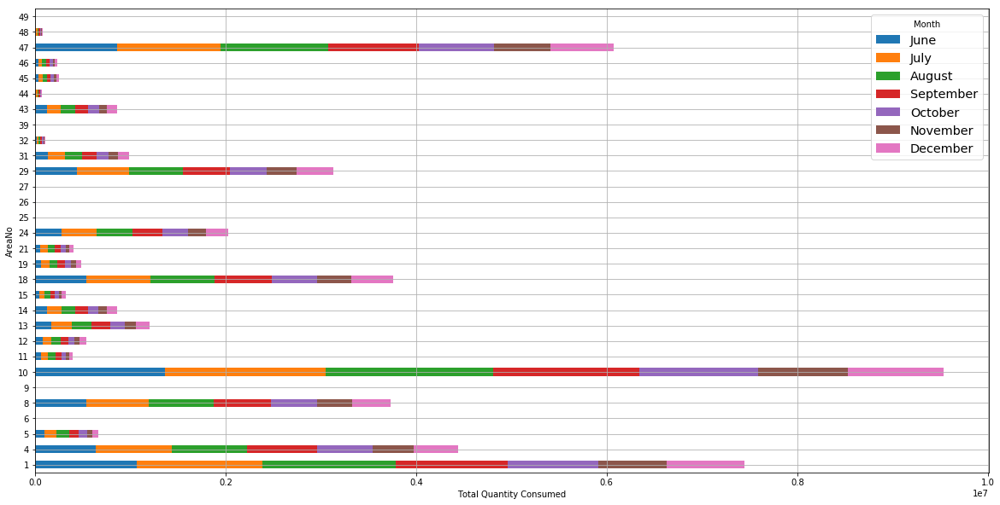

In [71]:
df_main.groupby(['AreaNo','Month']).Quantity.sum().unstack().plot(kind='barh',stacked=True, figsize=(20, 10),grid=True)
#plt.title('Total Quantity Charged each Month Distributed in each Area')
plt.legend(['June', 'July', 'August','September', 'October','November','December'],loc='upper right',  title='Month', fontsize='x-large')
plt.xlabel('Total Quantity Consumed')
plt.show()


# Number of Bills Analysis

# Statistics for Number of Bills From Jun To Dec, 2018

## Number of Bills Per Month 

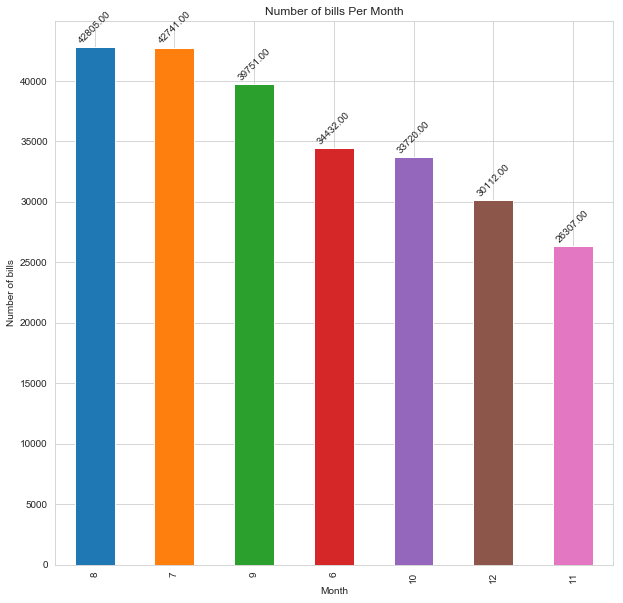

In [13]:
counts = df_main['Month'].value_counts()
fig = plt.figure(figsize=(10,10))
sns.set_style("whitegrid")
ax = fig.gca()
counts.plot.bar(ax=ax)
ax.set_title('Number of bills Per Month')
ax.set_xlabel('Month')
ax.set_ylabel('Number of bills')
plot_value_labels(fig.gca())

C:\Users\AbuBaker\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


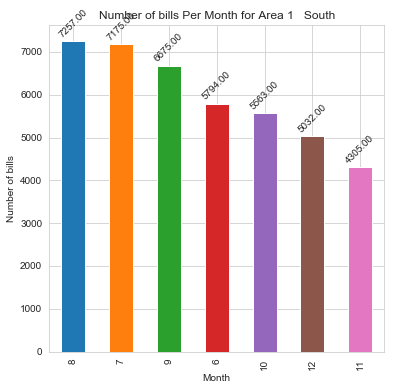

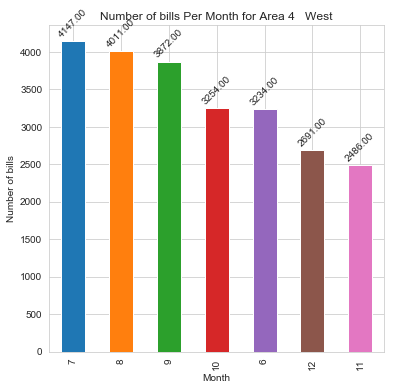

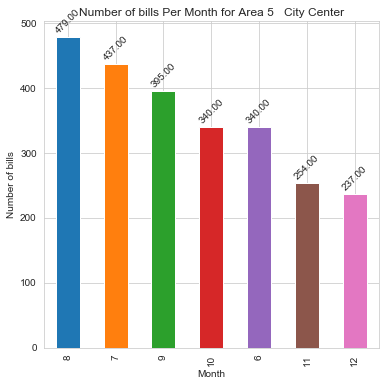

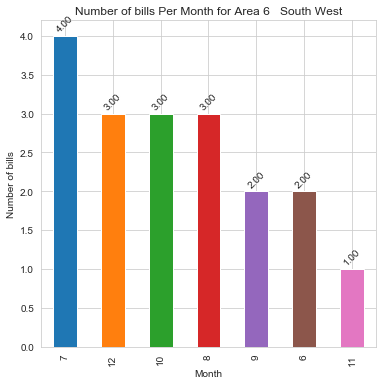

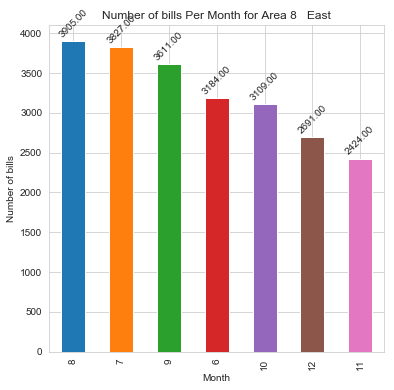

...

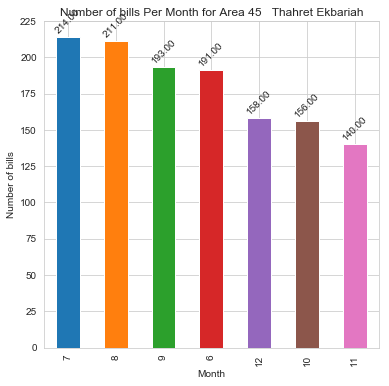

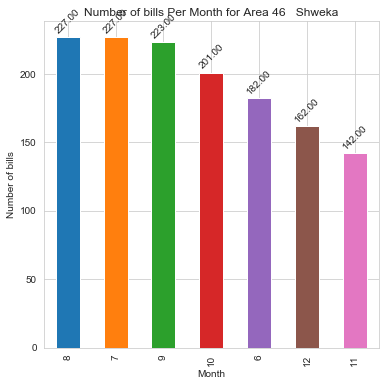

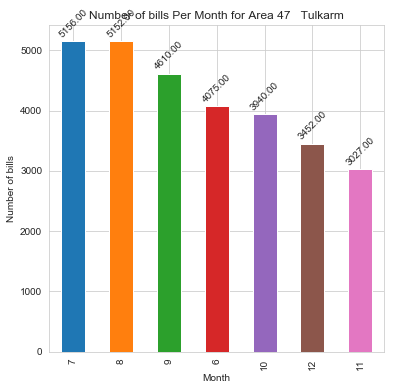

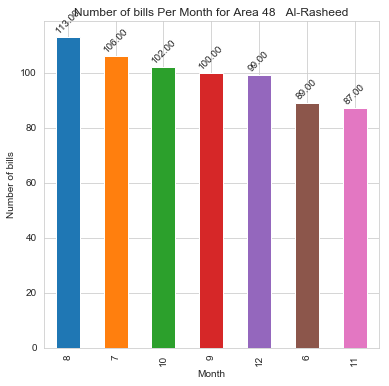

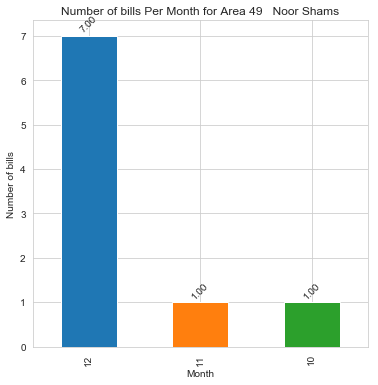

In [14]:
for i in range(0,len(areano_list)):
    counts = df_main['Month'][df_main['AreaNo']==areano_list[i]].value_counts()
    counts
    if counts.any():   
        fig = plt.figure(figsize=(6,6))
        sns.set_style("whitegrid")
        ax = fig.gca()
        counts.plot.bar(ax=ax)
        ax.set_title('Number of bills Per Month for Area '+str(areano_list[i])+'   '+areaname_list[i])
        ax.set_xlabel('Month')
        ax.set_ylabel('Number of bills')
        plot_value_labels(fig.gca())

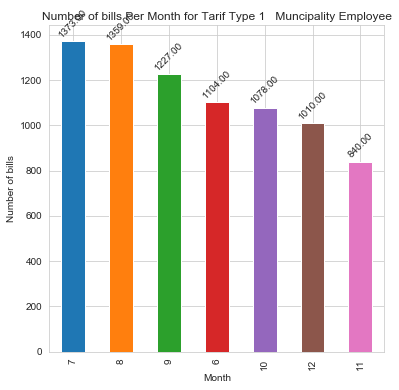

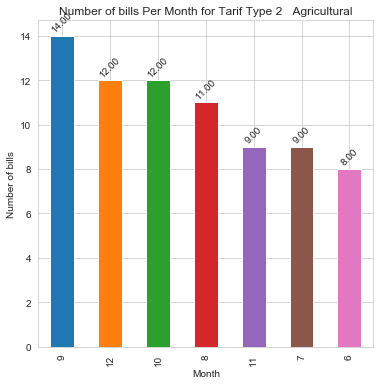

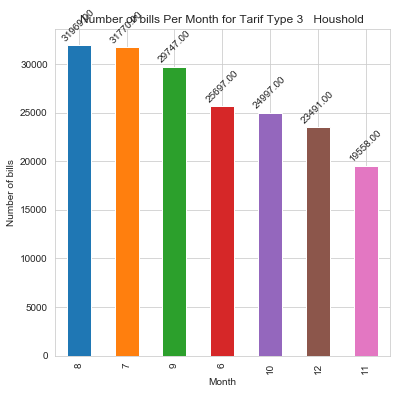

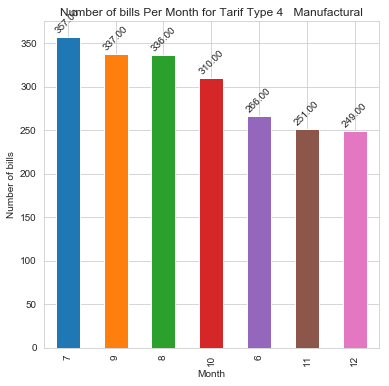

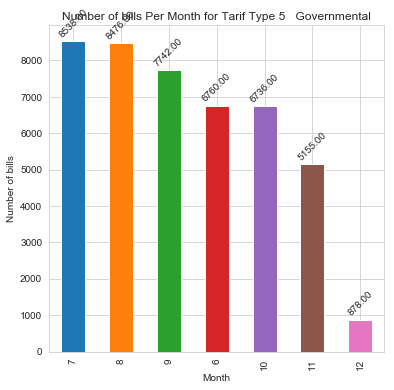

...

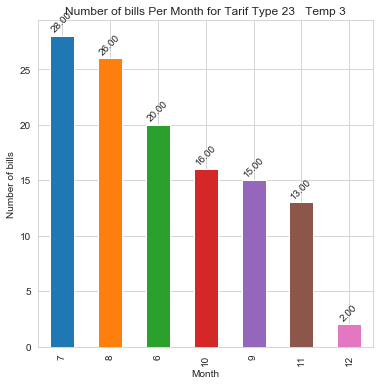

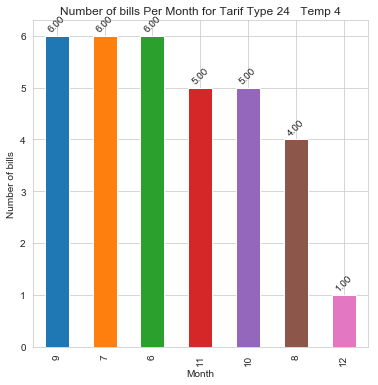

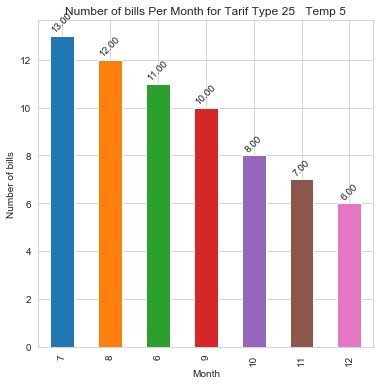

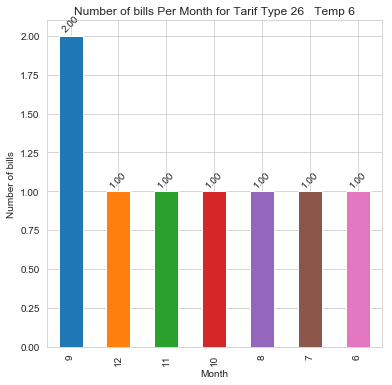

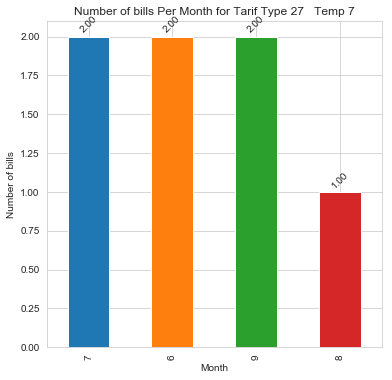

In [15]:
for i in range(0,len(tarifno_list)):
    counts = df_main['Month'][df_main['TarifNo']==tarifno_list[i]].value_counts()
    if counts.any():   
        fig = plt.figure(figsize=(6,6))
        sns.set_style("whitegrid")
        ax = fig.gca()
        counts.plot.bar(ax=ax)
        ax.set_title('Number of bills Per Month for Tarif Type '+str(tarifno_list[i])+'   '+tarifname_list[i])
        ax.set_xlabel('Month')
        ax.set_ylabel('Number of bills')
        plot_value_labels(fig.gca())

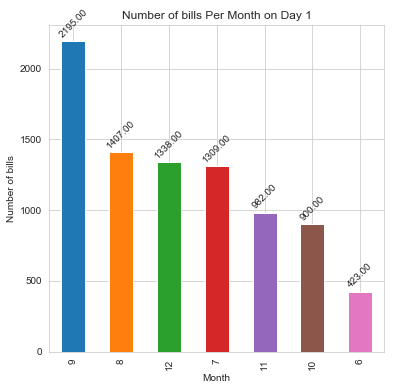

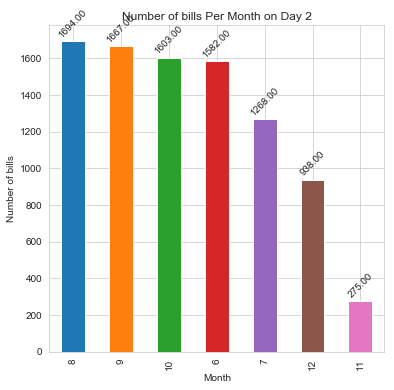

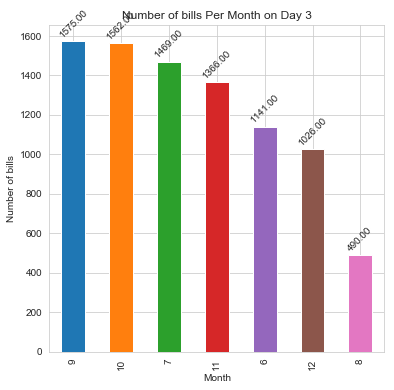

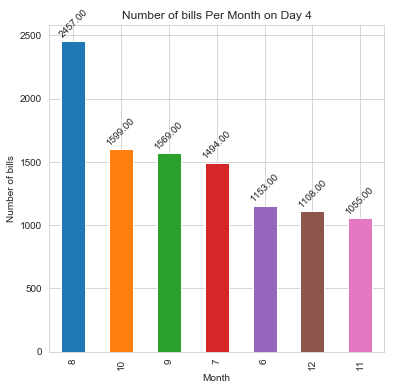

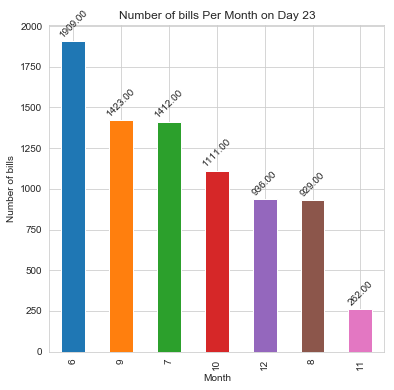

...

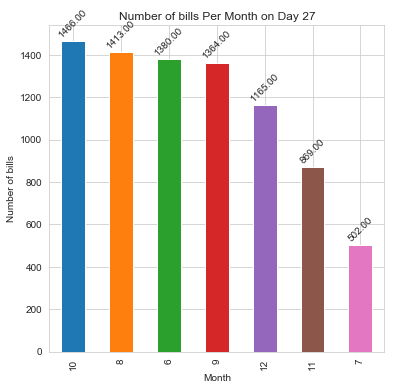

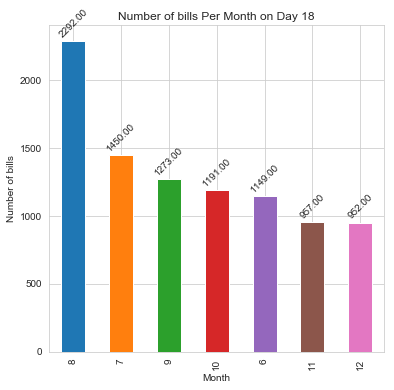

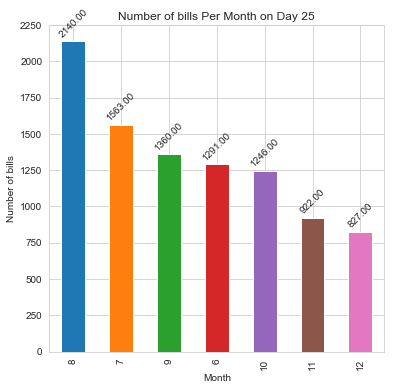

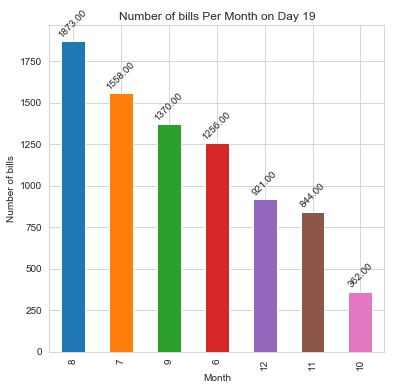

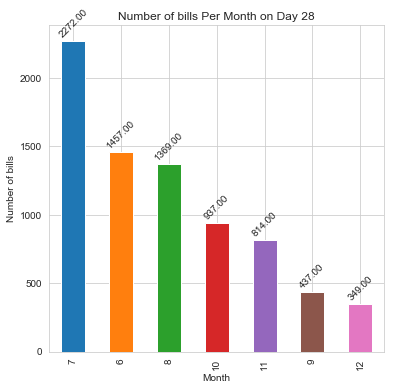

In [16]:
for i in range(0,len(day_list)):
    counts = df_main['Month'][df_main['Day']==day_list[i]].value_counts()
    if counts.any():   
        fig = plt.figure(figsize=(6,6))
        sns.set_style("whitegrid")
        ax = fig.gca()
        counts.plot.bar(ax=ax)
        ax.set_title('Number of bills Per Month on Day '+str(day_list[i]))
        ax.set_xlabel('Month')
        ax.set_ylabel('Number of bills')
        plot_value_labels(fig.gca())

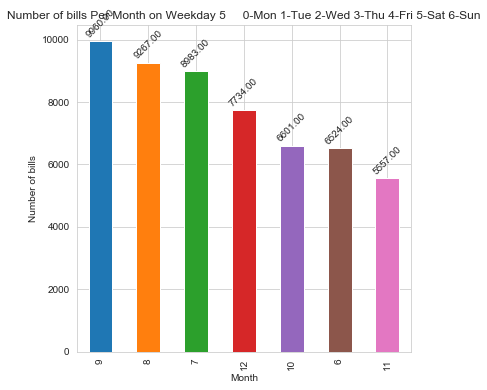

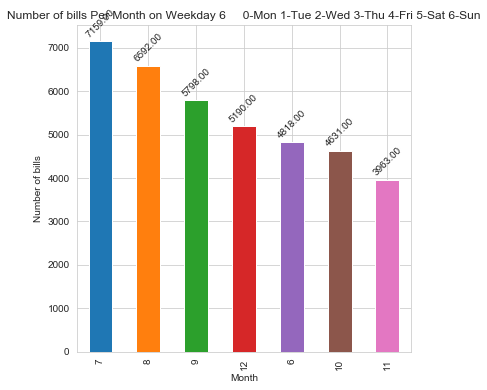

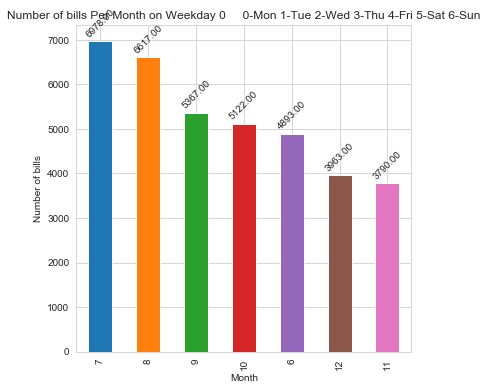

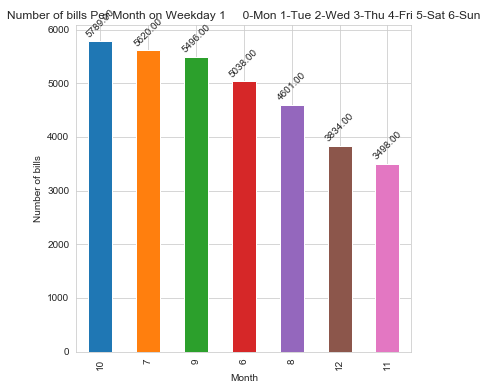

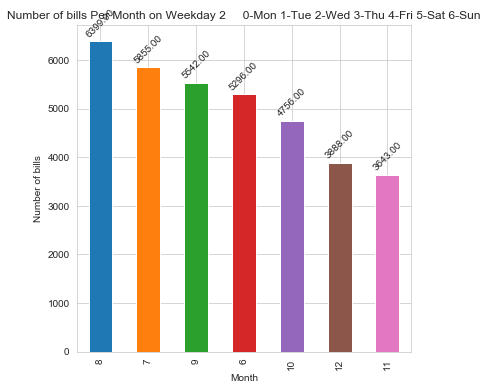

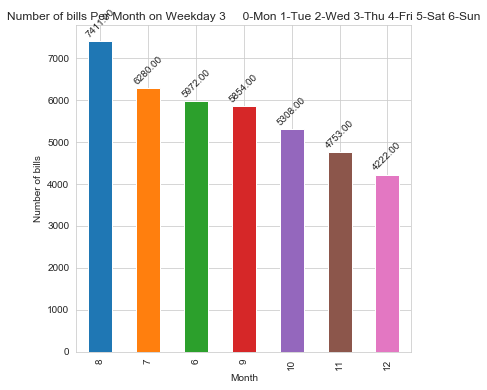

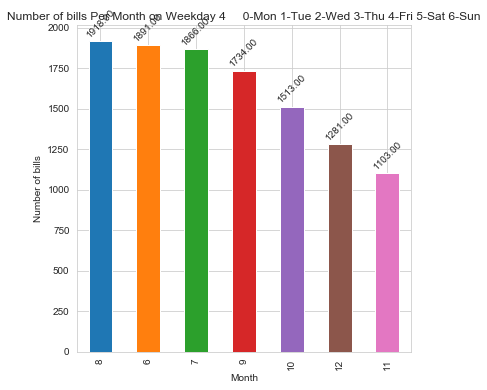

In [14]:
for i in range(0,len(weekday_list)):
    counts = df_main['Month'][df_main['DayofWeek']==weekday_list[i]].value_counts()
    if counts.any():   
        fig = plt.figure(figsize=(6,6))
        sns.set_style("whitegrid")
        ax = fig.gca()
        counts.plot.bar(ax=ax)
        ax.set_title('Number of bills Per Month on Weekday '+str(weekday_list[i])+'     0-Mon 1-Tue 2-Wed 3-Thu 4-Fri 5-Sat 6-Sun')
        ax.set_xlabel('Month')
        ax.set_ylabel('Number of bills')
        plot_value_labels(fig.gca())

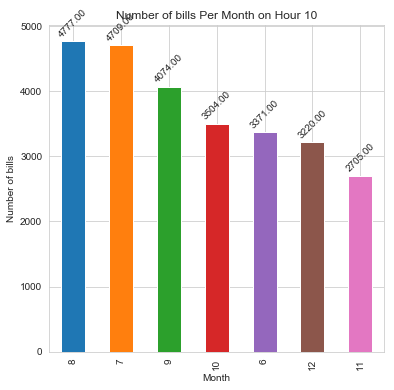

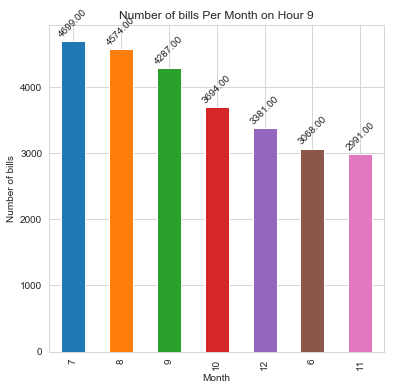

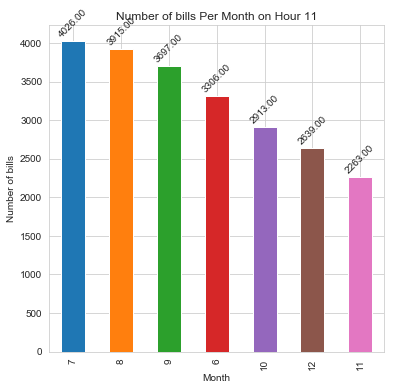

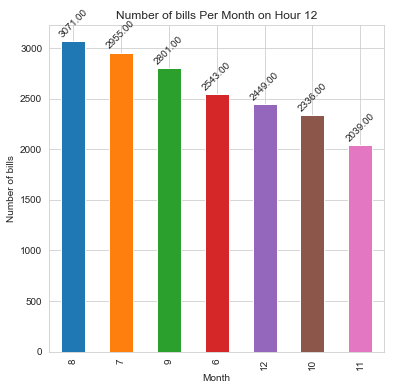

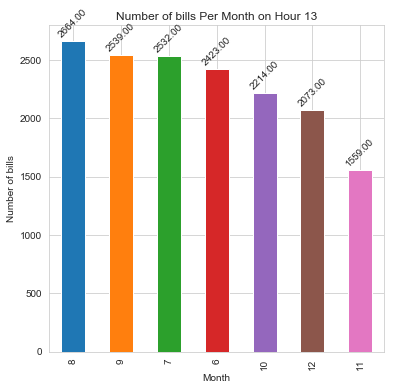

...

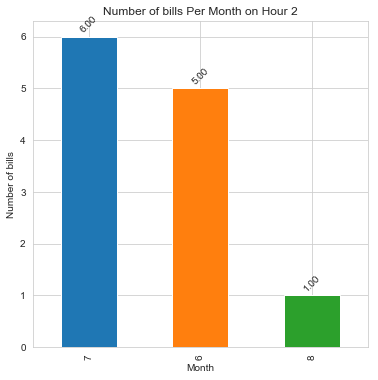

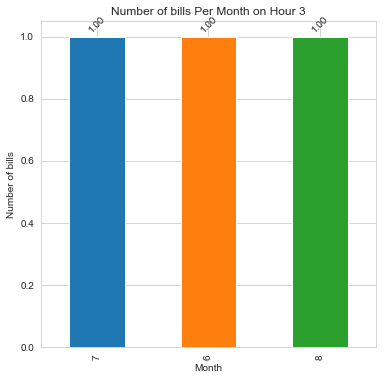

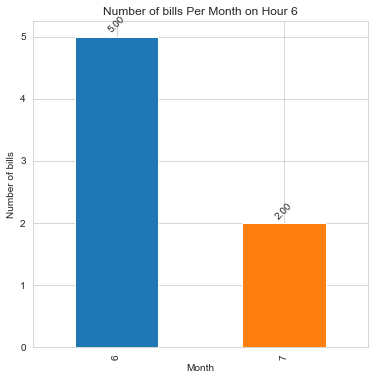

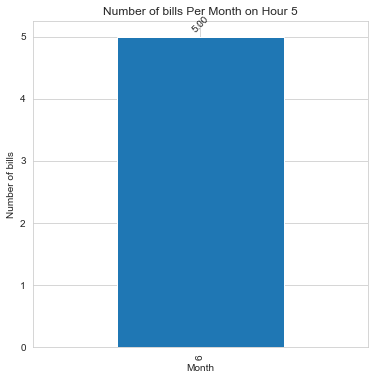

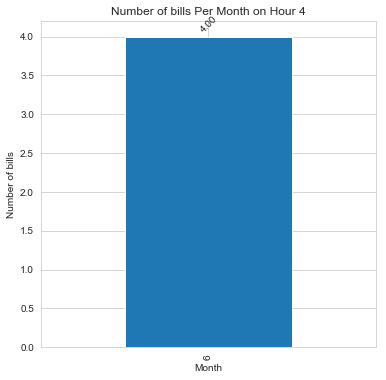

In [15]:
for i in range(0,len(hour_list)):
    counts = df_main['Month'][df_main['Hour']==hour_list[i]].value_counts()
    if counts.any():   
        fig = plt.figure(figsize=(6,6))
        sns.set_style("whitegrid")
        ax = fig.gca()
        counts.plot.bar(ax=ax)
        ax.set_title('Number of bills Per Month on Hour '+str(hour_list[i]))
        ax.set_xlabel('Month')
        ax.set_ylabel('Number of bills')
        plot_value_labels(fig.gca())

## Number of Bills Per Area                      

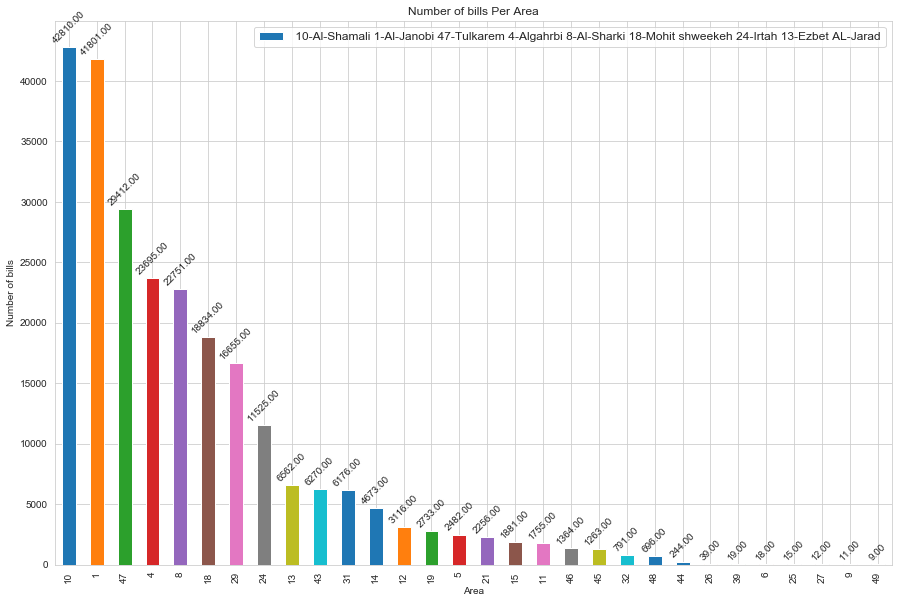

In [16]:
#df.Month.value_counts().sort_index().plot()
counts = df_main['AreaNo'].value_counts()
fig = plt.figure(figsize=(15,10))
sns.set_style("whitegrid")
ax = fig.gca()
counts.plot.bar(ax=ax)
ax.set_title('Number of bills Per Area')
ax.set_xlabel('Area')
ax.set_ylabel('Number of bills')
ax.legend([' 10-Al-Shamali 1-Al-Janobi 47-Tulkarem 4-Algahrbi 8-Al-Sharki 18-Mohit shweekeh 24-Irtah 13-Ezbet AL-Jarad'],
          fontsize='large',loc="best")
plot_value_labels(fig.gca())

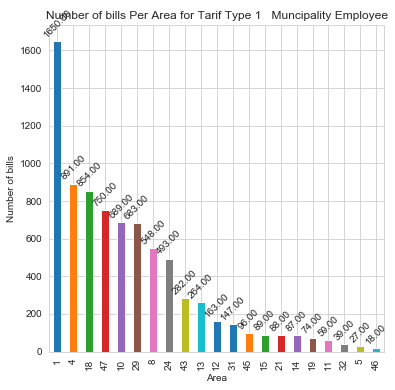

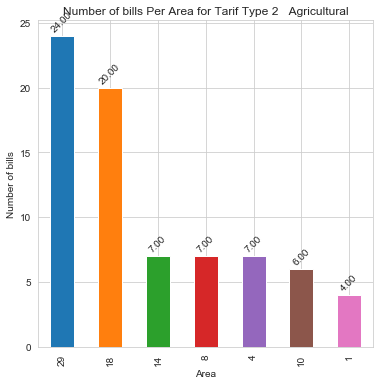

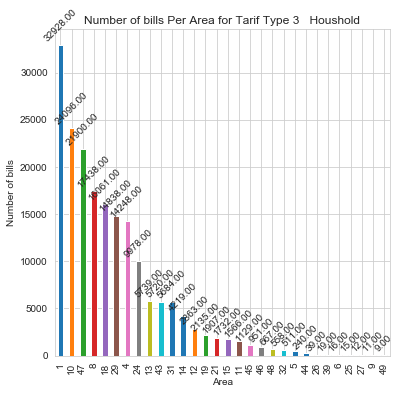

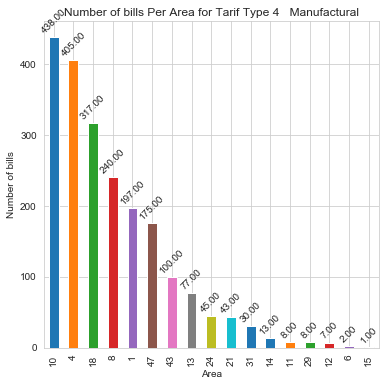

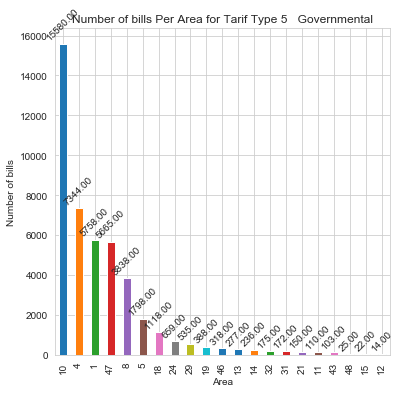

...

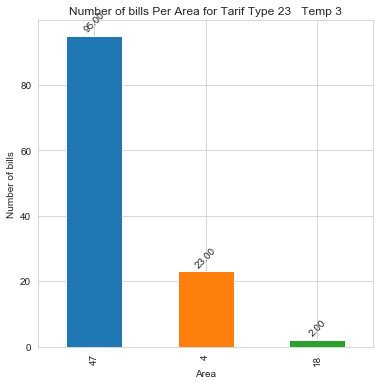

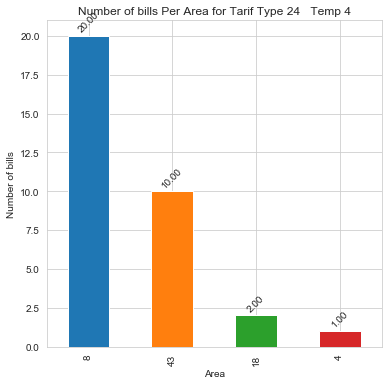

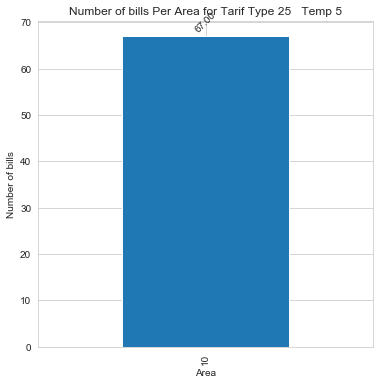

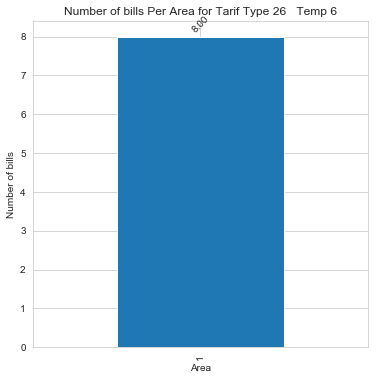

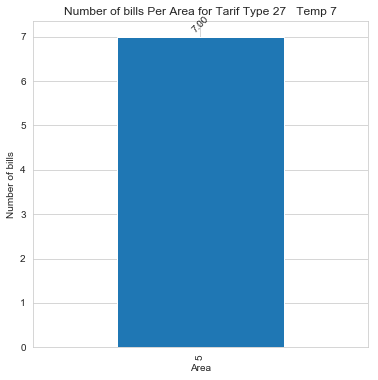

In [17]:
for i in range(0,len(tarifno_list)):
    counts = df_main['AreaNo'][df_main['TarifNo']==tarifno_list[i]].value_counts()
    if counts.any():   
        fig = plt.figure(figsize=(6,6))
        sns.set_style("whitegrid")
        ax = fig.gca()
        counts.plot.bar(ax=ax)
        ax.set_title('Number of bills Per Area for Tarif Type '+str(tarifno_list[i])+'   '+tarifname_list[i])
        ax.set_xlabel('Area')
        ax.set_ylabel('Number of bills')
        plot_value_labels(fig.gca())

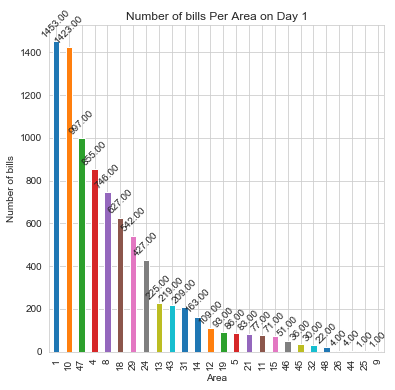

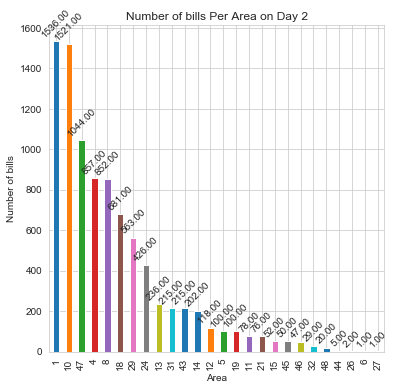

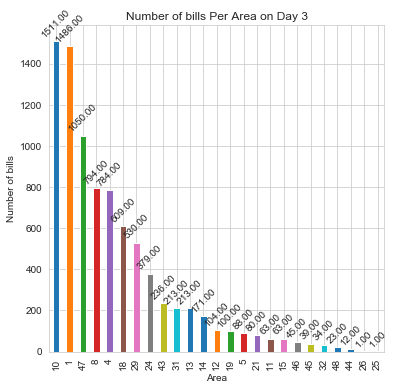

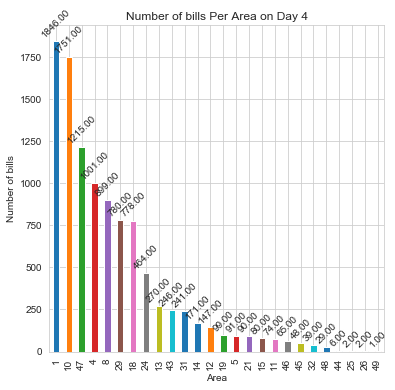

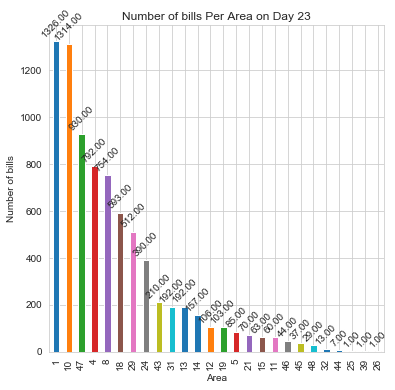

...

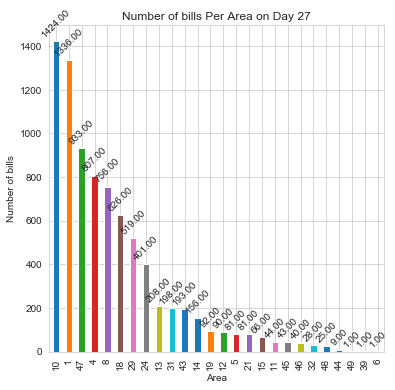

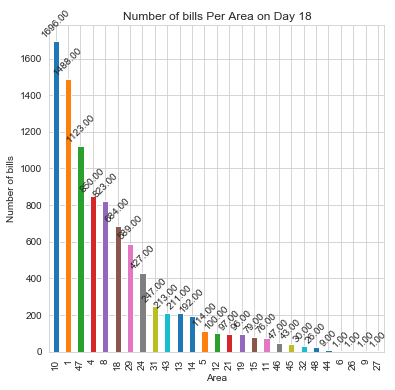

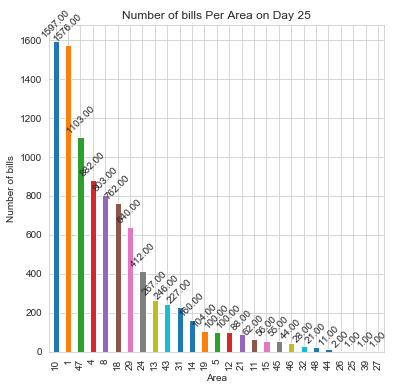

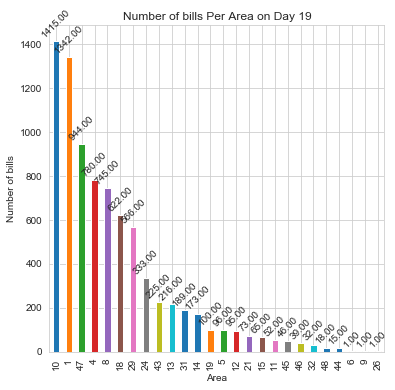

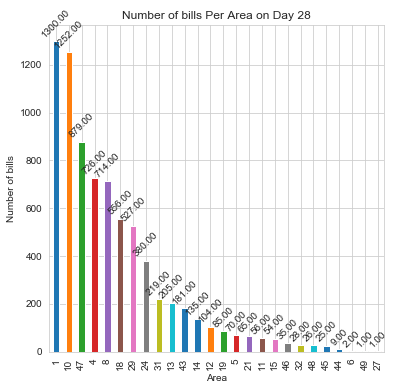

In [18]:
for i in range(0,len(day_list)):
    counts = df_main['AreaNo'][df_main['Day']==day_list[i]].value_counts()
    if counts.any():   
        fig = plt.figure(figsize=(6,6))
        sns.set_style("whitegrid")
        ax = fig.gca()
        counts.plot.bar(ax=ax)
        ax.set_title('Number of bills Per Area on Day '+str(day_list[i]))
        ax.set_xlabel('Area')
        ax.set_ylabel('Number of bills')
        plot_value_labels(fig.gca())

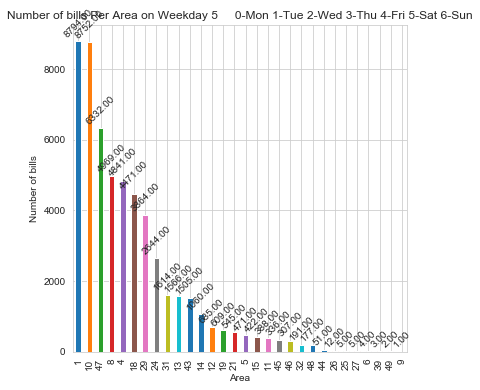

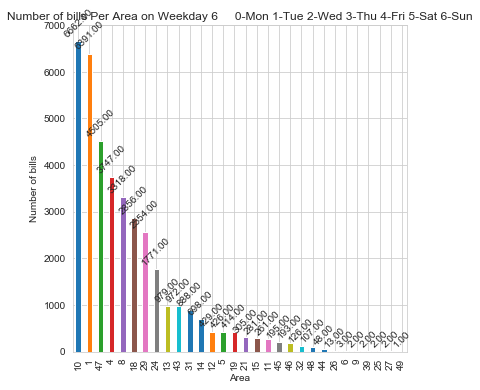

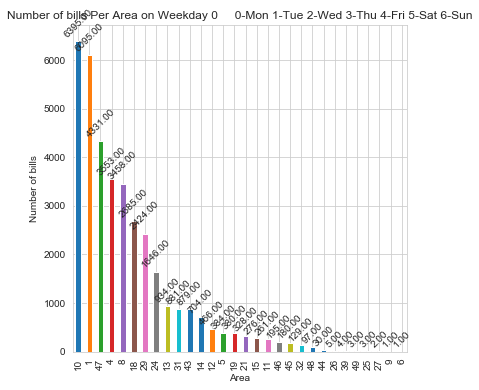

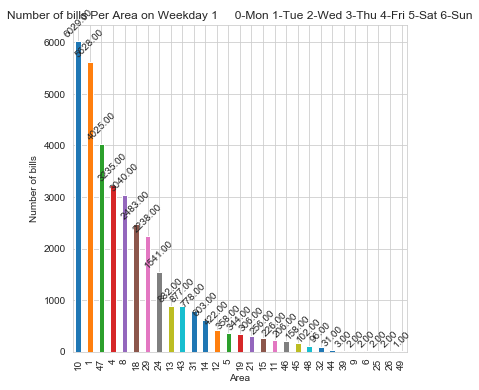

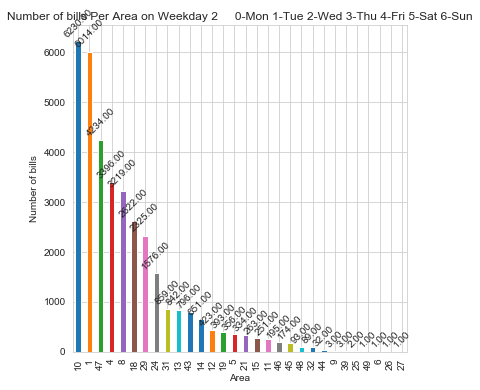

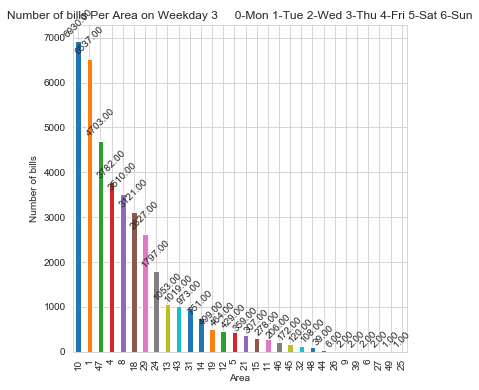

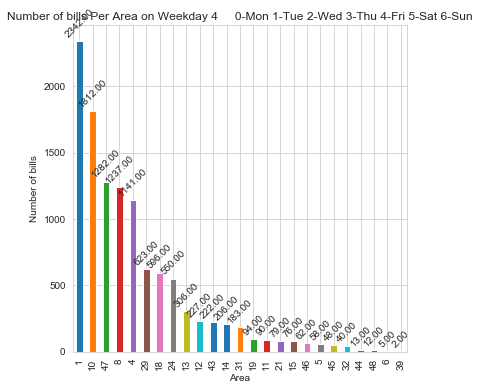

In [19]:
for i in range(0,len(weekday_list)):
    counts = df_main['AreaNo'][df_main['DayofWeek']==weekday_list[i]].value_counts()
    if counts.any():   
        fig = plt.figure(figsize=(6,6))
        sns.set_style("whitegrid")
        ax = fig.gca()
        counts.plot.bar(ax=ax)
        ax.set_title('Number of bills Per Area on Weekday '+str(weekday_list[i])+'     0-Mon 1-Tue 2-Wed 3-Thu 4-Fri 5-Sat 6-Sun')
        ax.set_xlabel('Area')
        ax.set_ylabel('Number of bills')
        plot_value_labels(fig.gca())

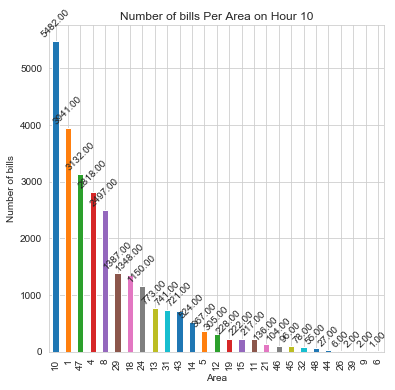

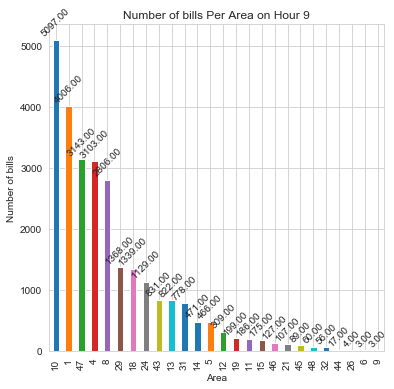

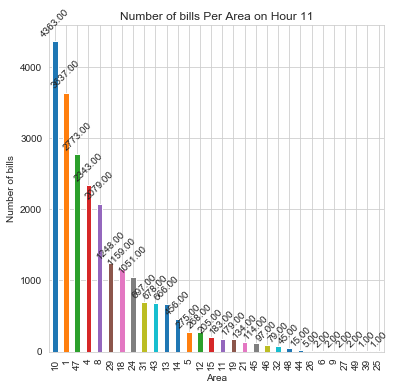

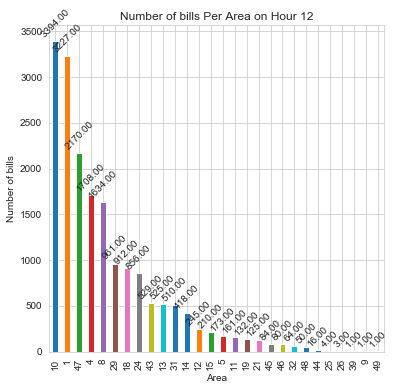

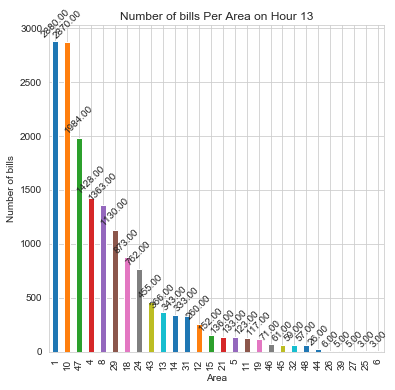

...

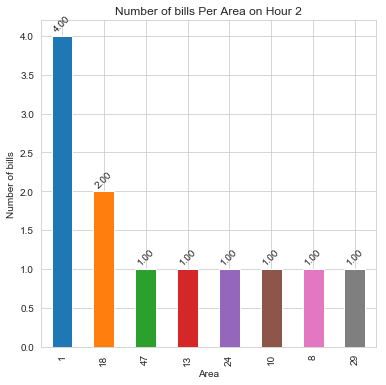

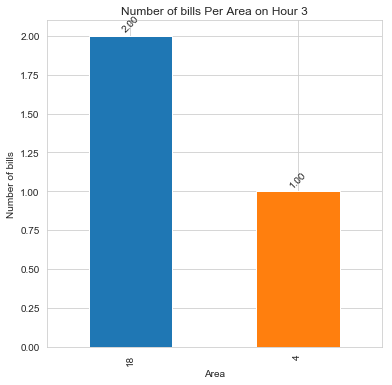

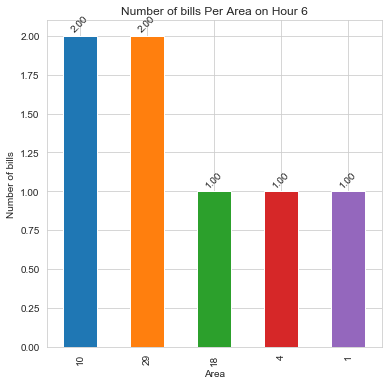

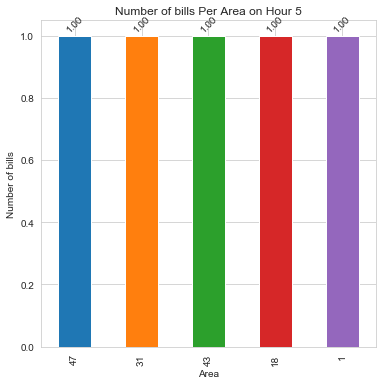

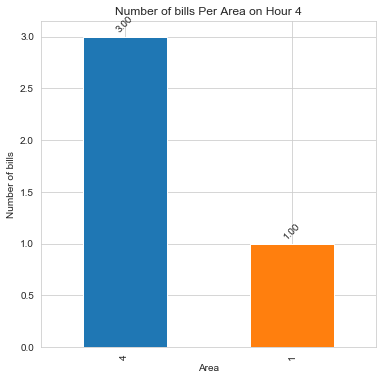

In [20]:
for i in range(0,len(hour_list)):
    counts = df_main['AreaNo'][df_main['Hour']==hour_list[i]].value_counts()
    if counts.any():   
        fig = plt.figure(figsize=(6,6))
        sns.set_style("whitegrid")
        ax = fig.gca()
        counts.plot.bar(ax=ax)
        ax.set_title('Number of bills Per Area on Hour '+str(hour_list[i]))
        ax.set_xlabel('Area')
        ax.set_ylabel('Number of bills')
        plot_value_labels(fig.gca())

## Number of Bills Per Tariff

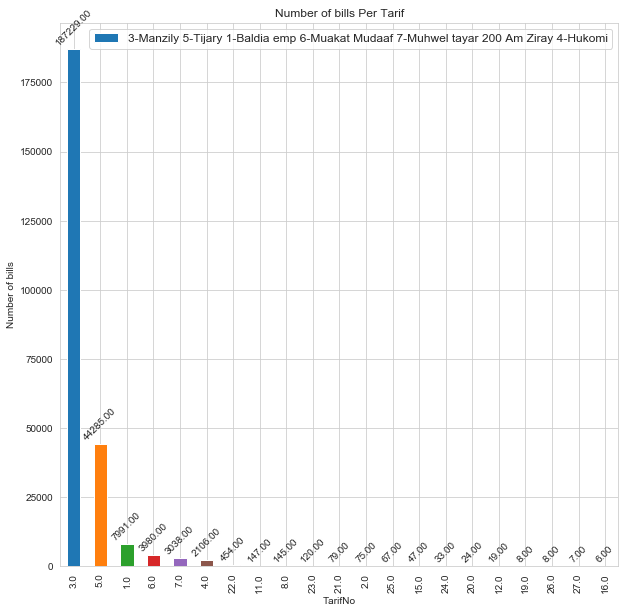

In [21]:
counts = df_main['TarifNo'].value_counts()
fig = plt.figure(figsize=(10,10))
ax = fig.gca()
sns.set_style("whitegrid")
counts.plot.bar(ax=ax)
ax.set_title('Number of bills Per Tarif')
ax.set_xlabel('TarifNo')
ax.set_ylabel('Number of bills')
ax.legend(['3-Manzily 5-Tijary 1-Baldia emp 6-Muakat Mudaaf 7-Muhwel tayar 200 Am Ziray 4-Hukomi'],fontsize='large',loc="best")
plot_value_labels(fig.gca())

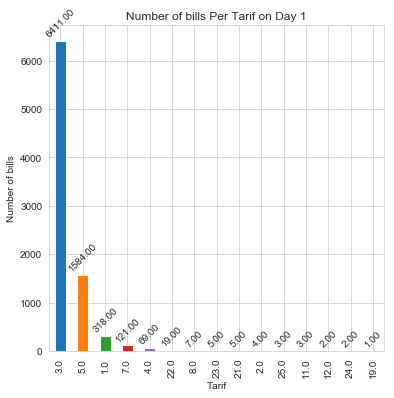

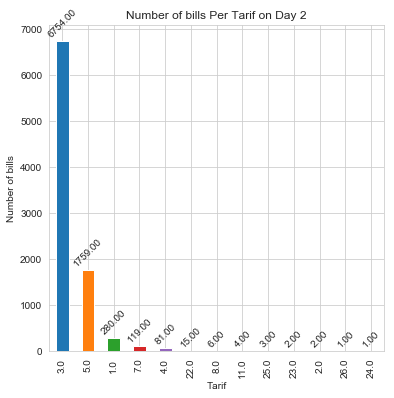

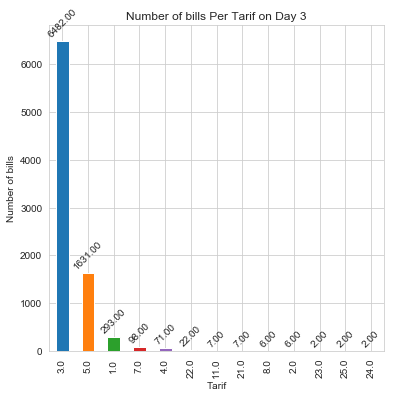

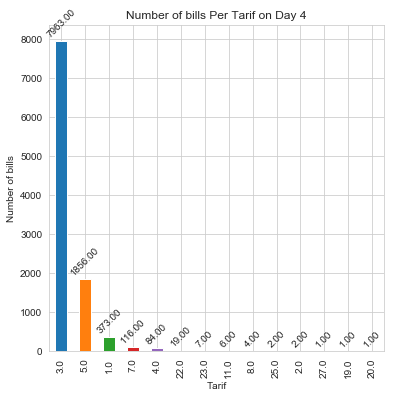

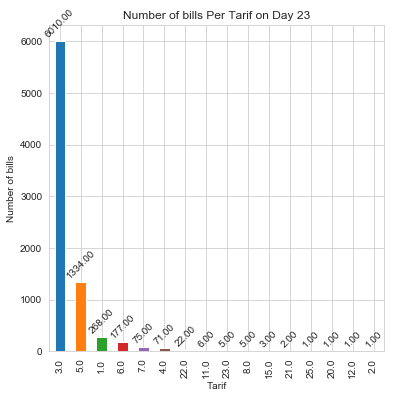

...

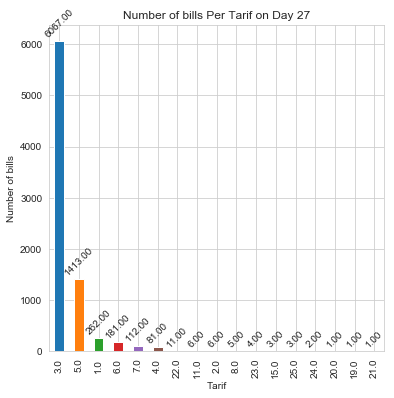

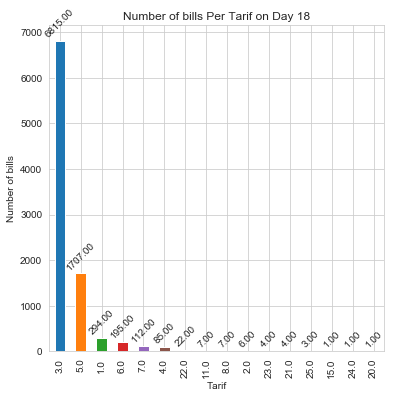

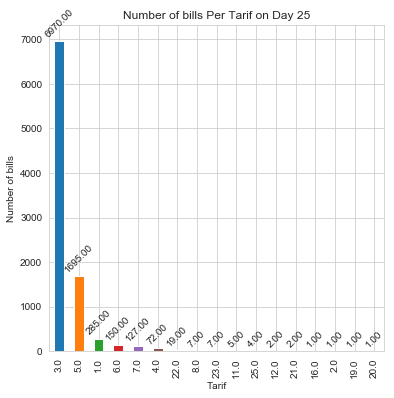

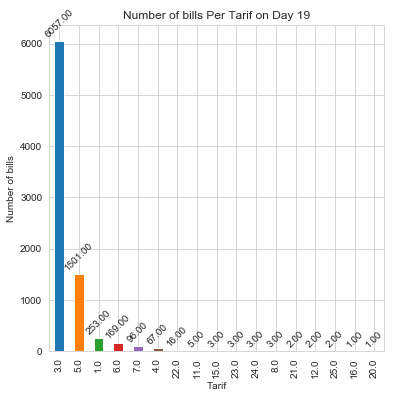

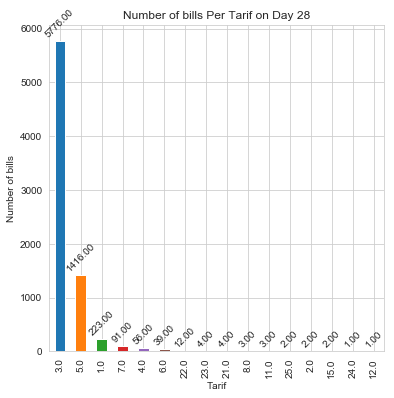

In [22]:
for i in range(0,len(day_list)):
    counts = df_main['TarifNo'][df_main['Day']==day_list[i]].value_counts()
    if counts.any():   
        fig = plt.figure(figsize=(6,6))
        sns.set_style("whitegrid")
        ax = fig.gca()
        counts.plot.bar(ax=ax)
        ax.set_title('Number of bills Per Tarif on Day '+str(day_list[i]))
        ax.set_xlabel('Tarif')
        ax.set_ylabel('Number of bills')
        plot_value_labels(fig.gca())

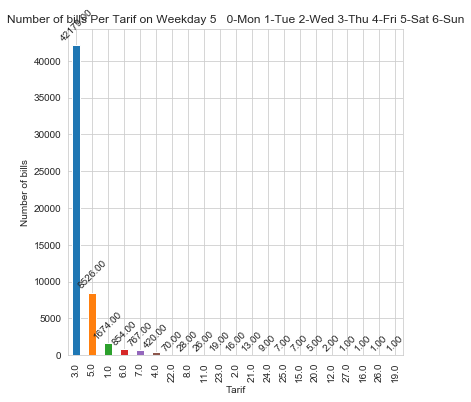

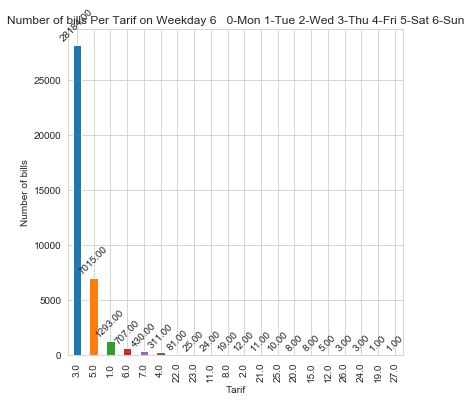

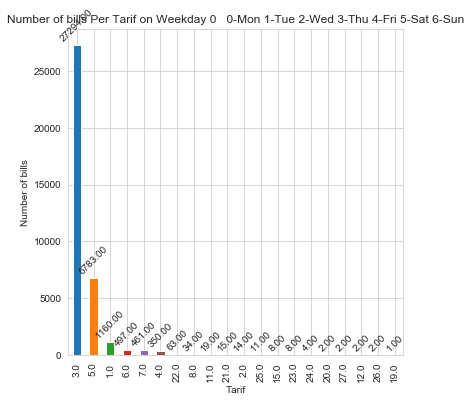

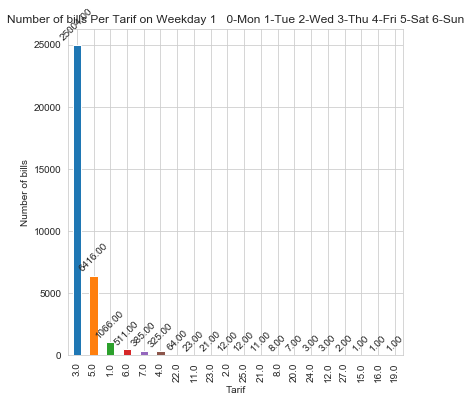

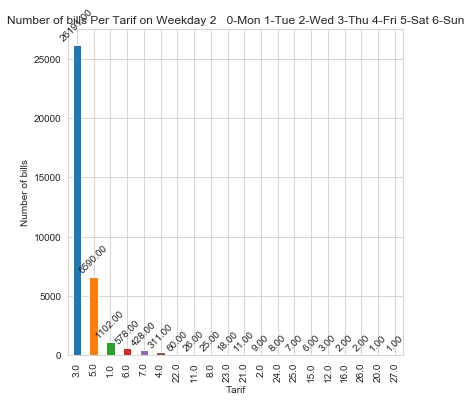

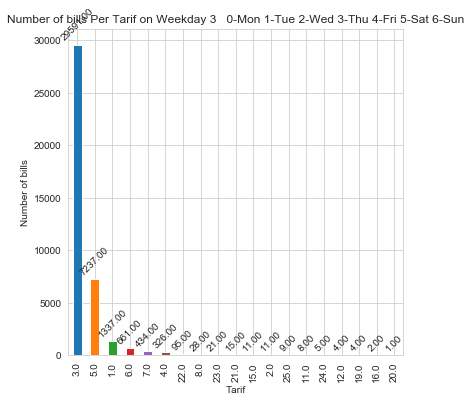

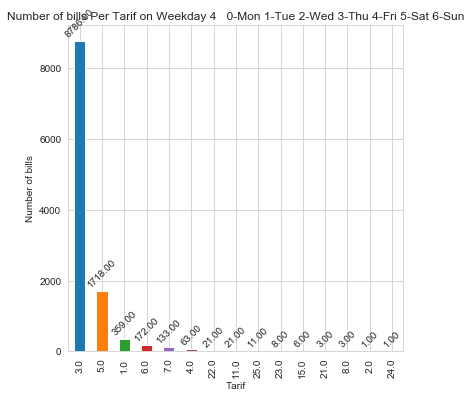

In [23]:
for i in range(0,len(weekday_list)):
    counts = df_main['TarifNo'][df_main['DayofWeek']==weekday_list[i]].value_counts()
    if counts.any():   
        fig = plt.figure(figsize=(6,6))
        sns.set_style("whitegrid")
        ax = fig.gca()
        counts.plot.bar(ax=ax)
        ax.set_title('Number of bills Per Tarif on Weekday '+str(weekday_list[i])+'   0-Mon 1-Tue 2-Wed 3-Thu 4-Fri 5-Sat 6-Sun')
        ax.set_xlabel('Tarif')
        ax.set_ylabel('Number of bills')
        plot_value_labels(fig.gca())

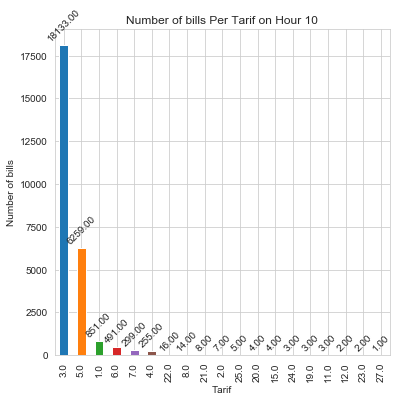

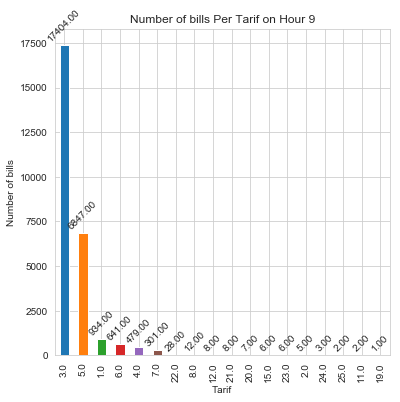

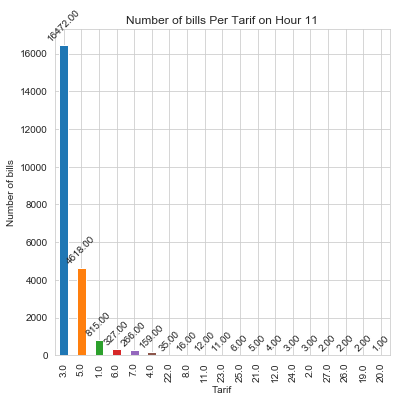

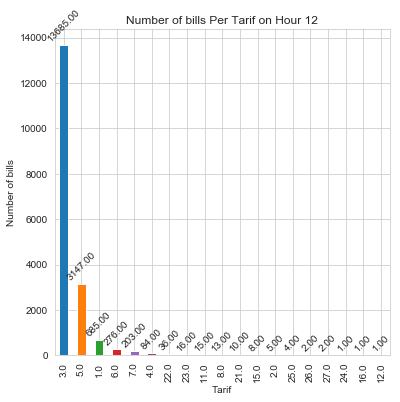

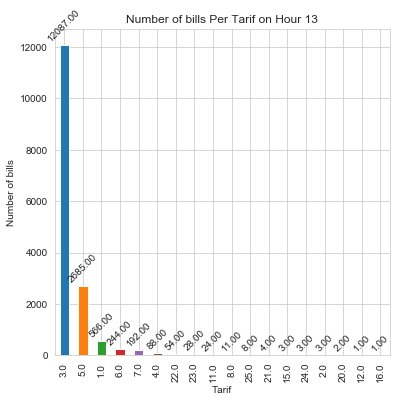

...

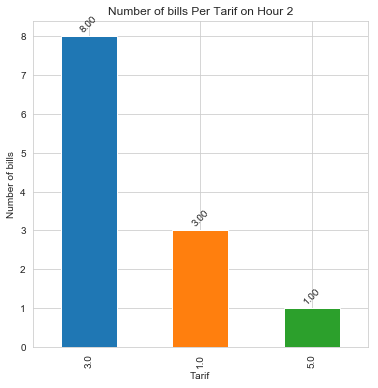

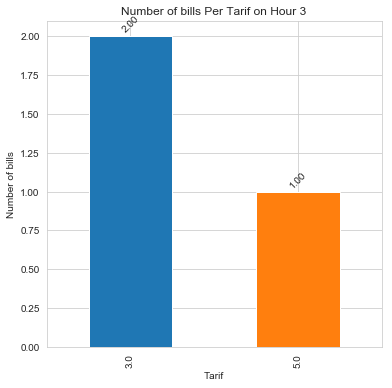

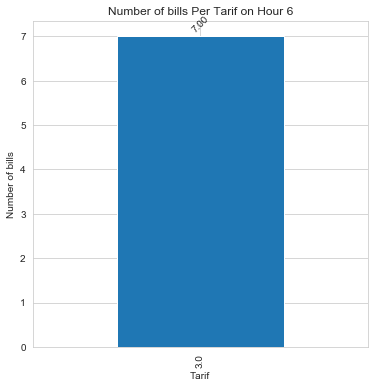

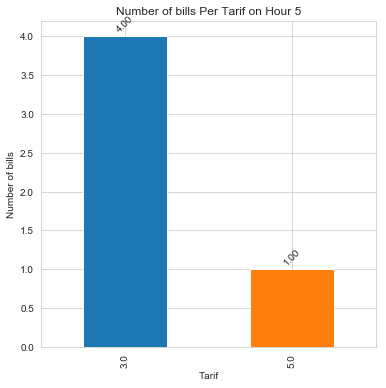

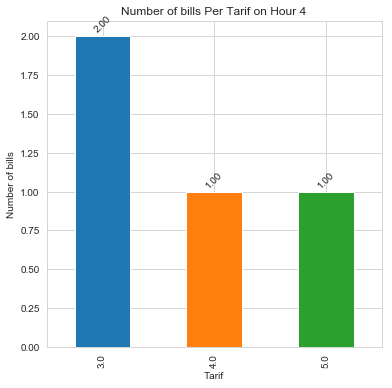

In [24]:
for i in range(0,len(hour_list)):
    counts = df_main['TarifNo'][df_main['Hour']==hour_list[i]].value_counts()
    if counts.any():   
        fig = plt.figure(figsize=(6,6))
        sns.set_style("whitegrid")
        ax = fig.gca()
        counts.plot.bar(ax=ax)
        ax.set_title('Number of bills Per Tarif on Hour '+str(hour_list[i]))
        ax.set_xlabel('Tarif')
        ax.set_ylabel('Number of bills')
        plot_value_labels(fig.gca())

## Number of Bills Per Week-Day  

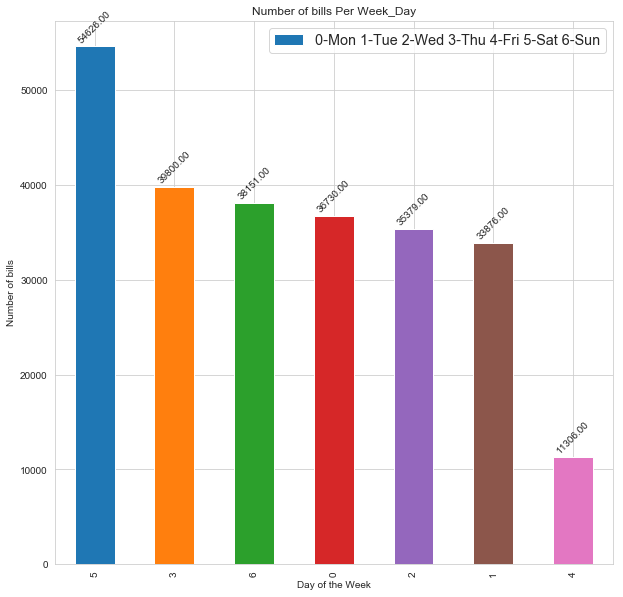

In [25]:
counts = df_main['DayofWeek'].value_counts()
fig = plt.figure(figsize=(10,10))
ax = fig.gca()
sns.set_style("whitegrid")
counts.plot.bar(ax=ax)
ax.set_title('Number of bills Per Week_Day')
ax.set_xlabel('Day of the Week')
ax.set_ylabel('Number of bills')
ax.legend(['0-Mon 1-Tue 2-Wed 3-Thu 4-Fri 5-Sat 6-Sun'],fontsize='x-large')
plot_value_labels(fig.gca())

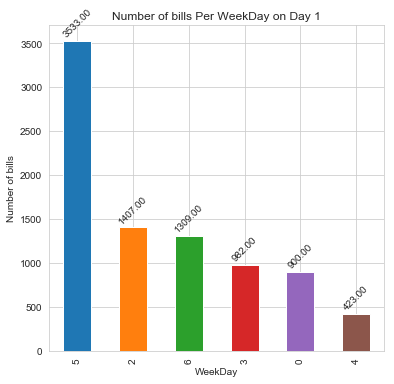

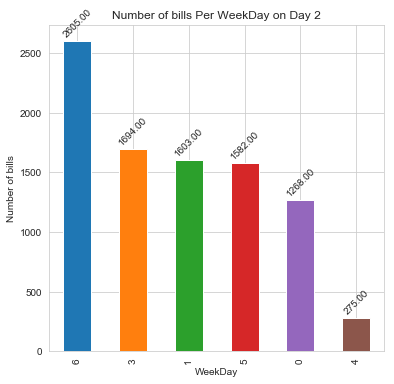

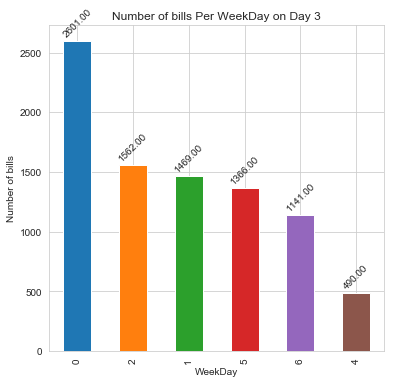

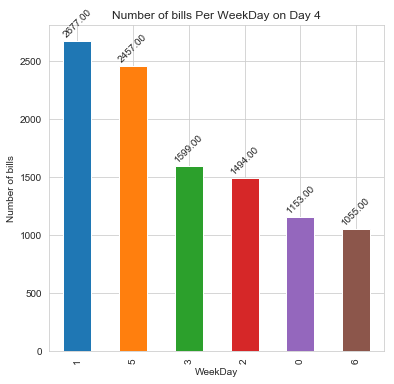

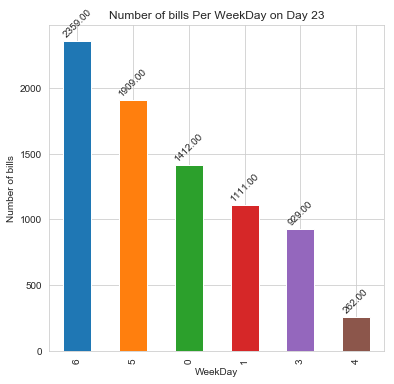

...

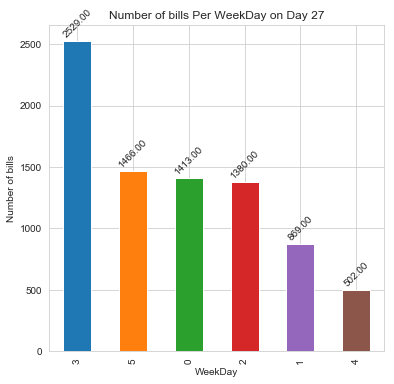

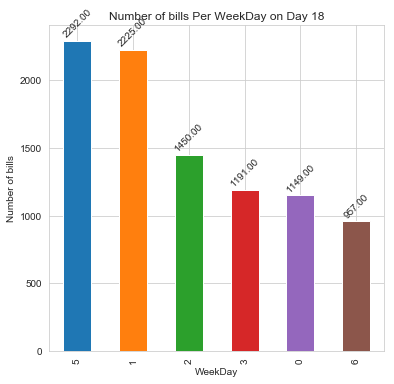

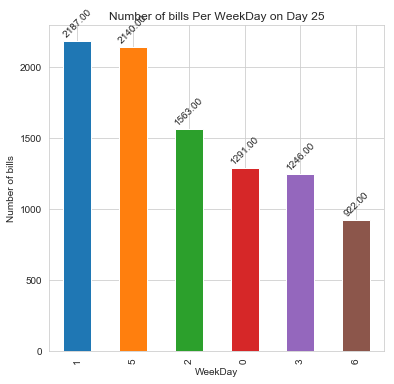

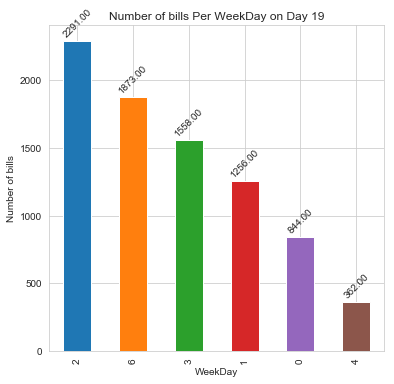

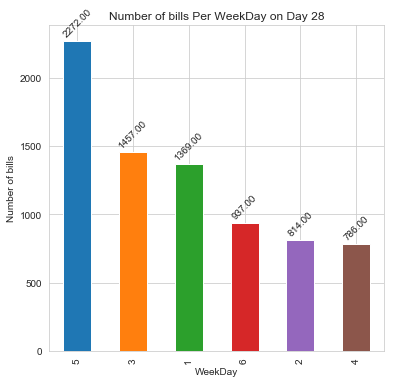

In [26]:
for i in range(0,len(day_list)):
    counts = df_main['DayofWeek'][df_main['Day']==day_list[i]].value_counts()
    if counts.any():   
        fig = plt.figure(figsize=(6,6))
        sns.set_style("whitegrid")
        ax = fig.gca()
        counts.plot.bar(ax=ax)
        ax.set_title('Number of bills Per WeekDay on Day '+str(day_list[i]))
        ax.set_xlabel('WeekDay')
        ax.set_ylabel('Number of bills')
        plot_value_labels(fig.gca())

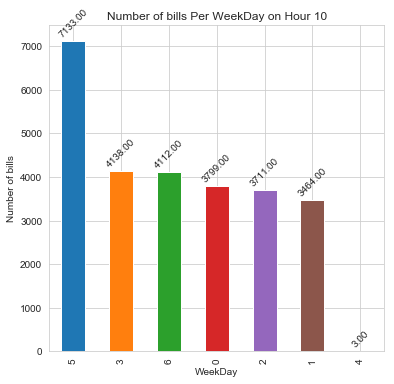

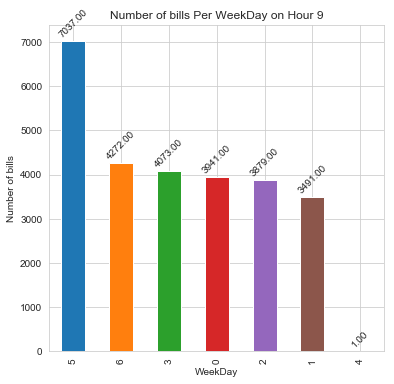

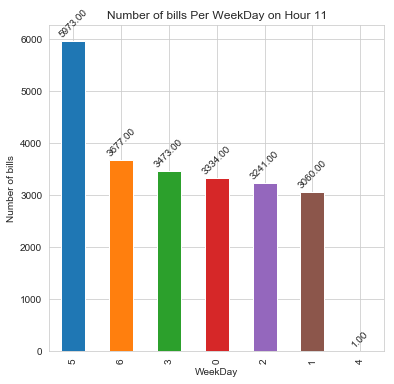

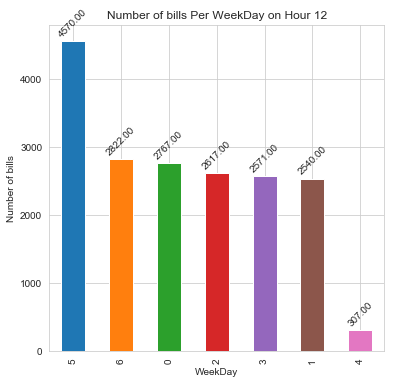

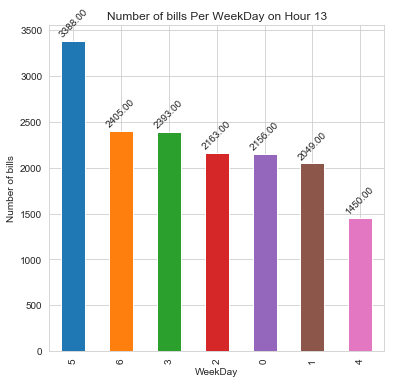

...

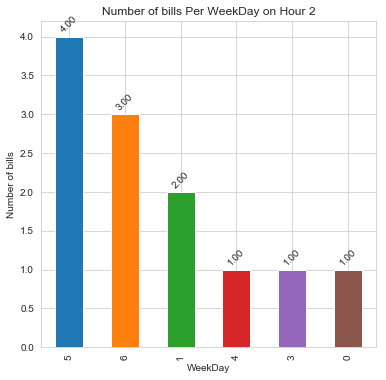

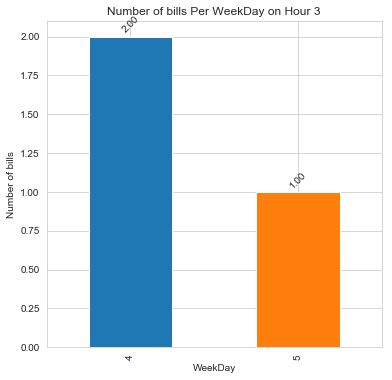

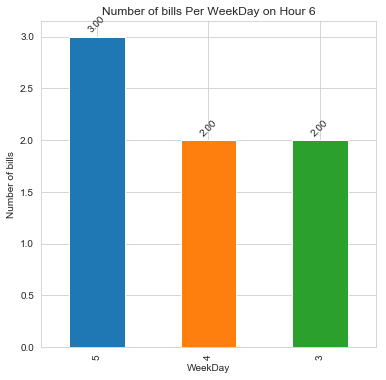

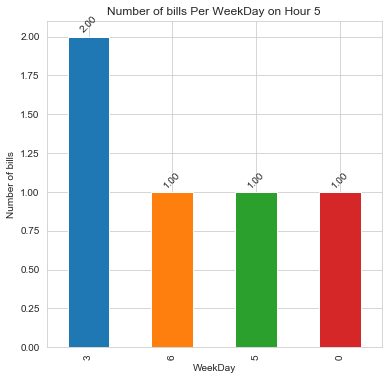

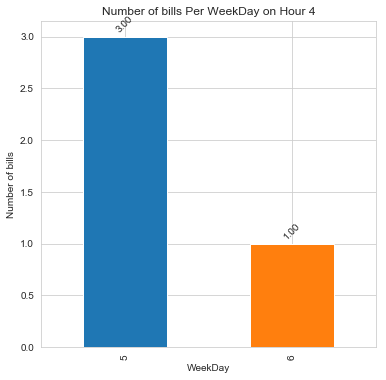

In [27]:
for i in range(0,len(hour_list)):
    counts = df_main['DayofWeek'][df_main['Hour']==hour_list[i]].value_counts()
    if counts.any():   
        fig = plt.figure(figsize=(6,6))
        sns.set_style("whitegrid")
        ax = fig.gca()
        counts.plot.bar(ax=ax)
        ax.set_title('Number of bills Per WeekDay on Hour '+str(hour_list[i]))
        ax.set_xlabel('WeekDay')
        ax.set_ylabel('Number of bills')
        plot_value_labels(fig.gca())

## Number of Bills Per  Day                     

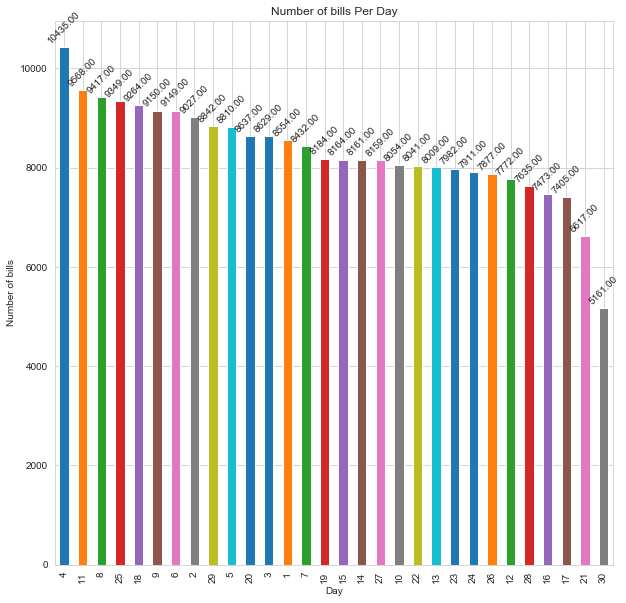

In [28]:
counts = df_main['Day'].value_counts()
fig = plt.figure(figsize=(10,10))
ax = fig.gca()
sns.set_style("whitegrid")
counts.plot.bar(ax=ax)
ax.set_title('Number of bills Per Day')
ax.set_xlabel('Day')
ax.set_ylabel('Number of bills')
plot_value_labels(fig.gca())

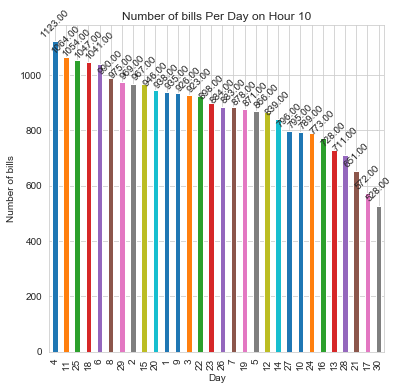

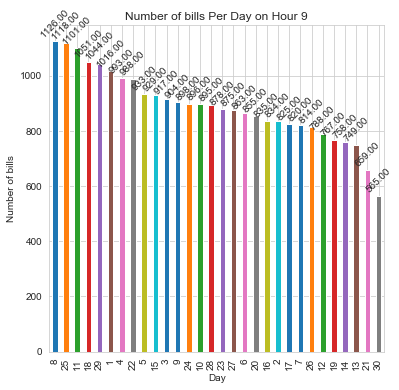

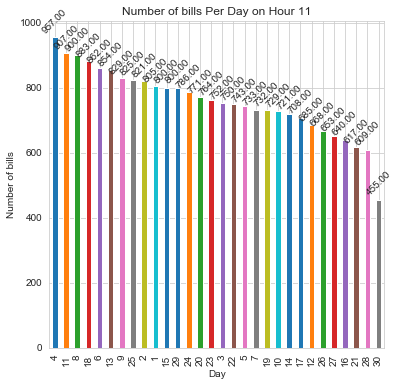

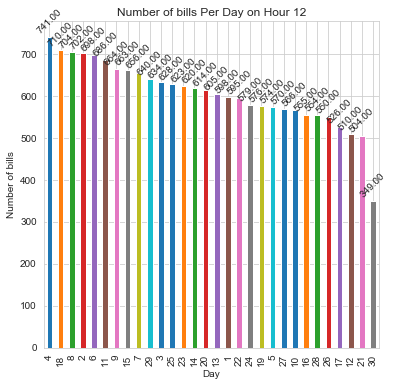

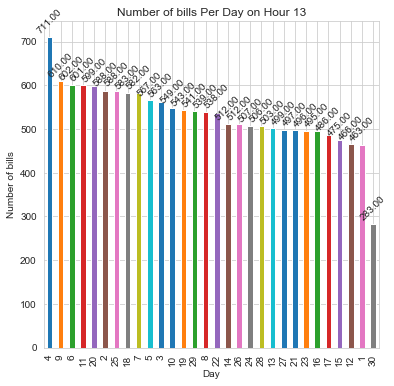

...

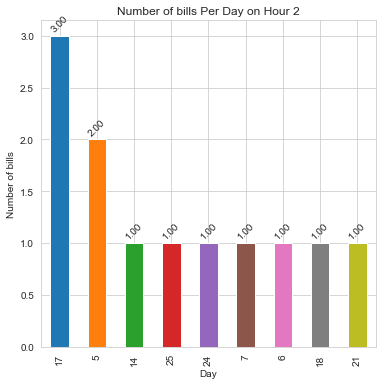

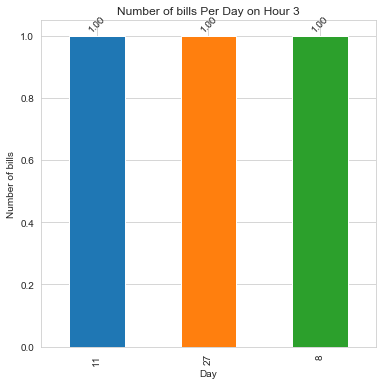

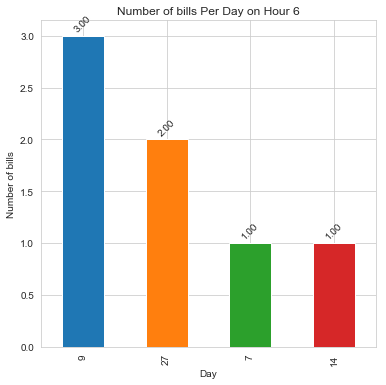

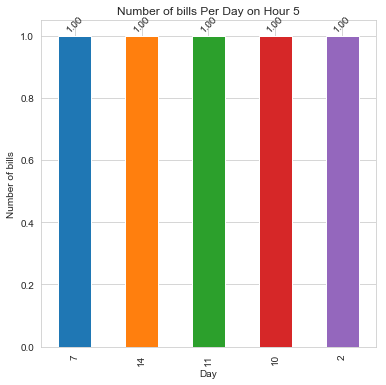

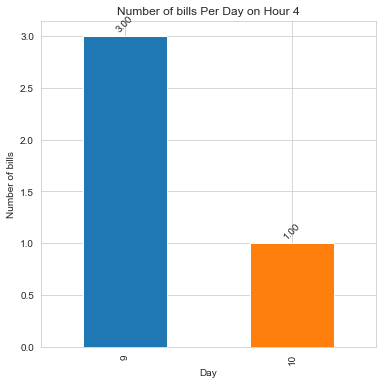

In [29]:
for i in range(0,len(hour_list)):
    counts = df_main['Day'][df_main['Hour']==hour_list[i]].value_counts()
    if counts.any():   
        fig = plt.figure(figsize=(6,6))
        sns.set_style("whitegrid")
        ax = fig.gca()
        counts.plot.bar(ax=ax)
        ax.set_title('Number of bills Per Day on Hour '+str(hour_list[i]))
        ax.set_xlabel('Day')
        ax.set_ylabel('Number of bills')
        plot_value_labels(fig.gca())

## Number of Bills Per Hour                  

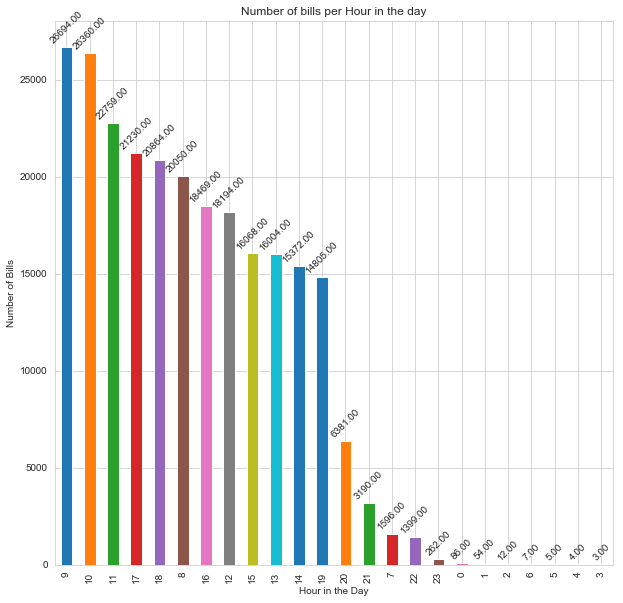

In [30]:
counts = df_main['Hour'].value_counts()
fig = plt.figure(figsize=(10,10))
ax = fig.gca()
sns.set_style("whitegrid")
counts.plot.bar(ax=ax)
ax.set_title('Number of bills per Hour in the day')
ax.set_xlabel('Hour in the Day')
ax.set_ylabel('Number of Bills')
plot_value_labels(fig.gca())

In [28]:
df_main.head()

,BillNo,BillDate,ClientNo,Quantity,Total,Price,Hour,DayofWeek,Month,Day,AreaNo,TarifNo,Month_Period,Period,Peak,WeekEnd
0,138474,12/1/2018,Y00003798-001,142.367,83.0,0.583,10,5,12,1,18,3.0,3,Morning,1,1
1,617032,12/1/2018,Y00008137-001,113.208,66.0,0.583,10,5,12,1,18,3.0,3,Morning,1,1
2,138477,12/1/2018,Y00015731-001,142.367,83.0,0.583,10,5,12,1,24,3.0,3,Morning,1,1
3,6074,12/1/2018,Y00009576-001,90.909,53.0,0.583,10,5,12,1,10,3.0,3,Morning,1,1
4,138479,12/1/2018,Y00002741-001,82.333,48.0,0.583,10,5,12,1,43,3.0,3,Morning,1,1


# Quantity Consumption Analysis

Text(0, 0.5, 'Total Quantity Consumed in KWH')

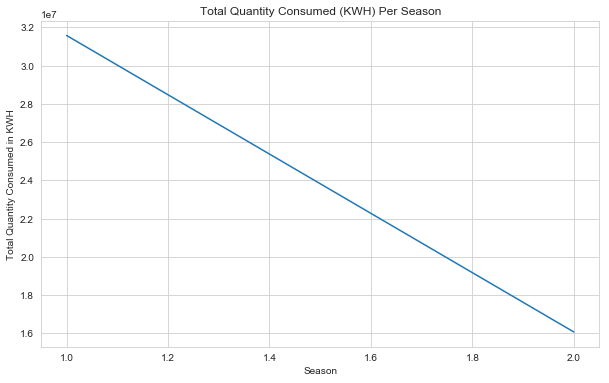

In [49]:
fig = plt.figure(figsize=(10,6))
season = ["1  Summer","2  Autumn"]
ax = fig.gca()
sns.set_style("whitegrid")
counts= df_main.groupby('Season').Quantity.sum()
#ax.legend(wedges, season,title="Season",loc="center left",bbox_to_anchor=(1, 0, 0.5, 1))
counts.plot.line(ax=ax)
ax.set_title('Total Quantity Consumed (KWH) Per Season')
ax.set_xlabel('Season')
ax.set_ylabel('Total Quantity Consumed in KWH')

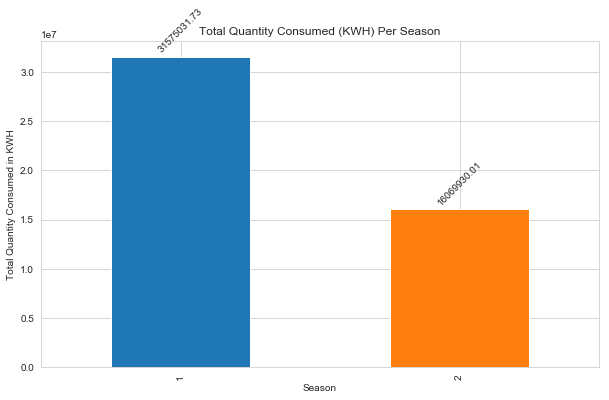

In [55]:
fig = plt.figure(figsize=(10,6))
season = ["1  Summer","2  Autumn"]
ax = fig.gca()
sns.set_style("whitegrid")
counts= df_main.groupby('Season').Quantity.sum()
#ax.legend( ,season,title="Season",loc="center left",bbox_to_anchor=(1, 0, 0.5, 1))
counts.plot.bar(ax=ax)
ax.set_title('Total Quantity Consumed (KWH) Per Season')
ax.set_xlabel('Season')
ax.set_ylabel('Total Quantity Consumed in KWH')
plot_value_labels(fig.gca())

Text(0.5, 1.0, 'Total Quantity Consumed in Summer Per Area')

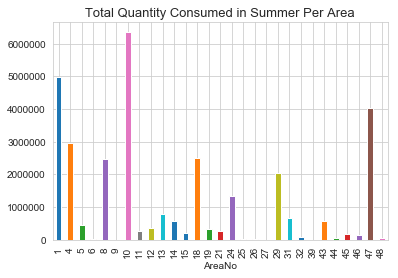

In [326]:
pos=0.35
g = df_main.groupby(['Season','AreaNo']).Quantity.sum()[1]
g.plot.bar()
plt.title('Total Quantity Consumed in Summer Per Area',fontsize=13)

Text(0.5, 1.0, 'Total Quantity Consumed in Autumn Per Area')

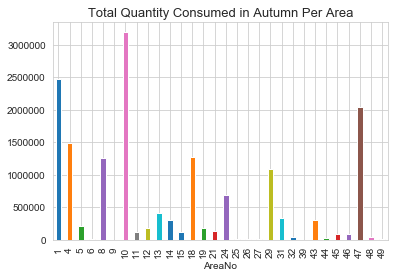

In [327]:
g = df_main.groupby(['Season','AreaNo']).Quantity.sum()[2]
g.plot.bar()
plt.title('Total Quantity Consumed in Autumn Per Area',fontsize=13)

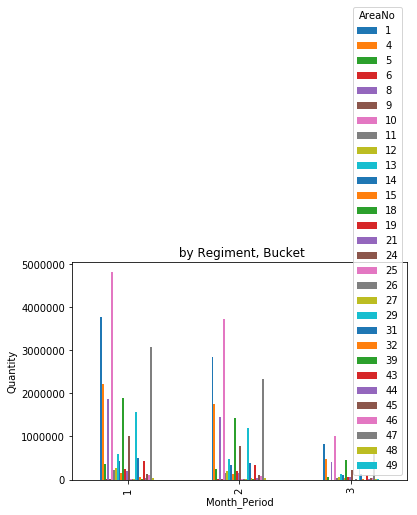

In [30]:
groupbyregimentbucket = df_main.groupby(['Month_Period', 'AreaNo'])

regimentbucketclicksum = groupbyregimentbucket['Quantity'].aggregate(np.sum).unstack()

regimentbucketclicksum.plot(kind = 'bar', title = ' by Regiment, Bucket')
plt.ylabel('Quantity')
plt.show()

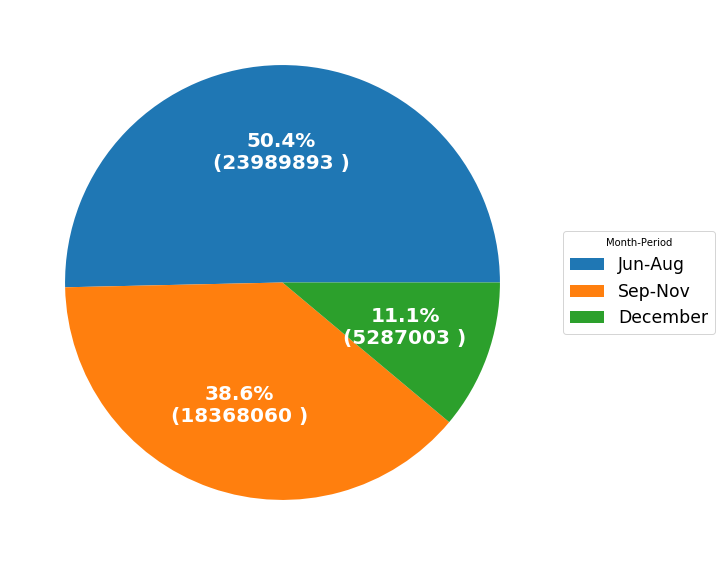

In [33]:
fig, ax = plt.subplots(figsize=(10, 10), subplot_kw=dict(aspect="equal"))
season = ["Jun-Aug","Sep-Nov","December"]
data = df_main.groupby(['Month_Period']).Quantity.sum()
wedges, texts, autotexts = ax.pie(data, autopct=lambda pct: func(pct, data),
                                  textprops=dict(color="w"))
ax.legend(wedges, season,title="Month-Period",loc="center left",bbox_to_anchor=(1, 0, 0.5, 1),fontsize="xx-large")
plt.setp(autotexts, fontsize=20, weight="bold")
#ax.set_title("Percentage of Total Quantity Consumed Per Season")
plt.show()

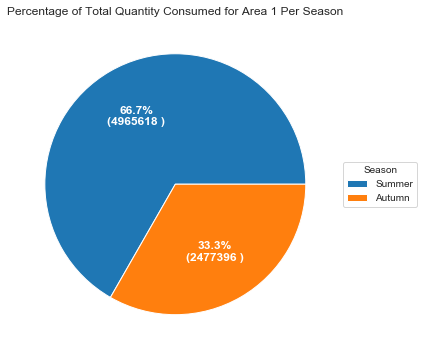

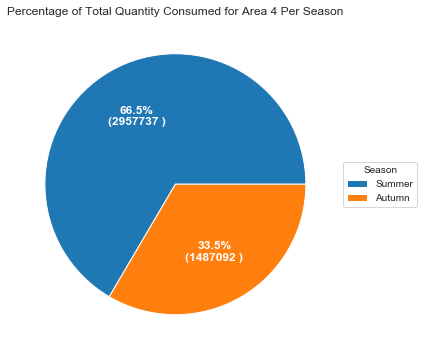

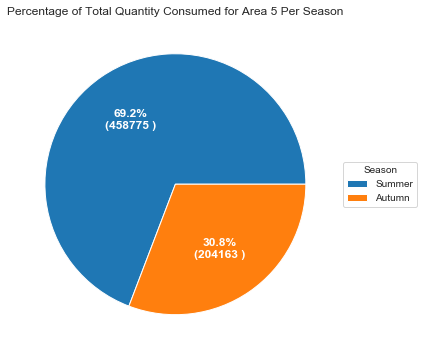

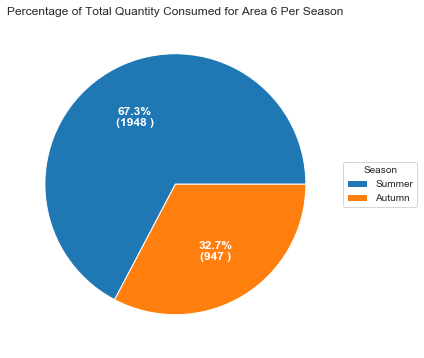

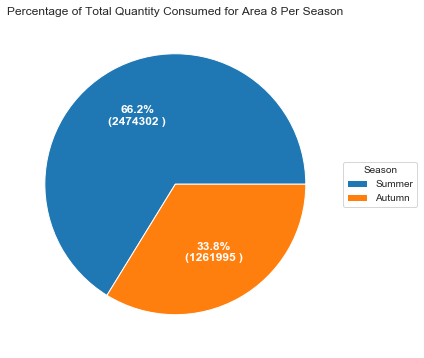

...

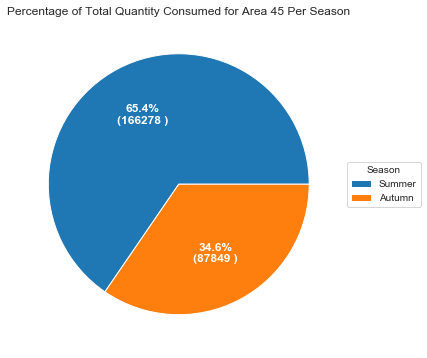

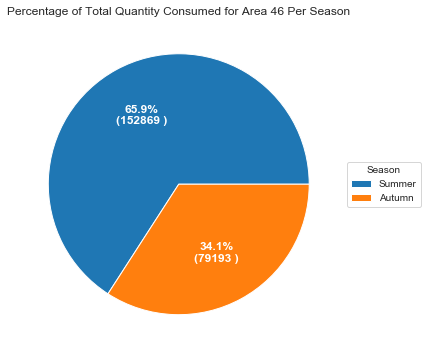

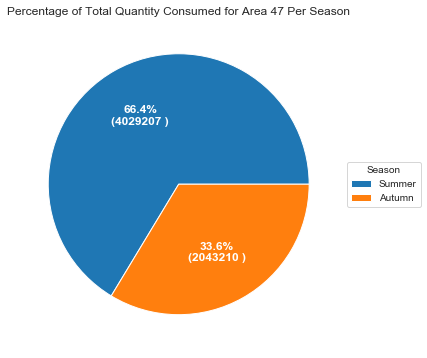

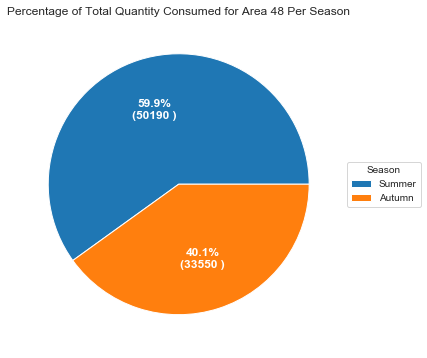

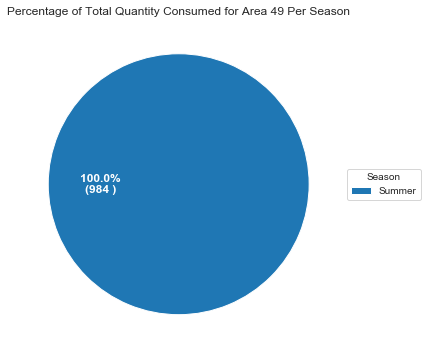

In [236]:
g=df_main.groupby(['AreaNo','Season']).Quantity.sum()
g=g.reset_index()
g1=g.AreaNo.unique()
for i in g1:
    fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(aspect="equal"))
    month = ["Summer","Autumn"]
    data = df_main.groupby(['AreaNo','Season']).Quantity.sum()[i]
    wedges, texts, autotexts = ax.pie(data, autopct=lambda pct: func(pct, data),
                                  textprops=dict(color="w"))
    ax.legend(wedges, month,title="Season",loc="center left",bbox_to_anchor=(1, 0, 0.5, 1))
    plt.setp(autotexts, size=12, weight="bold")
    ax.set_title("Percentage of Total Quantity Consumed for Area "+str(i)+" Per Season")
    plt.show()

Text(0, 0.5, 'Total Quantity Consumed in KWH')

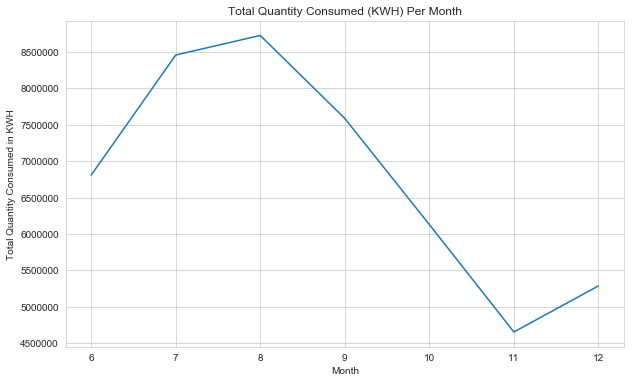

In [122]:
fig = plt.figure(figsize=(10,6))
ax = fig.gca()
sns.set_style("whitegrid")
counts= df_main.groupby('Month').Quantity.sum()
counts.plot.line(ax=ax)
ax.set_title('Total Quantity Consumed (KWH) Per Month')
ax.set_xlabel('Month')
ax.set_ylabel('Total Quantity Consumed in KWH')

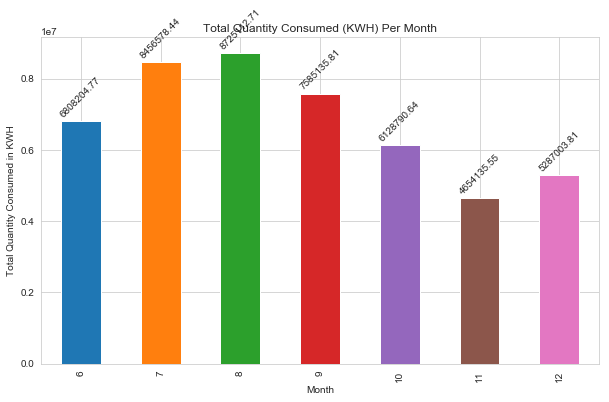

In [123]:
fig = plt.figure(figsize=(10,6))
ax = fig.gca()
sns.set_style("whitegrid")
counts= df_main.groupby('Month').Quantity.sum()
counts.plot.bar(ax=ax)
ax.set_title('Total Quantity Consumed (KWH) Per Month')
ax.set_xlabel('Month')
ax.set_ylabel('Total Quantity Consumed in KWH')
plot_value_labels(fig.gca())

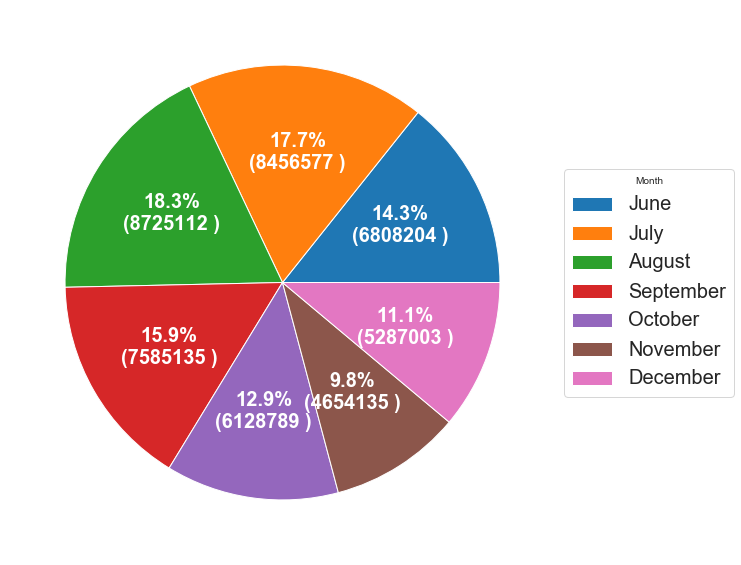

In [33]:
fig, ax = plt.subplots(figsize=(10, 10), subplot_kw=dict(aspect="equal"))
month = ["June","July","August","September","October","November","December"]
data = df_main.groupby(['Month']).Quantity.sum()
wedges, texts, autotexts = ax.pie(data, autopct=lambda pct: func(pct, data),
                                  textprops=dict(color="w"))
ax.legend(wedges, month,title="Month",loc="center left",bbox_to_anchor=(1, 0, 0.5, 1), fontsize=20)
plt.setp(autotexts, fontsize=20, weight="bold")
#ax.set_title("Percentage of Total Quantity Consumed Per Month")
plt.show()

In [17]:
def get_season(a):
    if a in [6,7,8,9]:
        return 1
    else:
        return 2
df_main['Season'] = df_main.apply(lambda row: get_season(row['Month']), axis=1)

Text(0, 0.5, 'Total Quantity Consumed in KWH')

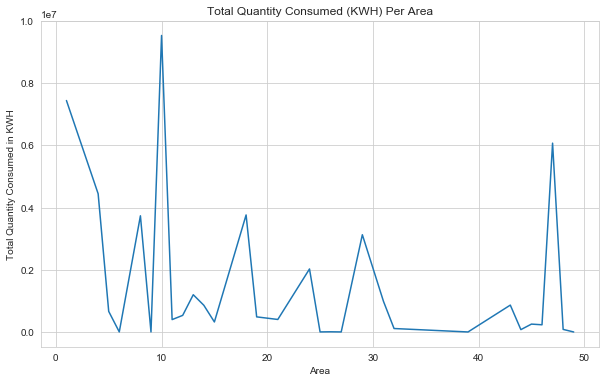

In [125]:
fig = plt.figure(figsize=(10,6))
ax = fig.gca()
sns.set_style("whitegrid")
counts= df_main.groupby('AreaNo').Quantity.sum()
counts.plot.line(ax=ax)
ax.set_title('Total Quantity Consumed (KWH) Per Area')
ax.set_xlabel('Area')
ax.set_ylabel('Total Quantity Consumed in KWH')

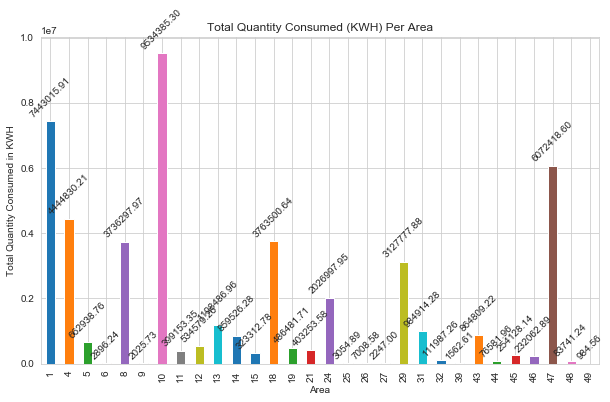

In [126]:
fig = plt.figure(figsize=(10,6))
ax = fig.gca()
sns.set_style("whitegrid")
counts= df_main.groupby('AreaNo').Quantity.sum()
counts.plot.bar(ax=ax)
ax.set_title('Total Quantity Consumed (KWH) Per Area')
ax.set_xlabel('Area')
ax.set_ylabel('Total Quantity Consumed in KWH')
plot_value_labels(fig.gca())

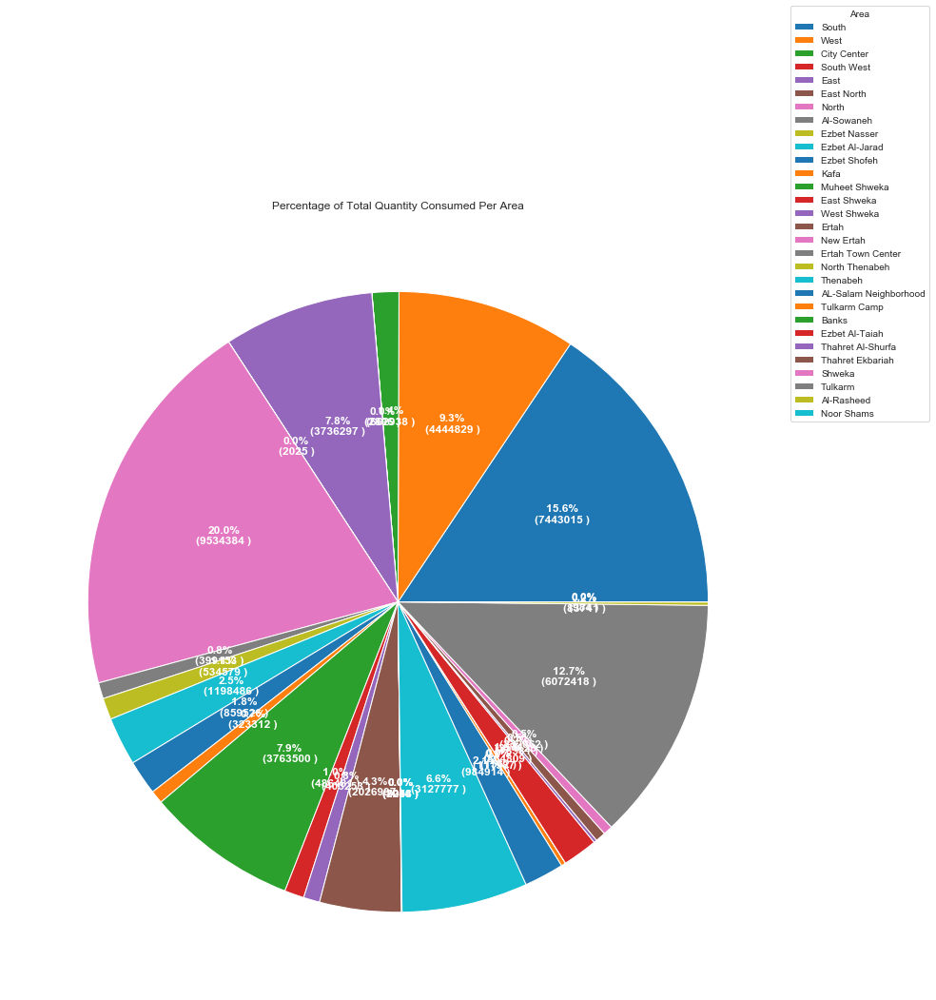

In [246]:
fig, ax = plt.subplots(figsize=(15, 15), subplot_kw=dict(aspect="equal"))
#area = ["6 Jun","7 Jul","8 Aug","9 Sep","10 Oct","11 Nov","12 Dec"]
data = df_main.groupby(['AreaNo']).Quantity.sum()
wedges, texts, autotexts = ax.pie(data, autopct=lambda pct: func(pct, data),
                                  textprops=dict(color="w"))
ax.legend(wedges, areaname_list,title="Area",loc="center left",bbox_to_anchor=(1, 0.5, 0.5, 1))
plt.setp(autotexts, size=12, weight="bold")
ax.set_title("Percentage of Total Quantity Consumed Per Area")
plt.show()

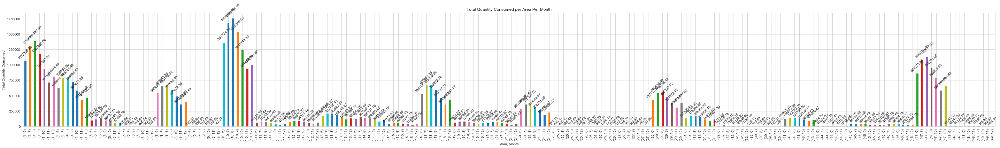

In [128]:
g = df_main.groupby(['AreaNo','Month']).Quantity.sum()
fig = plt.figure(figsize=(50,6))
ax = fig.gca()
sns.set_style("whitegrid")
g.plot.bar(ax=ax)
ax.set_title('Total Quantity Consumed per Area Per Month')
ax.set_xlabel('Area, Month')
ax.set_ylabel('Total Quantity Consumed')
plot_value_labels(fig.gca())

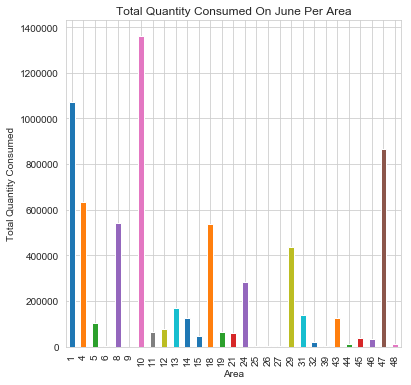

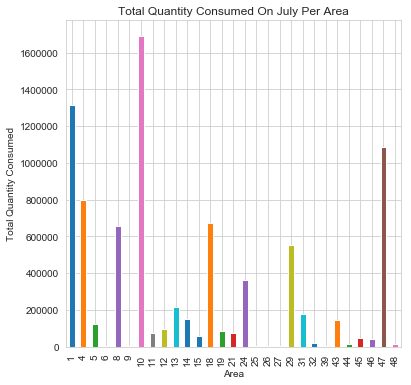

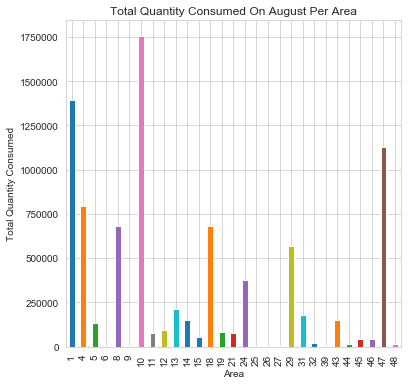

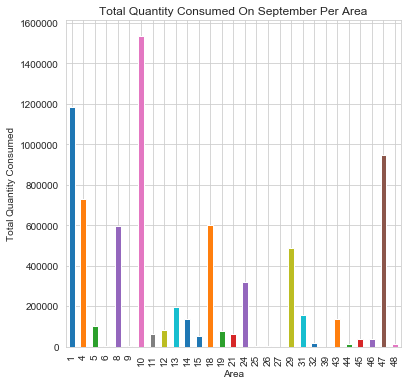

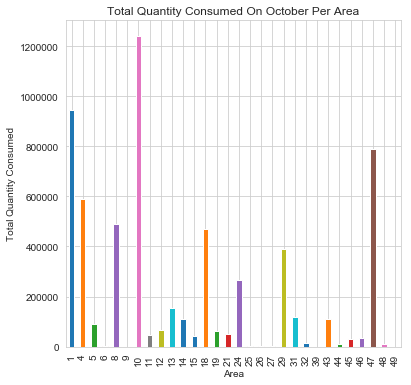

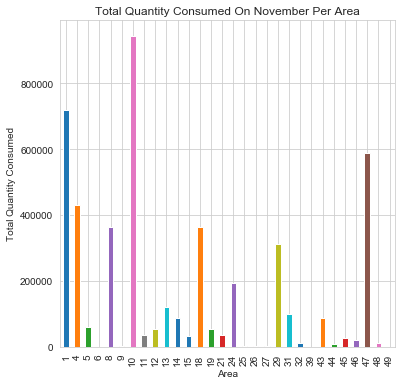

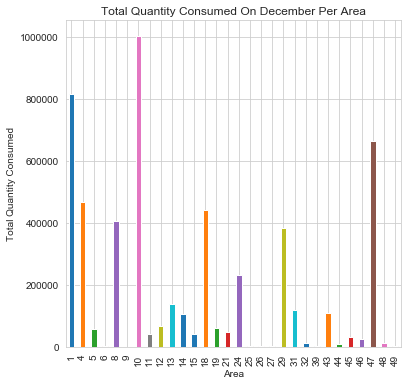

In [17]:
month = ["June","July","August","September","October","November","December"]
g=df_main.groupby(['Month','AreaNo']).Quantity.sum()
g=g.reset_index()
g1=g.Month.unique()
for i in g1:
    g = df_main.groupby(['Month','AreaNo']).Quantity.sum()[i]
    fig = plt.figure(figsize=(6,6))
    ax = fig.gca()
    sns.set_style("whitegrid")
    g.plot.bar(ax=ax) 
    ax.set_title('Total Quantity Consumed On '+month[i-6]+' Per Area')
    ax.set_xlabel('Area')
    ax.set_ylabel('Total Quantity Consumed')
   # plot_value_labels(fig.gca())

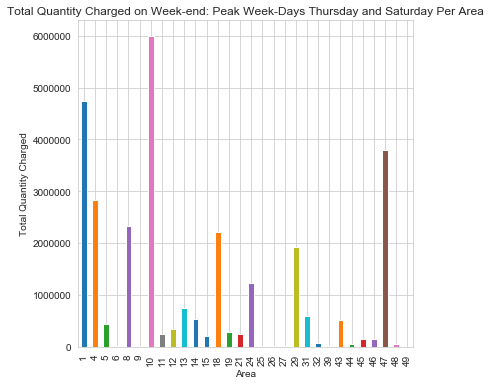

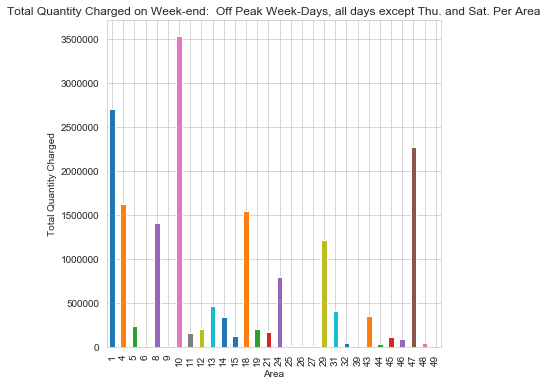

In [18]:
peakweekday=['Peak Week-Days Thursday and Saturday',' Off Peak Week-Days, all days except Thu. and Sat.']
g=df_main.groupby(['WeekEnd','AreaNo']).Quantity.sum()
g=g.reset_index()
g1=g.WeekEnd.unique()
for i in g1:
    g = df_main.groupby(['WeekEnd','AreaNo']).Quantity.sum()[i]
    fig = plt.figure(figsize=(6,6))
    ax = fig.gca()
    sns.set_style("whitegrid")
    g.plot.bar(ax=ax) 
    ax.set_title('Total Quantity Charged on Week-end: '+peakweekday[i]+' Per Area')
    ax.set_xlabel('Area')
    ax.set_ylabel('Total Quantity Charged')
    #plot_value_labels(fig.gca())

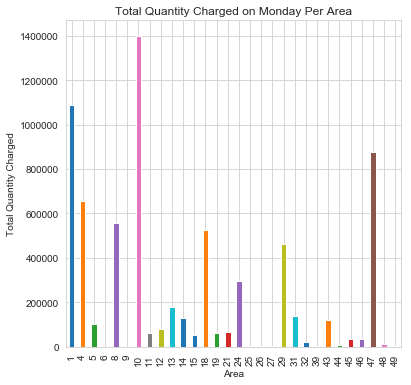

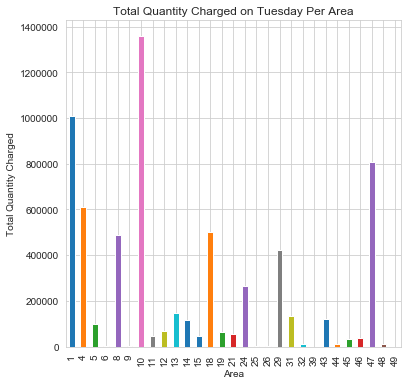

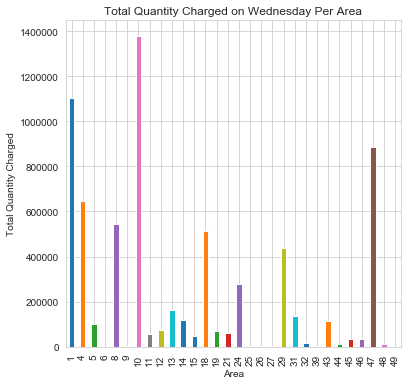

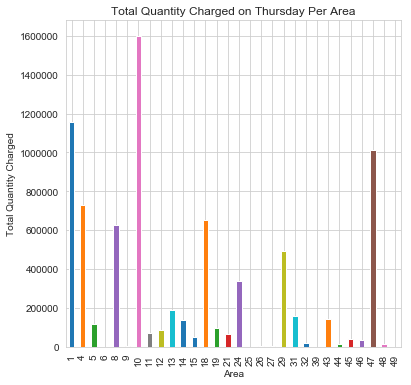

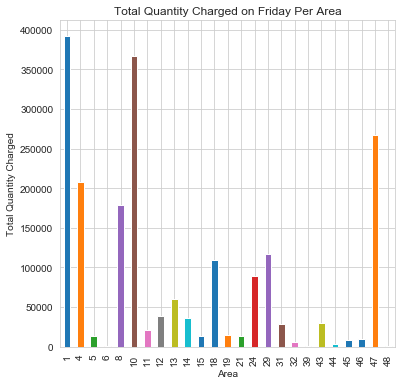

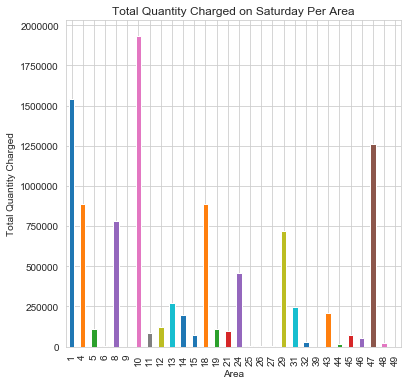

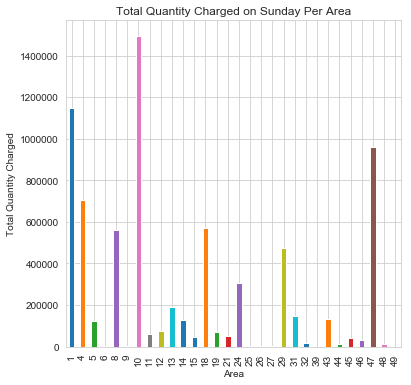

In [20]:
days=['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
g=df_main.groupby(['DayofWeek','AreaNo']).Quantity.sum()
g=g.reset_index()
g1=g.DayofWeek.unique()
for i in g1:
    g = df_main.groupby(['DayofWeek','AreaNo']).Quantity.sum()[i]
    fig = plt.figure(figsize=(6,6))
    ax = fig.gca()
    sns.set_style("whitegrid")
    g.plot.bar(ax=ax) 
    ax.set_title('Total Quantity Charged on '+days[i]+' Per Area')
    ax.set_xlabel('Area')
    ax.set_ylabel('Total Quantity Charged')
    #plot_value_labels(fig.gca())

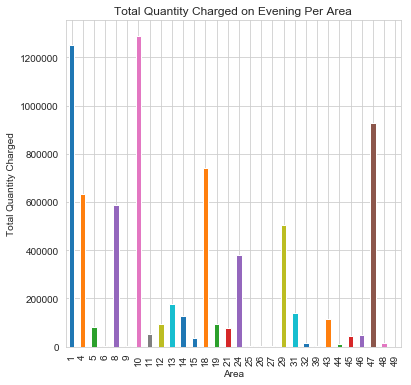

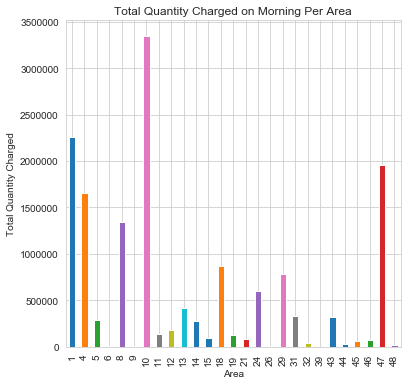

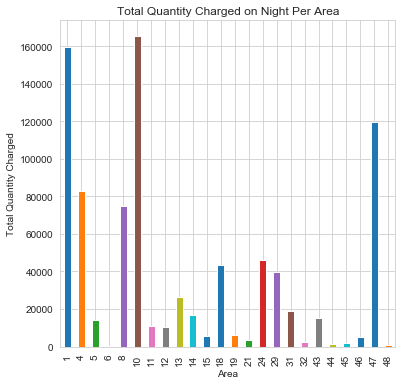

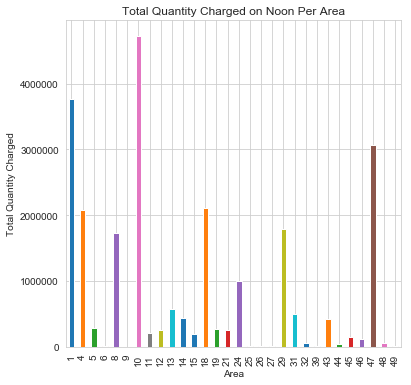

In [21]:
g=df_main.groupby(['Period','AreaNo']).Quantity.sum()
g=g.reset_index()
g1=g.Period.unique()
for i in g1:
    g = df_main.groupby(['Period','AreaNo']).Quantity.sum()[i]
    fig = plt.figure(figsize=(6,6))
    ax = fig.gca()
    sns.set_style("whitegrid")
    g.plot.bar(ax=ax) 
    ax.set_title('Total Quantity Charged on '+i+' Per Area')
    ax.set_xlabel('Area')
    ax.set_ylabel('Total Quantity Charged')
    #plot_value_labels(fig.gca())

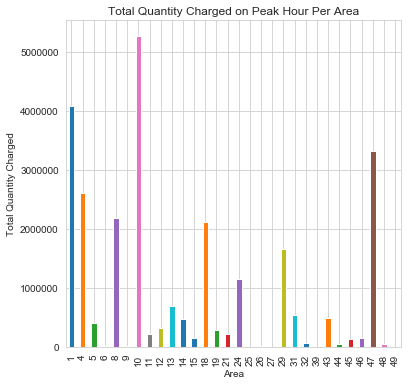

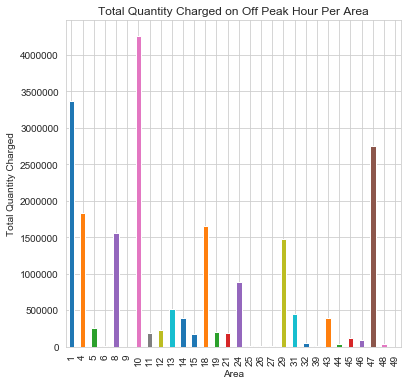

In [22]:
g=df_main.groupby(['Peak','AreaNo']).Quantity.sum()
g=g.reset_index()
g1=g.Peak.unique()
par=['','Peak Hour','Off Peak Hour']
for i in g1:
    g = df_main.groupby(['Peak','AreaNo']).Quantity.sum()[i]
    fig = plt.figure(figsize=(6,6))
    ax = fig.gca()
    sns.set_style("whitegrid")
    g.plot.bar(ax=ax) 
    ax.set_title('Total Quantity Charged on '+par[i]+' Per Area')
    ax.set_xlabel('Area')
    ax.set_ylabel('Total Quantity Charged')
   # plot_value_labels(fig.gca())

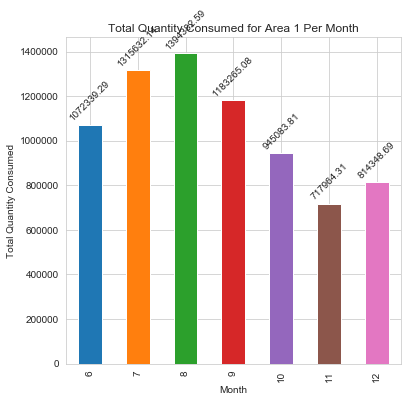

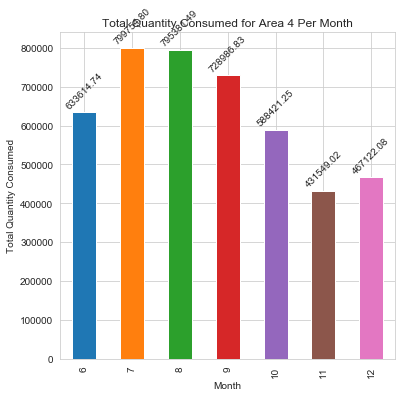

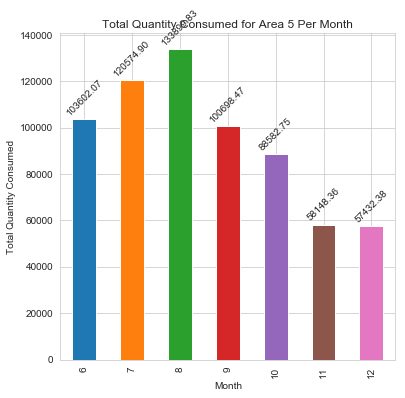

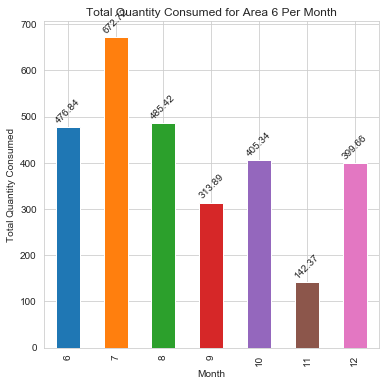

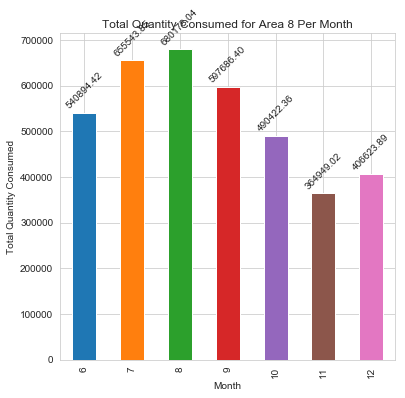

...

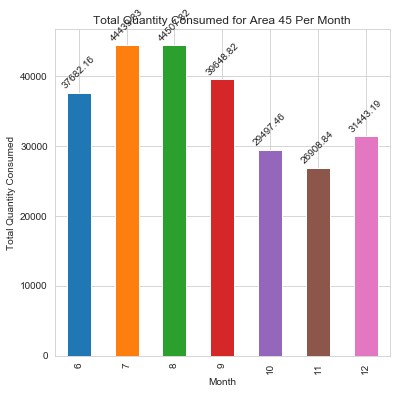

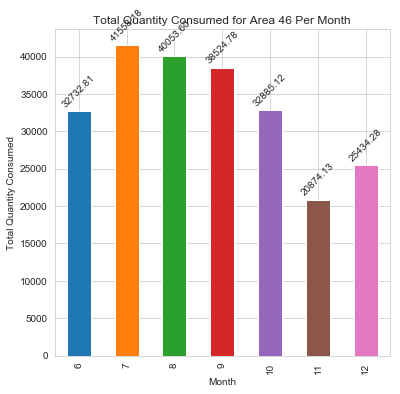

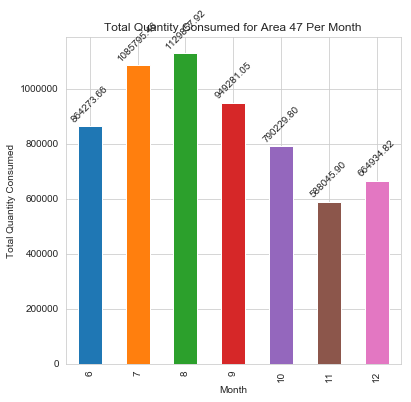

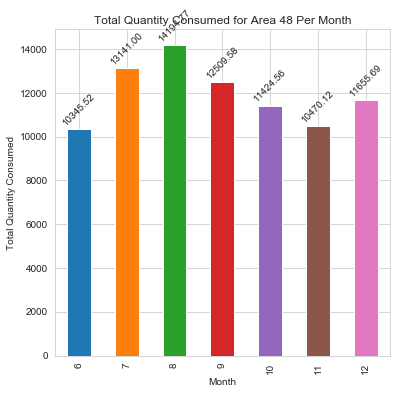

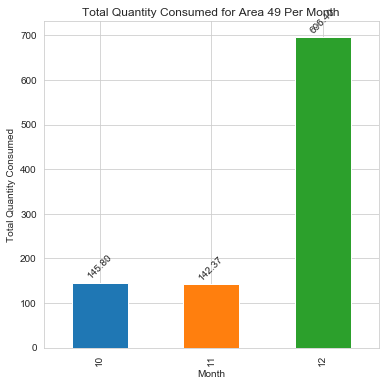

In [129]:
g=df_main.groupby(['AreaNo','Month']).Quantity.sum()
g=g.reset_index()
g1=g.AreaNo.unique()
for i in g1:
    g = df_main.groupby(['AreaNo','Month']).Quantity.sum()[i]
    fig = plt.figure(figsize=(6,6))
    ax = fig.gca()
    sns.set_style("whitegrid")
    g.plot.bar(ax=ax) 
    ax.set_title('Total Quantity Consumed for Area '+str(i)+' Per Month')
    ax.set_xlabel('Month')
    ax.set_ylabel('Total Quantity Consumed')
    plot_value_labels(fig.gca())

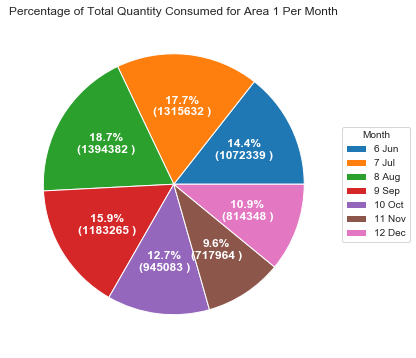

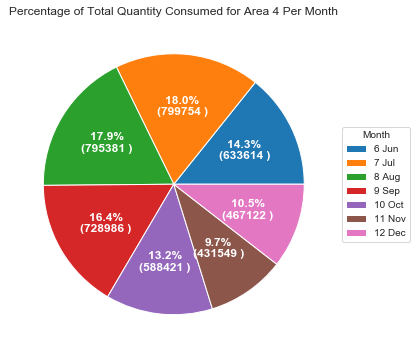

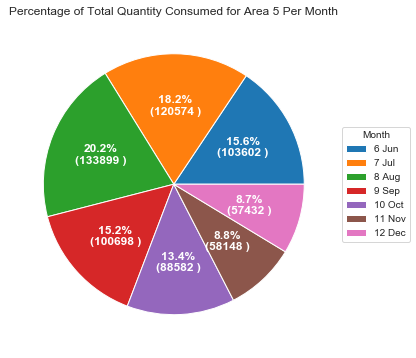

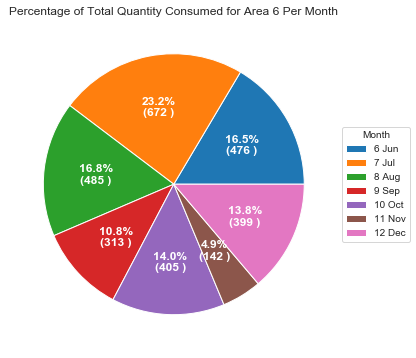

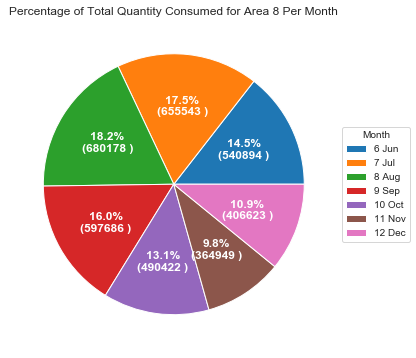

...

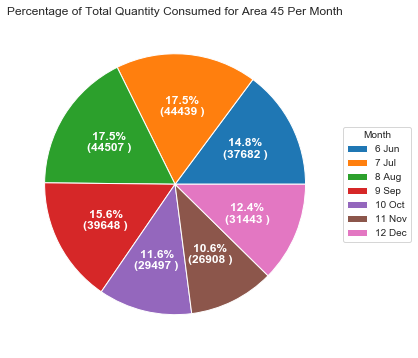

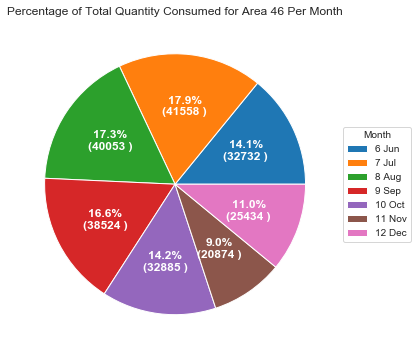

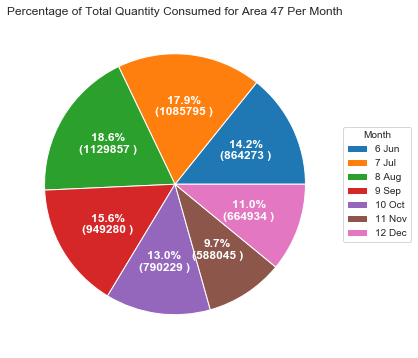

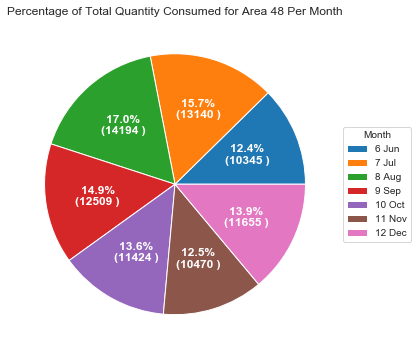

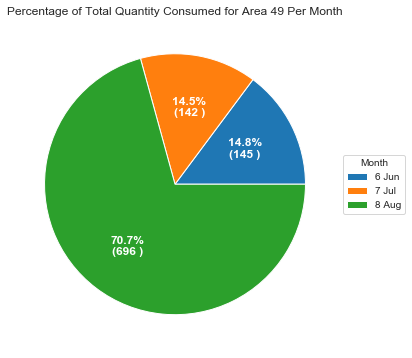

In [130]:
g=df_main.groupby(['AreaNo','Month']).Quantity.sum()
g=g.reset_index()
g1=g.AreaNo.unique()
for i in g1:
    fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(aspect="equal"))
    month = ["6 Jun","7 Jul","8 Aug","9 Sep","10 Oct","11 Nov","12 Dec"]
    data = df_main.groupby(['AreaNo','Month']).Quantity.sum()[i]
    wedges, texts, autotexts = ax.pie(data, autopct=lambda pct: func(pct, data),
                                  textprops=dict(color="w"))
    ax.legend(wedges, month,title="Month",loc="center left",bbox_to_anchor=(1, 0, 0.5, 1))
    plt.setp(autotexts, size=12, weight="bold")
    ax.set_title("Percentage of Total Quantity Consumed for Area "+str(i)+" Per Month")
    plt.show()

Text(0, 0.5, 'Total Quantity Consumed in KWH')

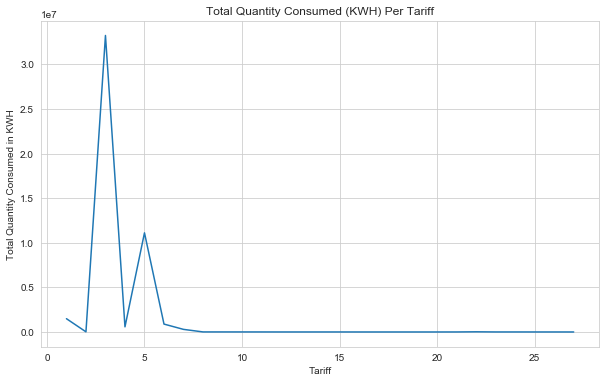

In [131]:
fig = plt.figure(figsize=(10,6))
ax = fig.gca()
sns.set_style("whitegrid")
counts= df_main.groupby('TarifNo').Quantity.sum()
counts.plot.line(ax=ax)
ax.set_title('Total Quantity Consumed (KWH) Per Tariff')
ax.set_xlabel('Tariff')
ax.set_ylabel('Total Quantity Consumed in KWH')

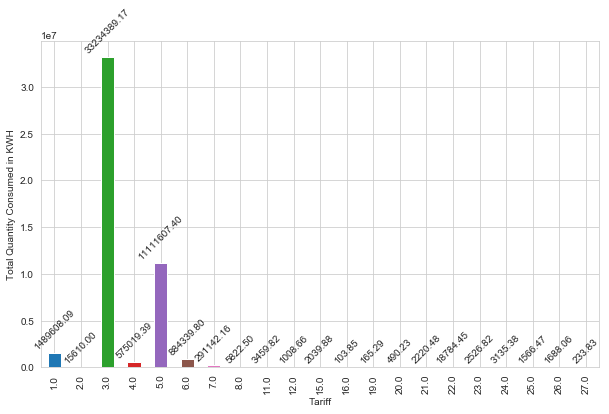

In [91]:
fig = plt.figure(figsize=(10,6))
ax = fig.gca()
sns.set_style("whitegrid")
counts= df_main.groupby('TarifNo').Quantity.sum()
counts.plot.bar(ax=ax)
#ax.set_title('Total Quantity Consumed (KWH) Per Tariff')
ax.set_xlabel('Tariff')
ax.set_ylabel('Total Quantity Consumed in KWH')
plot_value_labels(fig.gca())

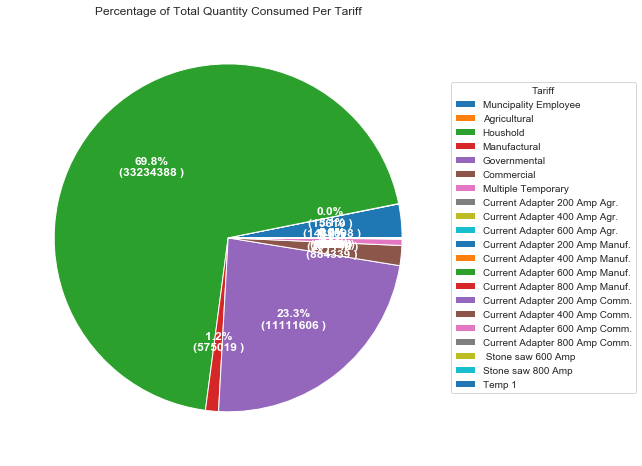

In [224]:
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(aspect="equal"))
#area = ["6 Jun","7 Jul","8 Aug","9 Sep","10 Oct","11 Nov","12 Dec"]
data = df_main.groupby(['TarifNo']).Quantity.sum()
wedges, texts, autotexts = ax.pie(data, autopct=lambda pct: func(pct, data),
                                  textprops=dict(color="w"))
ax.legend(wedges, tarifname_list,title="Tariff",loc="center left",bbox_to_anchor=(1, 0, 0.5, 1))
plt.setp(autotexts, size=12, weight="bold")
ax.set_title("Percentage of Total Quantity Consumed Per Tariff")
plt.show()

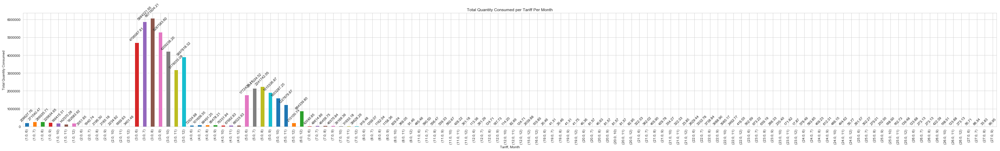

In [134]:
g = df_main.groupby(['TarifNo','Month']).Quantity.sum()
fig = plt.figure(figsize=(50,6))
ax = fig.gca()
sns.set_style("whitegrid")
g.plot.bar(ax=ax)
ax.set_title('Total Quantity Consumed per Tariff Per Month')
ax.set_xlabel('Tariff, Month')
ax.set_ylabel('Total Quantity Consumed')
plot_value_labels(fig.gca())

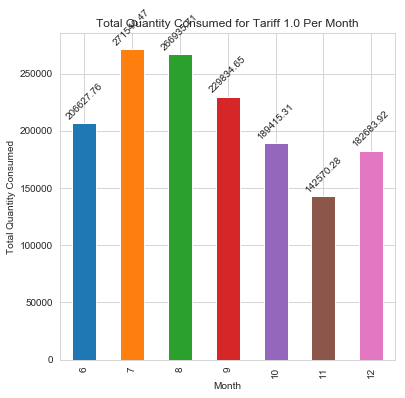

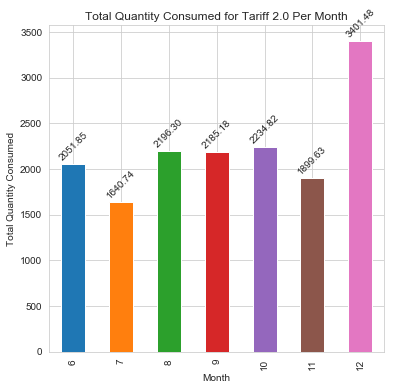

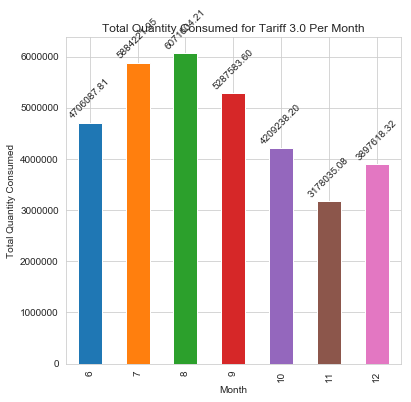

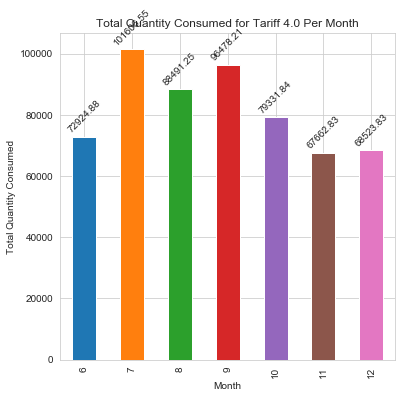

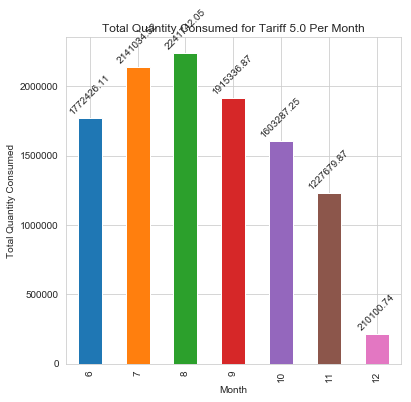

...

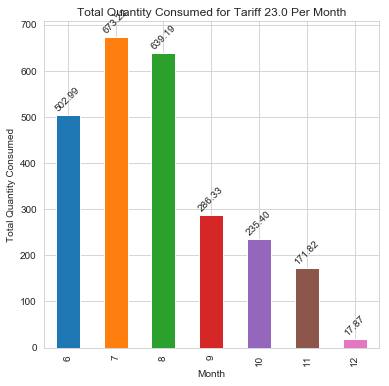

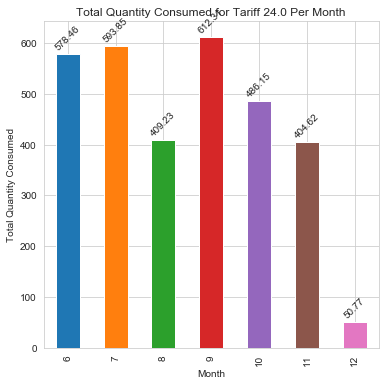

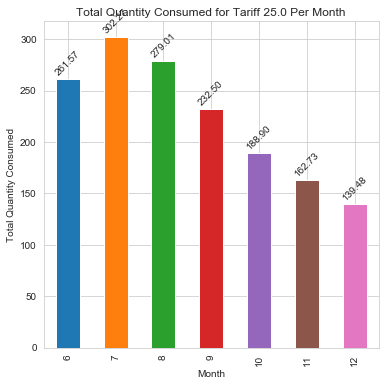

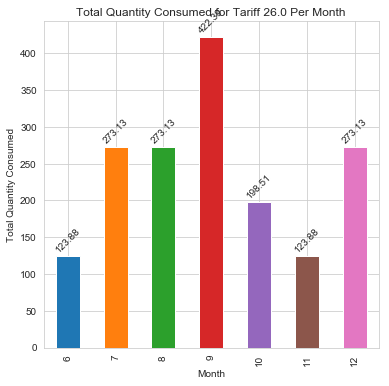

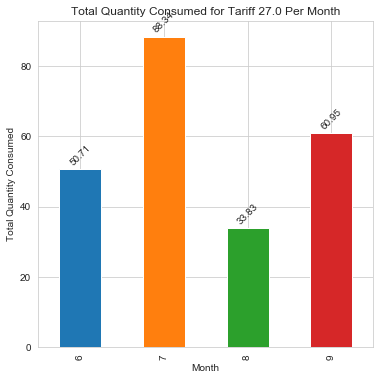

In [135]:
g=df_main.groupby(['TarifNo','Month']).Quantity.sum()
g=g.reset_index()
g1=g.TarifNo.unique()
for i in g1:
    g = df_main.groupby(['TarifNo','Month']).Quantity.sum()[i]
    fig = plt.figure(figsize=(6,6))
    ax = fig.gca()
    sns.set_style("whitegrid")
    g.plot.bar(ax=ax) 
    ax.set_title('Total Quantity Consumed for Tariff '+str(i)+' Per Month')
    ax.set_xlabel('Month')
    ax.set_ylabel('Total Quantity Consumed')
    plot_value_labels(fig.gca())

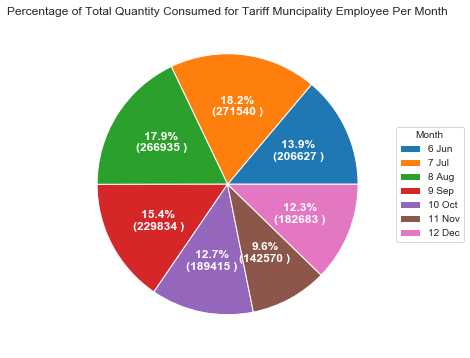

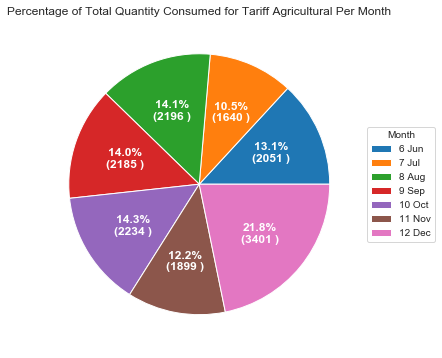

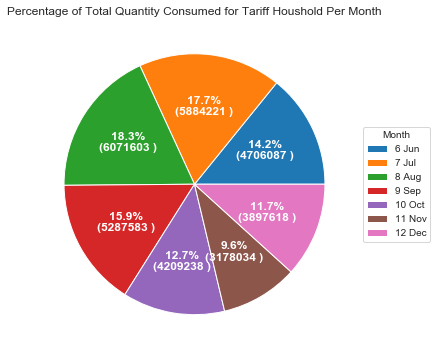

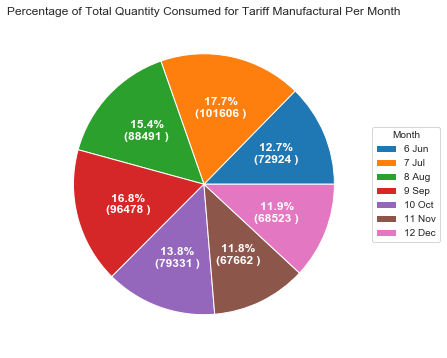

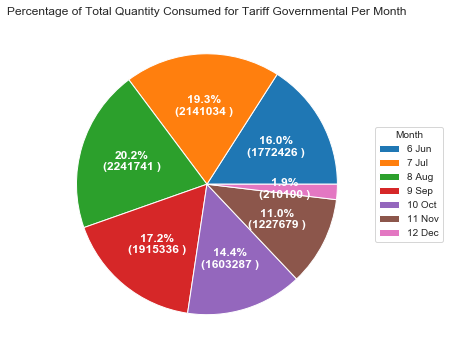

...

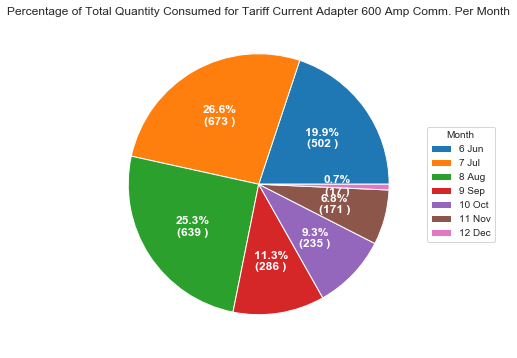

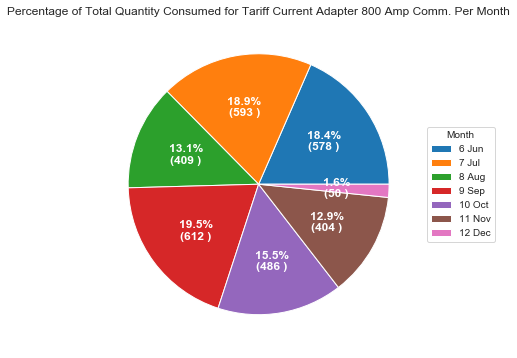

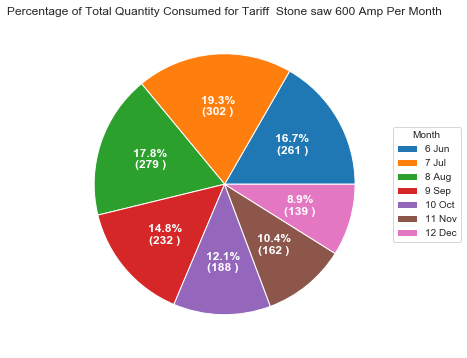

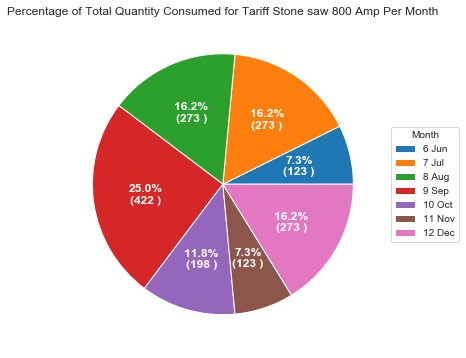

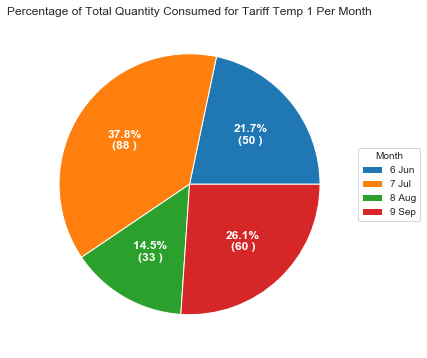

In [106]:
g=df_main.groupby(['TarifNo','Month']).Quantity.sum()
g=g.reset_index()
g1=g.TarifNo.unique()
k=0
for i in g1:
    fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(aspect="equal"))
    month = ["6 Jun","7 Jul","8 Aug","9 Sep","10 Oct","11 Nov","12 Dec"]
    data = df_main.groupby(['TarifNo','Month']).Quantity.sum()[i]
    wedges, texts, autotexts = ax.pie(data, autopct=lambda pct: func(pct, data),
                                  textprops=dict(color="w"))
    ax.legend(wedges, month,title="Month",loc="center left",bbox_to_anchor=(1, 0, 0.5, 1))
    plt.setp(autotexts, size=12, weight="bold")
    ax.set_title("Percentage of Total Quantity Consumed for Tariff "+tarifname_list[k]+" Per Month")
    plt.show()
    k=k+1

Text(0, 0.5, 'Average Quantity Consumed in KWH')

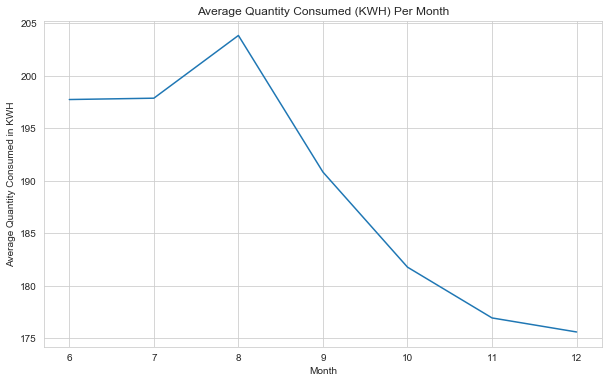

In [146]:
fig = plt.figure(figsize=(10,6))
ax = fig.gca()
sns.set_style("whitegrid")
counts= df_main.groupby('Month').Quantity.mean()
counts.plot.line(ax=ax)
ax.set_title('Average Quantity Consumed (KWH) Per Month')
ax.set_xlabel('Month')
ax.set_ylabel('Average Quantity Consumed in KWH')

Text(0, 0.5, 'Quantity Consumed in KWH')

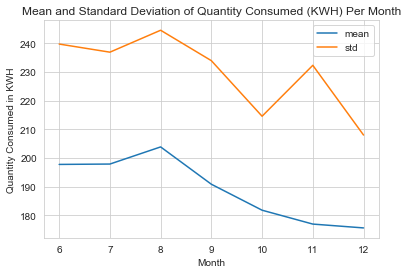

In [49]:
sns.set_style("whitegrid")
counts= df_main.groupby('Month').Quantity.agg(['mean','std'])
counts.plot.line()
plt.title('Mean and Standard Deviation of Quantity Consumed (KWH) Per Month')
plt.xlabel('Month')
plt.ylabel('Quantity Consumed in KWH')

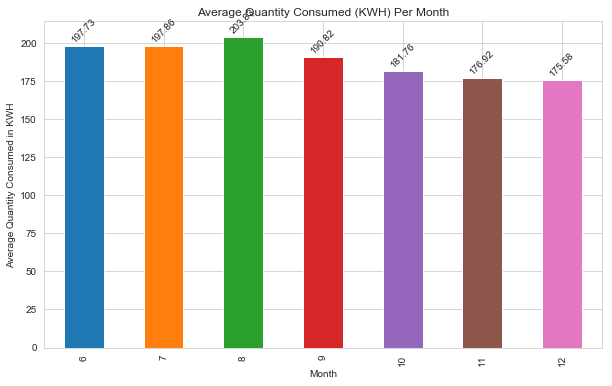

In [147]:
fig = plt.figure(figsize=(10,6))
ax = fig.gca()
sns.set_style("whitegrid")
counts= df_main.groupby('Month').Quantity.mean()
counts.plot.bar(ax=ax)
ax.set_title('Average Quantity Consumed (KWH) Per Month')
ax.set_xlabel('Month')
ax.set_ylabel('Average Quantity Consumed in KWH')
plot_value_labels(fig.gca())

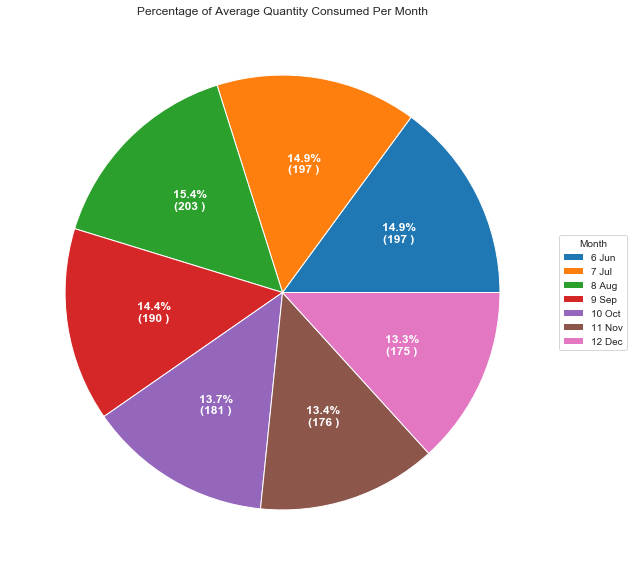

In [148]:
fig, ax = plt.subplots(figsize=(10, 10), subplot_kw=dict(aspect="equal"))
month = ["6 Jun","7 Jul","8 Aug","9 Sep","10 Oct","11 Nov","12 Dec"]
data = df_main.groupby(['Month']).Quantity.mean()
wedges, texts, autotexts = ax.pie(data, autopct=lambda pct: func(pct, data),
                                  textprops=dict(color="w"))
ax.legend(wedges, month,title="Month",loc="center left",bbox_to_anchor=(1, 0, 0.5, 1))
plt.setp(autotexts, size=12, weight="bold")
ax.set_title("Percentage of Average Quantity Consumed Per Month")
plt.show()

Text(0, 0.5, 'Average Quantity Consumed in KWH')

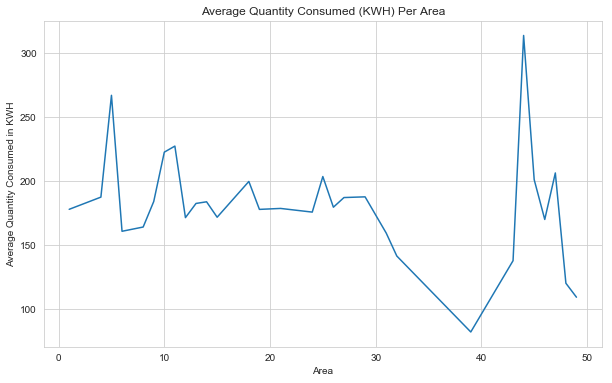

In [149]:
fig = plt.figure(figsize=(10,6))
ax = fig.gca()
sns.set_style("whitegrid")
counts= df_main.groupby('AreaNo').Quantity.mean()
counts.plot.line(ax=ax)
ax.set_title('Average Quantity Consumed (KWH) Per Area')
ax.set_xlabel('Area')
ax.set_ylabel('Average Quantity Consumed in KWH')

Text(0, 0.5, 'Quantity Consumed in KWH')

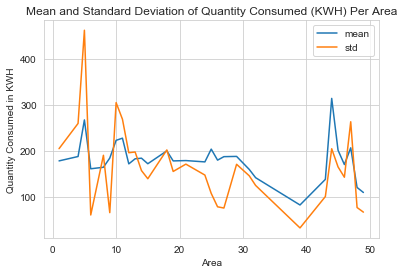

In [50]:
sns.set_style("whitegrid")
counts= df_main.groupby('AreaNo').Quantity.agg(['mean','std'])
counts.plot.line()
plt.title('Mean and Standard Deviation of Quantity Consumed (KWH) Per Area')
plt.xlabel('Area')
plt.ylabel('Quantity Consumed in KWH')

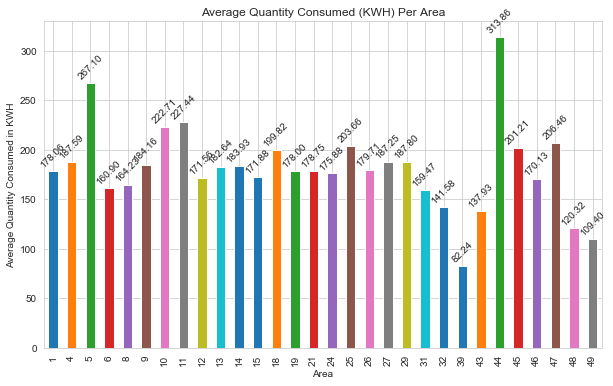

In [150]:
fig = plt.figure(figsize=(10,6))
ax = fig.gca()
sns.set_style("whitegrid")
counts= df_main.groupby('AreaNo').Quantity.mean()
counts.plot.bar(ax=ax)
ax.set_title('Average Quantity Consumed (KWH) Per Area')
ax.set_xlabel('Area')
ax.set_ylabel('Average Quantity Consumed in KWH')
plot_value_labels(fig.gca())

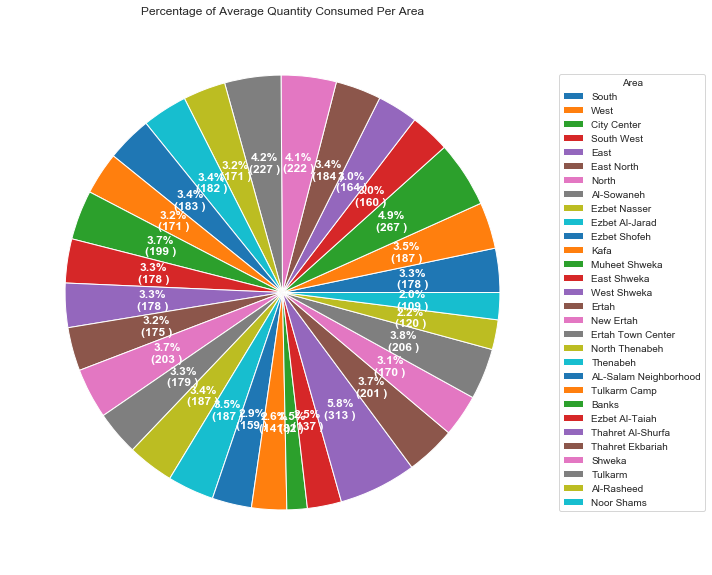

In [222]:
fig, ax = plt.subplots(figsize=(10, 10), subplot_kw=dict(aspect="equal"))
#area = ["6 Jun","7 Jul","8 Aug","9 Sep","10 Oct","11 Nov","12 Dec"]
data = df_main.groupby(['AreaNo']).Quantity.mean()
wedges, texts, autotexts = ax.pie(data, autopct=lambda pct: func(pct, data),
                                  textprops=dict(color="w"))
ax.legend(wedges, areaname_list,title="Area",loc="center left",bbox_to_anchor=(1, 0, 0.5, 1))
plt.setp(autotexts, size=12, weight="bold")
ax.set_title("Percentage of Average Quantity Consumed Per Area")
plt.show()

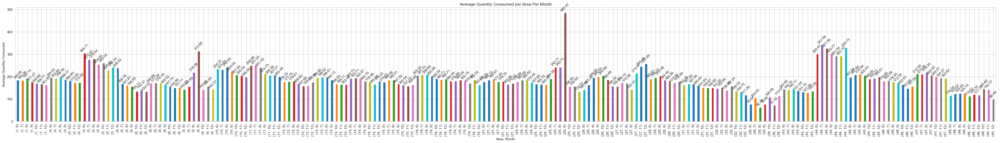

In [153]:
g = df_main.groupby(['AreaNo','Month']).Quantity.mean()
fig = plt.figure(figsize=(50,6))
ax = fig.gca()
sns.set_style("whitegrid")
g.plot.bar(ax=ax)
ax.set_title('Average Quantity Consumed per Area Per Month')
ax.set_xlabel('Area, Month')
ax.set_ylabel('Average Quantity Consumed')
plot_value_labels(fig.gca())

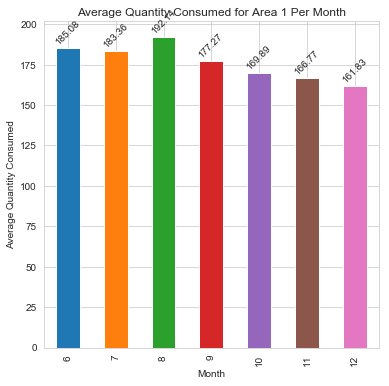

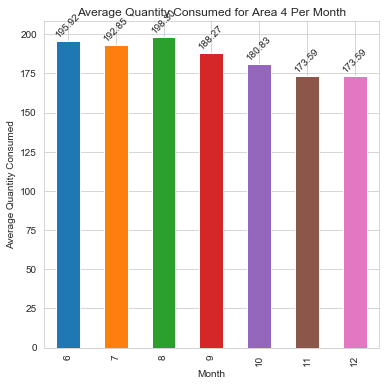

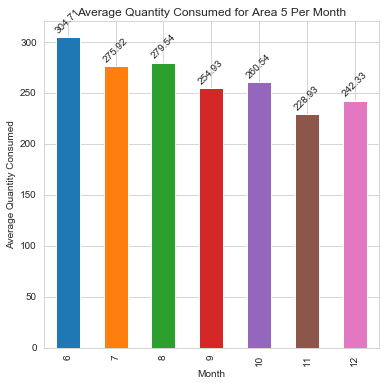

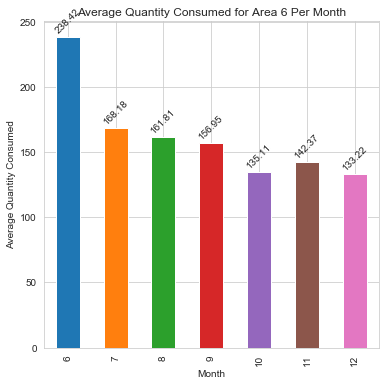

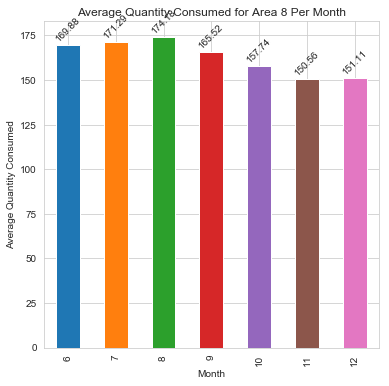

...

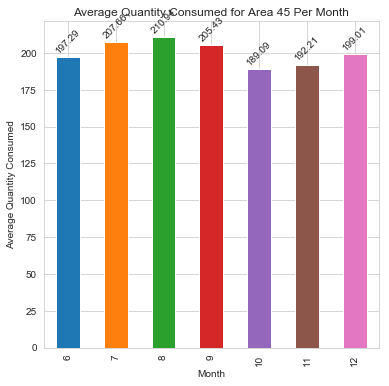

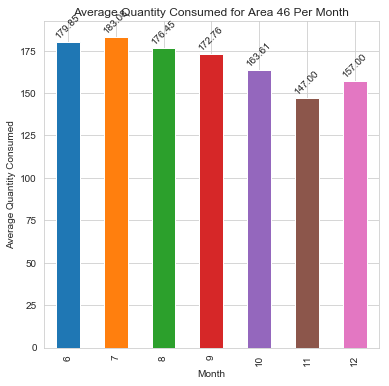

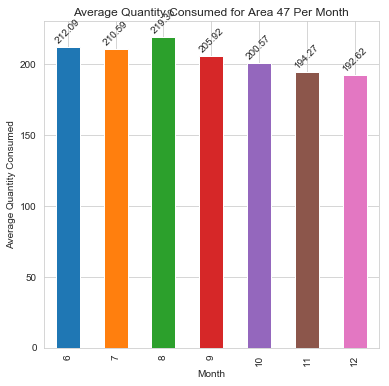

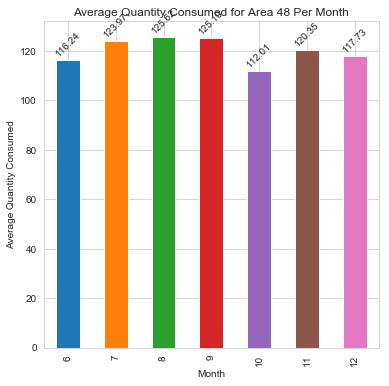

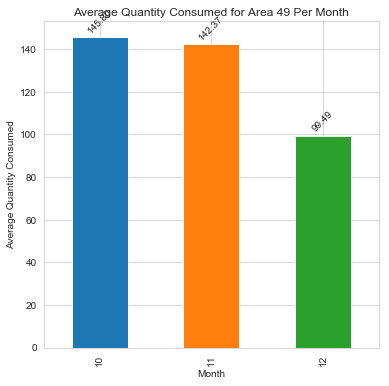

In [154]:
g=df_main.groupby(['AreaNo','Month']).Quantity.mean()
g=g.reset_index()
g1=g.AreaNo.unique()
for i in g1:
    g = df_main.groupby(['AreaNo','Month']).Quantity.mean()[i]
    fig = plt.figure(figsize=(6,6))
    ax = fig.gca()
    sns.set_style("whitegrid")
    g.plot.bar(ax=ax) 
    ax.set_title('Average Quantity Consumed for Area '+str(i)+' Per Month')
    ax.set_xlabel('Month')
    ax.set_ylabel('Average Quantity Consumed')
    plot_value_labels(fig.gca())

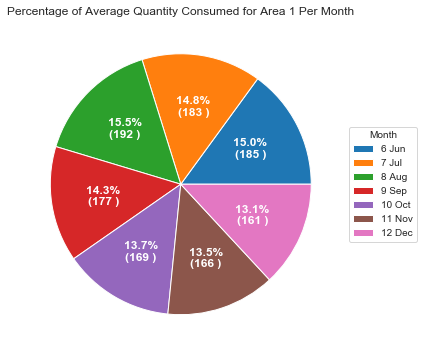

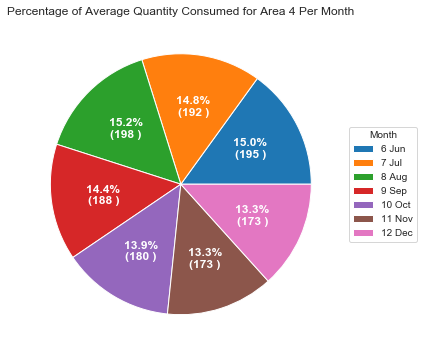

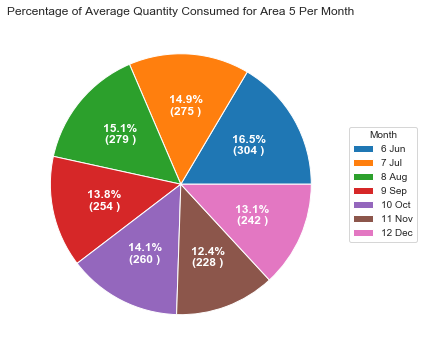

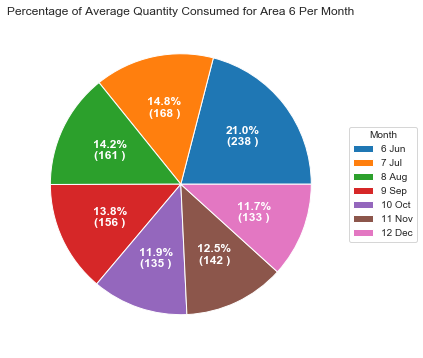

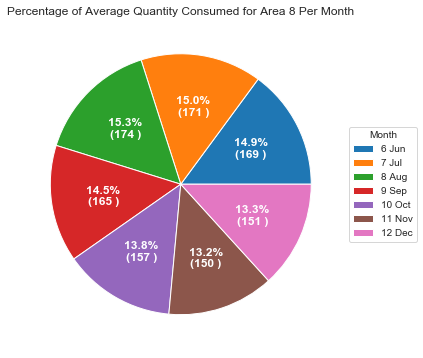

...

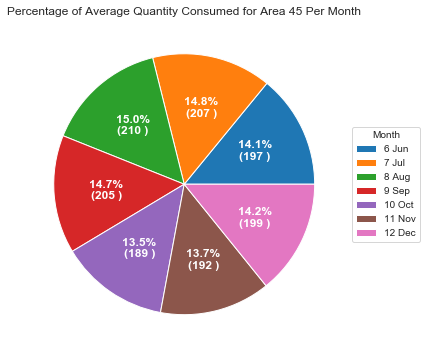

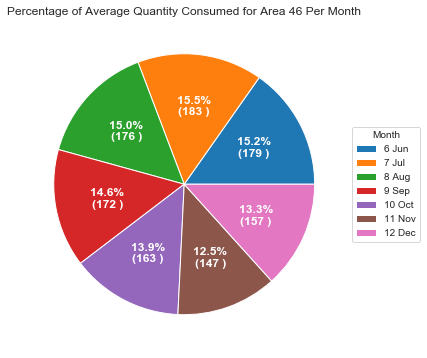

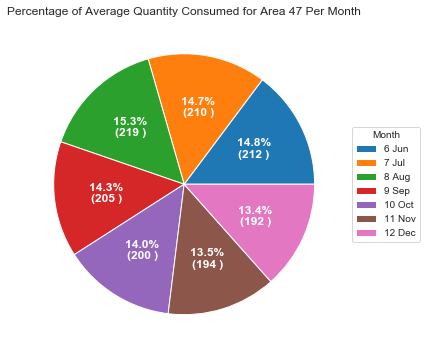

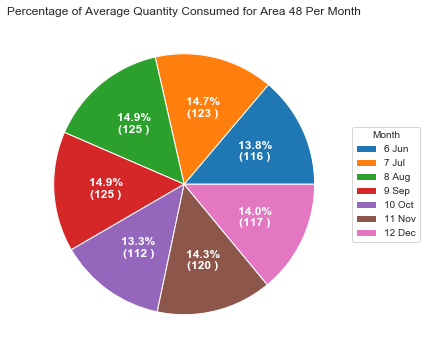

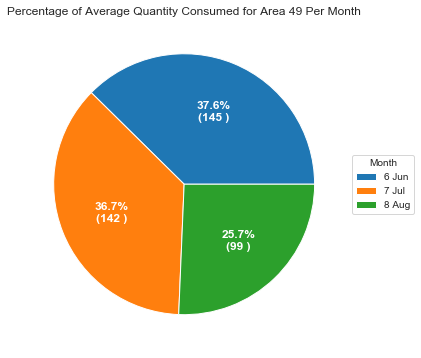

In [155]:
g=df_main.groupby(['AreaNo','Month']).Quantity.mean()
g=g.reset_index()
g1=g.AreaNo.unique()
for i in g1:
    fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(aspect="equal"))
    month = ["6 Jun","7 Jul","8 Aug","9 Sep","10 Oct","11 Nov","12 Dec"]
    data = df_main.groupby(['AreaNo','Month']).Quantity.mean()[i]
    wedges, texts, autotexts = ax.pie(data, autopct=lambda pct: func(pct, data),
                                  textprops=dict(color="w"))
    ax.legend(wedges, month,title="Month",loc="center left",bbox_to_anchor=(1, 0, 0.5, 1))
    plt.setp(autotexts, size=12, weight="bold")
    ax.set_title("Percentage of Average Quantity Consumed for Area "+str(i)+" Per Month")
    plt.show()

Text(0, 0.5, 'Average Quantity Consumed in KWH')

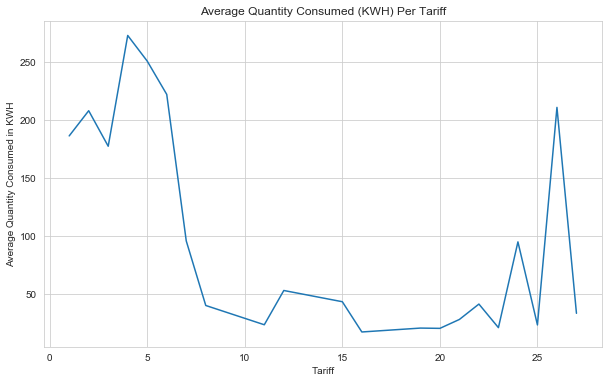

In [51]:
fig = plt.figure(figsize=(10,6))
ax = fig.gca()
sns.set_style("whitegrid")
counts= df_main.groupby('TarifNo').Quantity.mean()
counts.plot.line(ax=ax)
ax.set_title('Average Quantity Consumed (KWH) Per Tariff')
ax.set_xlabel('Tariff')
ax.set_ylabel('Average Quantity Consumed in KWH')

Text(0, 0.5, 'Quantity Consumed in KWH')

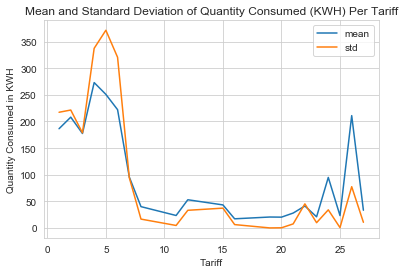

In [52]:
sns.set_style("whitegrid")
counts= df_main.groupby('TarifNo').Quantity.agg(['mean','std'])
counts.plot.line()
plt.title('Mean and Standard Deviation of Quantity Consumed (KWH) Per Tariff')
plt.xlabel('Tariff')
plt.ylabel('Quantity Consumed in KWH')

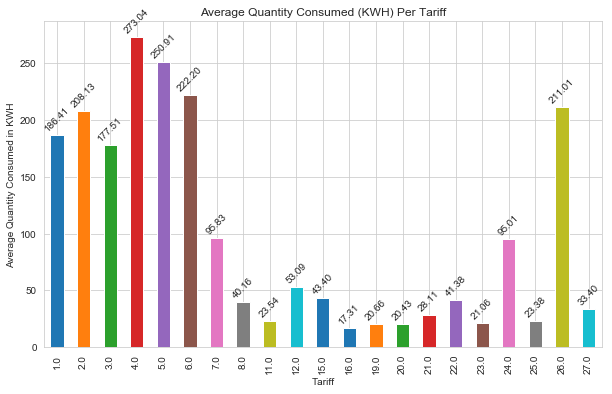

In [53]:
fig = plt.figure(figsize=(10,6))
ax = fig.gca()
sns.set_style("whitegrid")
counts= df_main.groupby('TarifNo').Quantity.mean()
counts.plot.bar(ax=ax)
ax.set_title('Average Quantity Consumed (KWH) Per Tariff')
ax.set_xlabel('Tariff')
ax.set_ylabel('Average Quantity Consumed in KWH')
plot_value_labels(fig.gca())

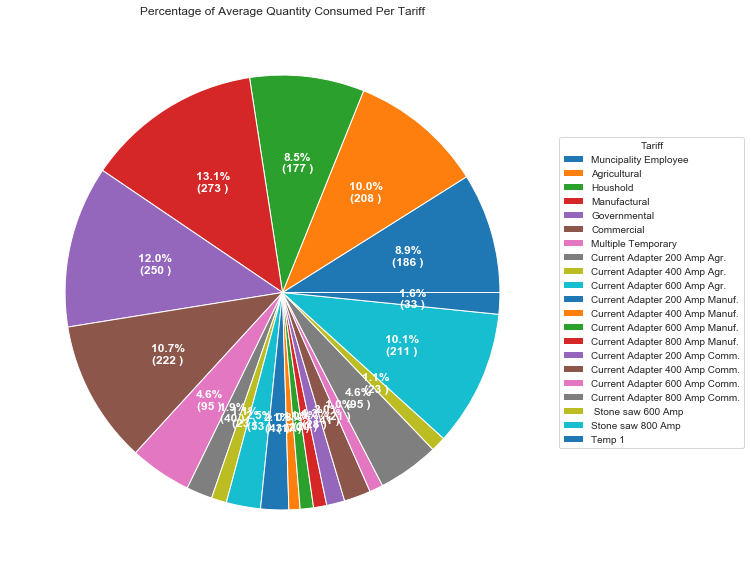

In [225]:
fig, ax = plt.subplots(figsize=(10, 10), subplot_kw=dict(aspect="equal"))
#area = ["6 Jun","7 Jul","8 Aug","9 Sep","10 Oct","11 Nov","12 Dec"]
data = df_main.groupby(['TarifNo']).Quantity.mean()
wedges, texts, autotexts = ax.pie(data, autopct=lambda pct: func(pct, data),
                                  textprops=dict(color="w"))
ax.legend(wedges, tarifname_list,title="Tariff",loc="center left",bbox_to_anchor=(1, 0, 0.5, 1))
plt.setp(autotexts, size=12, weight="bold")
ax.set_title("Percentage of Average Quantity Consumed Per Tariff")
plt.show()

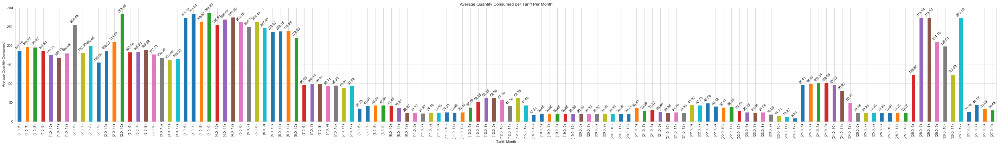

In [55]:
g = df_main.groupby(['TarifNo','Month']).Quantity.mean()
fig = plt.figure(figsize=(50,6))
ax = fig.gca()
sns.set_style("whitegrid")
g.plot.bar(ax=ax)
ax.set_title('Average Quantity Consumed per Tariff Per Month')
ax.set_xlabel('Tariff, Month')
ax.set_ylabel('Average Quantity Consumed')
plot_value_labels(fig.gca())

C:\Users\AbuBaker\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


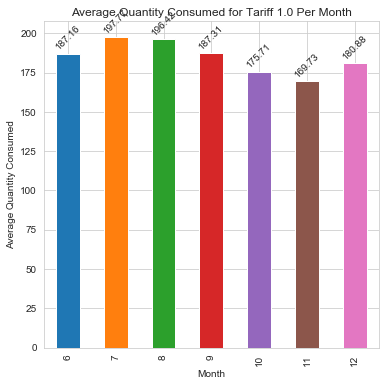

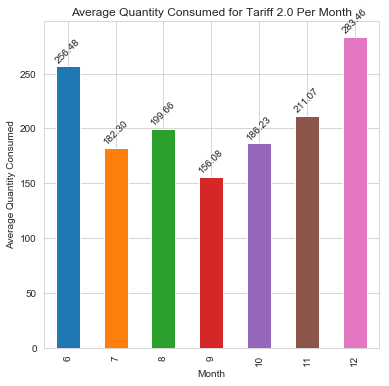

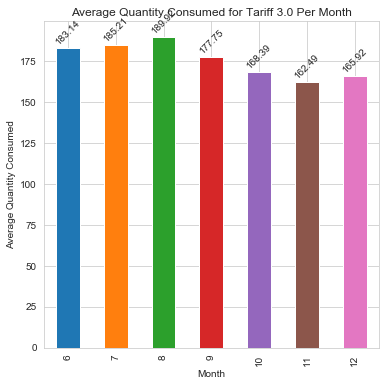

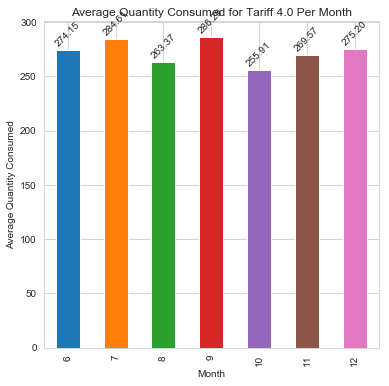

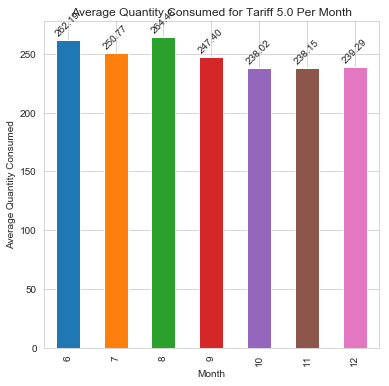

...

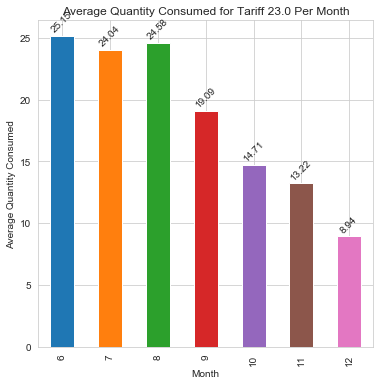

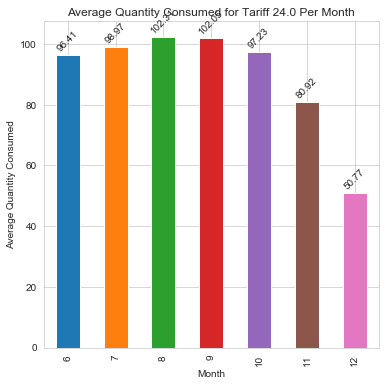

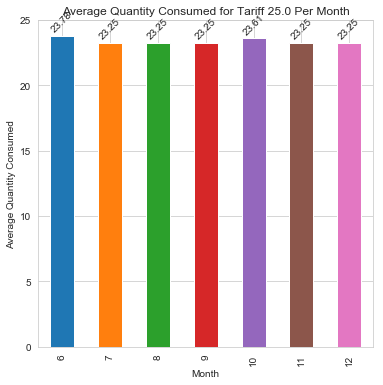

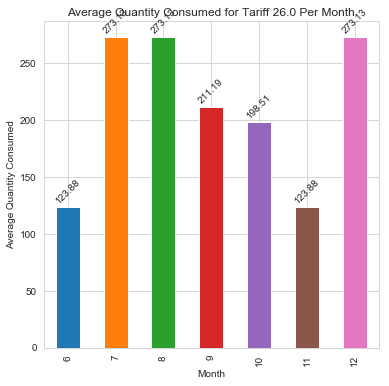

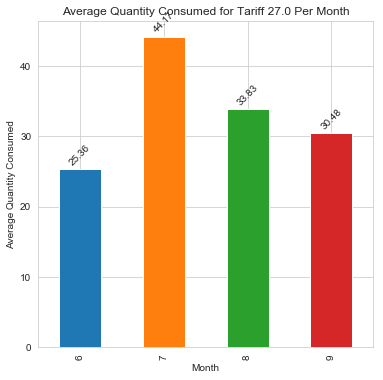

In [56]:
g=df_main.groupby(['TarifNo','Month']).Quantity.mean()
g=g.reset_index()
g1=g.TarifNo.unique()
for i in g1:
    g = df_main.groupby(['TarifNo','Month']).Quantity.mean()[i]
    fig = plt.figure(figsize=(6,6))
    ax = fig.gca()
    sns.set_style("whitegrid")
    g.plot.bar(ax=ax) 
    ax.set_title('Average Quantity Consumed for Tariff '+str(i)+' Per Month')
    ax.set_xlabel('Month')
    ax.set_ylabel('Average Quantity Consumed')
    plot_value_labels(fig.gca())

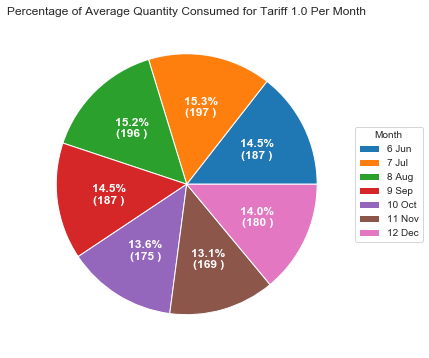

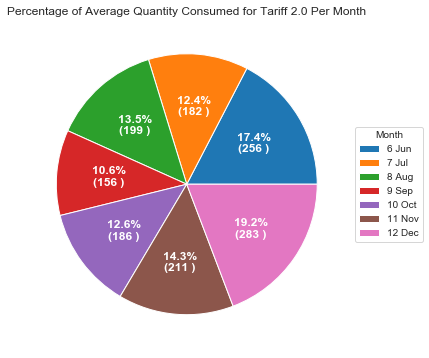

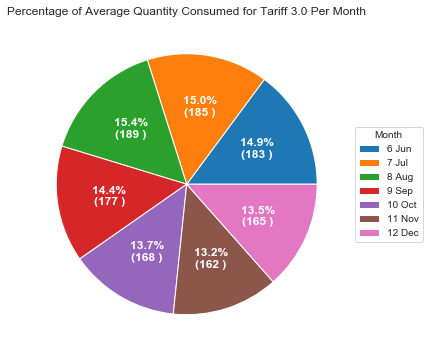

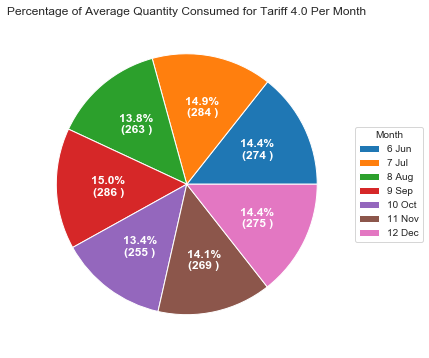

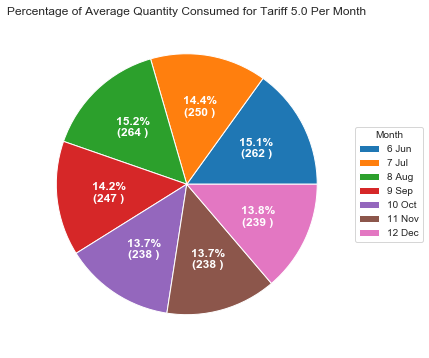

...

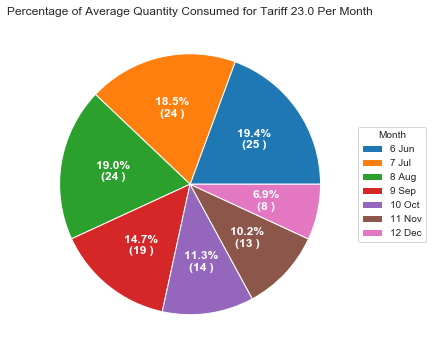

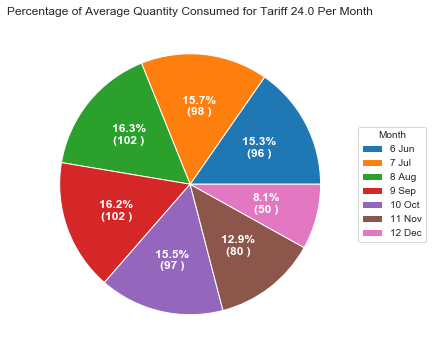

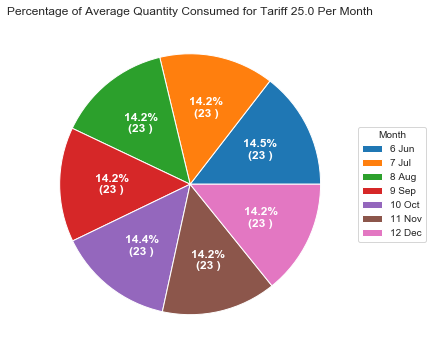

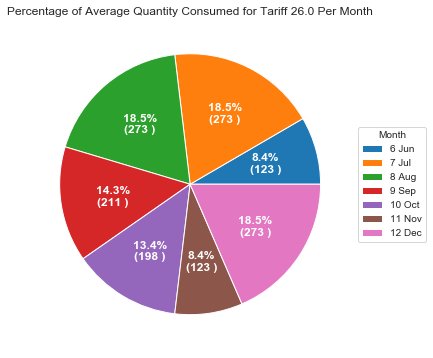

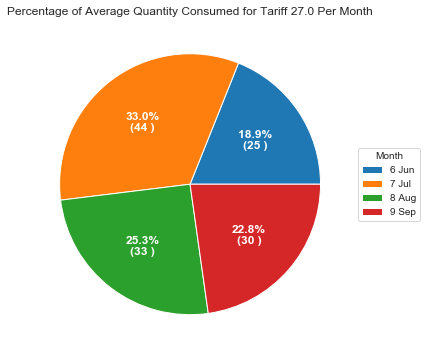

In [57]:
g=df_main.groupby(['TarifNo','Month']).Quantity.mean()
g=g.reset_index()
g1=g.TarifNo.unique()
for i in g1:
    fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(aspect="equal"))
    month = ["6 Jun","7 Jul","8 Aug","9 Sep","10 Oct","11 Nov","12 Dec"]
    data = df_main.groupby(['TarifNo','Month']).Quantity.mean()[i]
    wedges, texts, autotexts = ax.pie(data, autopct=lambda pct: func(pct, data),
                                  textprops=dict(color="w"))
    ax.legend(wedges, month,title="Month",loc="center left",bbox_to_anchor=(1, 0, 0.5, 1))
    plt.setp(autotexts, size=12, weight="bold")
    ax.set_title("Percentage of Average Quantity Consumed for Tariff "+str(i)+" Per Month")
    plt.show()

In [91]:
raw_data={ 
          'AreaNo': df_main['AreaNo'],
          'Quantity' : df_main['Quantity']
        }
newdf = pd.DataFrame( raw_data, columns = pd.Index(['AreaNo','Quantity']))
newdf.head()

,AreaNo,Quantity
0,18,142.367
1,18,113.208
2,24,142.367
3,10,90.909
4,43,82.333


In [92]:
newdf = df_main.copy(deep=True)
newdf.drop(columns=['BillNo','BillDate','ClientNo','Month','DayofWeek','Day','Hour','TarifNo'], inplace=True)
newdf.head()

,Quantity,Total,Price,AreaNo,Season,Period,Peak,WeekEnd
0,142.367,83.0,0.583,18,2,Morning,1,1
1,113.208,66.0,0.583,18,2,Morning,1,1
2,142.367,83.0,0.583,24,2,Morning,1,1
3,90.909,53.0,0.583,10,2,Morning,1,1
4,82.333,48.0,0.583,43,2,Morning,1,1


In [20]:
df_main.head()

,BillNo,BillDate,ClientNo,Quantity,Total,Price,Hour,DayofWeek,Month,Day,AreaNo,TarifNo,Season,Period,Peak,WeekEnd
0,138474,12/1/2018,Y00003798-001,142.367,83.0,0.583,10,5,12,1,18,3.0,2,Morning,1,1
1,617032,12/1/2018,Y00008137-001,113.208,66.0,0.583,10,5,12,1,18,3.0,2,Morning,1,1
2,138477,12/1/2018,Y00015731-001,142.367,83.0,0.583,10,5,12,1,24,3.0,2,Morning,1,1
3,6074,12/1/2018,Y00009576-001,90.909,53.0,0.583,10,5,12,1,10,3.0,2,Morning,1,1
4,138479,12/1/2018,Y00002741-001,82.333,48.0,0.583,10,5,12,1,43,3.0,2,Morning,1,1


Text(0.5, 1.0, 'Average quantity consumed and the total money for each bill VS Area')

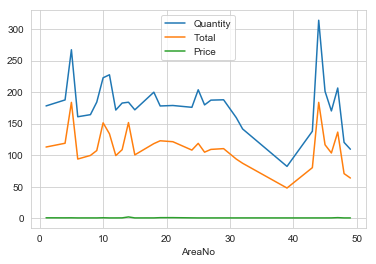

In [141]:
g = newdf.groupby('AreaNo').mean()
sns.set_style("whitegrid")
g.plot()
ax.set_title('Average quantity consumed and the total money for each bill VS Area')

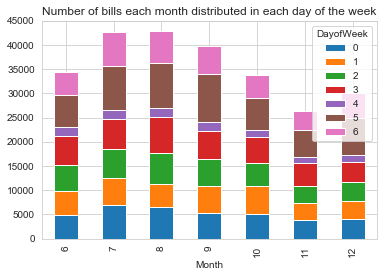

In [94]:
df_main.groupby(['Month','DayofWeek']).size().unstack().plot(kind='bar',stacked=True)
plt.title('Number of bills each month distributed in each day of the week')
plt.show()

In [ ]:
df_main.groupby(['Month','DayofWeek']).size().unstack().plot(kind='bar',stacked=True)
plt.title('Number of bills each month distributed in each day of the week')
plt.show()

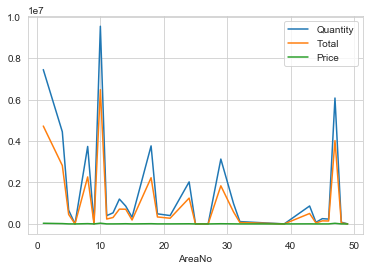

In [143]:
g=newdf.groupby('AreaNo').sum()
g.plot()

In [96]:
newdf = df_main.copy(deep=True)
newdf.drop(columns=['BillNo','BillDate','ClientNo','Month','DayofWeek','Day','Hour','Price','Total','TarifNo'], inplace=True)
#newdf.head()
newdf.head()

,Quantity,AreaNo,Season,Period,Peak,WeekEnd
0,142.367,18,2,Morning,1,1
1,113.208,18,2,Morning,1,1
2,142.367,24,2,Morning,1,1
3,90.909,10,2,Morning,1,1
4,82.333,43,2,Morning,1,1


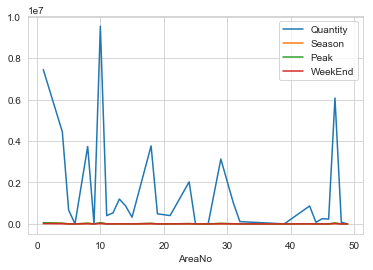

In [98]:
g = newdf.groupby('AreaNo').sum()
g.plot()

Text(0, 0.5, 'Total Quantity in KWH ')

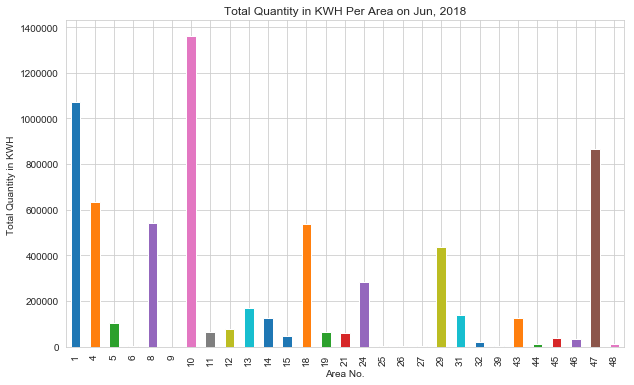

In [99]:
fig = plt.figure(figsize=(10,6))
ax = fig.gca()
sns.set_style("whitegrid")
counts=(df_main.groupby(['Month','AreaNo']).Quantity.sum())[6] # 6 means Jun, 2018
counts.plot.bar(ax=ax)
ax.set_title('Total Quantity in KWH Per Area on Jun, 2018')
ax.set_xlabel('Area No.')
ax.set_ylabel('Total Quantity in KWH ')

Text(0, 0.5, 'Total Quantity in KWH ')

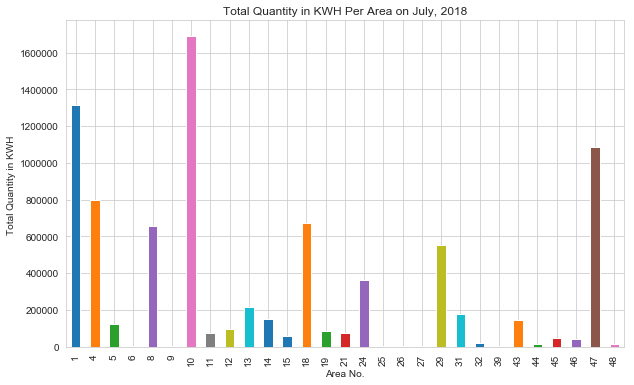

In [100]:
fig = plt.figure(figsize=(10,6))
ax = fig.gca()
sns.set_style("whitegrid")
counts=(df_main.groupby(['Month','AreaNo']).Quantity.sum())[7] # 7 means July, 2018
counts.plot.bar(ax=ax)
ax.set_title('Total Quantity in KWH Per Area on July, 2018')
ax.set_xlabel('Area No.')
ax.set_ylabel('Total Quantity in KWH ')

In [ ]:
fig = plt.figure(figsize=(10,6))
ax = fig.gca()
sns.set_style("whitegrid")
counts=(df_main.groupby(['Month','AreaNo']).Quantity.sum())[8] # 8 means August, 2018
counts.plot.bar(ax=ax)
ax.set_title('Total Quantity in KWH Per Area on August, 2018')
ax.set_xlabel('Area No.')
ax.set_ylabel('Total Quantity in KWH ')

In [ ]:
fig = plt.figure(figsize=(10,6))
ax = fig.gca()
sns.set_style("whitegrid")
counts=(df_main.groupby(['Month','AreaNo']).Quantity.sum())[9] # 9 means September, 2018
counts.plot.bar(ax=ax)
ax.set_title('Total Quantity in KWH Per Area on September, 2018')
ax.set_xlabel('Area No.')
ax.set_ylabel('Total Quantity in KWH ')

In [ ]:
fig = plt.figure(figsize=(10,6))
ax = fig.gca()
sns.set_style("whitegrid")
counts=(df_main.groupby(['Month','AreaNo']).Quantity.sum())[10] # 10 means October, 2018
counts.plot.bar(ax=ax)
ax.set_title('Total Quantity in KWH Per Area on October, 2018')
ax.set_xlabel('Area No.')
ax.set_ylabel('Total Quantity in KWH ')

In [ ]:
fig = plt.figure(figsize=(10,6))
ax = fig.gca()
sns.set_style("whitegrid")
counts=(df_main.groupby(['Month','AreaNo']).Quantity.sum())[11] # 11 means November, 2018
counts.plot.bar(ax=ax)
ax.set_title('Total Quantity in KWH Per Area on November, 2018')
ax.set_xlabel('Area No.')
ax.set_ylabel('Total Quantity in KWH ')

In [ ]:
fig = plt.figure(figsize=(10,6))
ax = fig.gca()
sns.set_style("whitegrid")
counts=(df_main.groupby(['Month','AreaNo']).Quantity.sum())[12] # 12 means December, 2018
counts.plot.bar(ax=ax)
ax.set_title('Total Quantity in KWH Per Area on December, 2018')
ax.set_xlabel('Area No.')
ax.set_ylabel('Total Quantity in KWH ')

In [ ]:
counts= (df.groupby(['Month','AreaNo']).Quantity.sum())[6]
counts

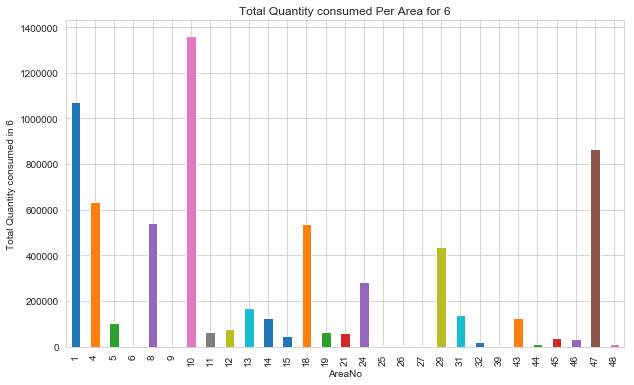

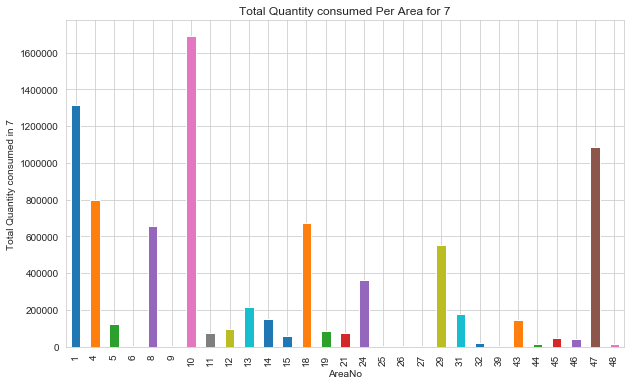

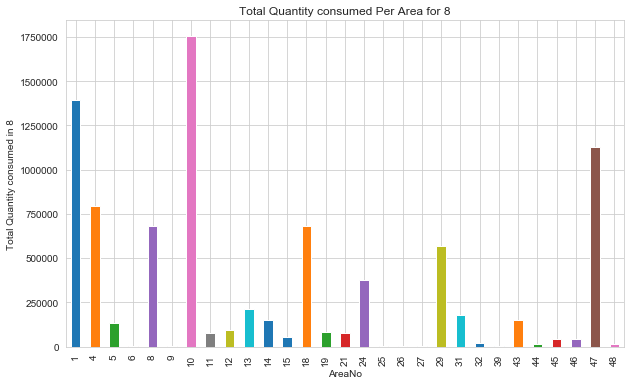

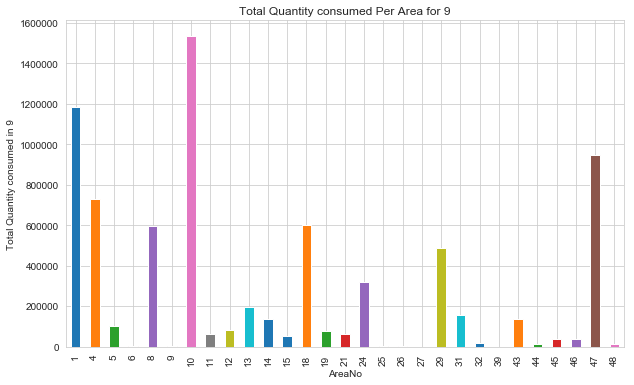

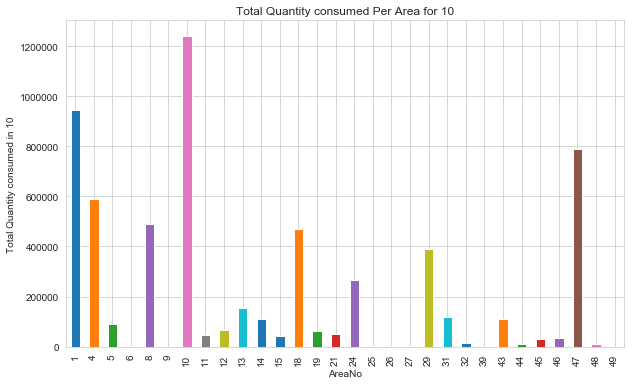

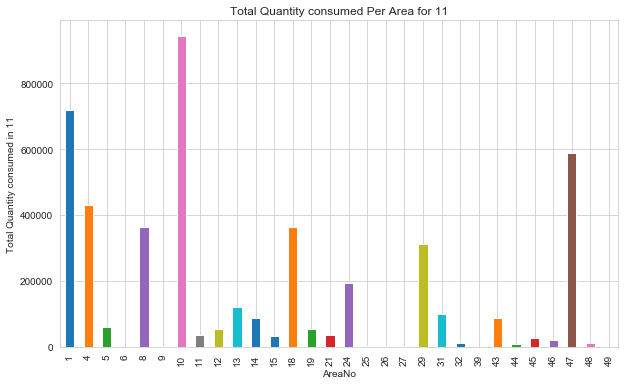

In [105]:
for i in [6,7,8,9,10,11]:
    fig = plt.figure(figsize=(10,6))
    ax = fig.gca()
    sns.set_style("whitegrid")
    #counts = df.groupby(['AreaNo','Month'])[1].Quantity.sum()
    counts= df_main.groupby(['Month','AreaNo']).Quantity.sum()[i]
    counts.plot.bar(ax=ax)
    ax.set_title('Total Quantity consumed Per Area for '+str(i))
    ax.set_xlabel('AreaNo')
    ax.set_ylabel('Total Quantity consumed in '+str(i))

# ==================== Outliers Deduction ============

Text(0, 0.5, 'Total Quantity consumed')

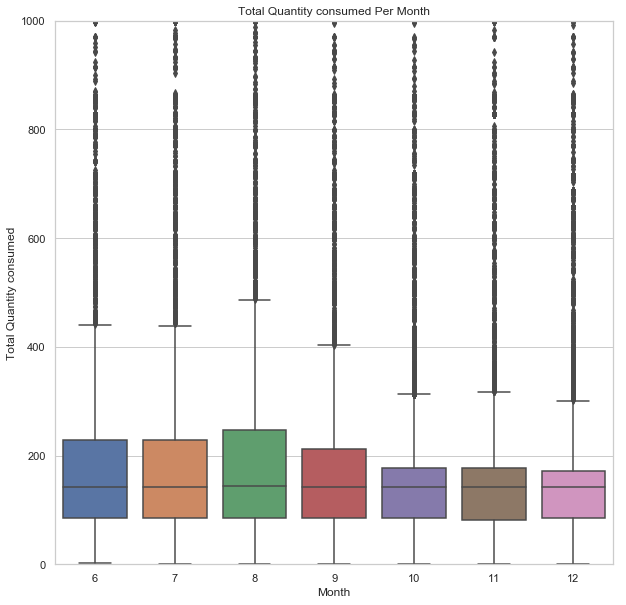

In [97]:
import seaborn as sns
sns.set(style="whitegrid")
fig = plt.figure(figsize=(10,10))
plt.xlim(0, 12)
plt.ylim(0, 1000)
ax = sns.boxplot(x=df_main['Month'],y=df_main["Quantity"])
ax.set_title('Total Quantity consumed Per Month')
ax.set_ylabel('Total Quantity consumed')